In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# import libs
import pandas as pd
import plotly
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
import scipy.stats as stats
from sklearn.calibration import calibration_curve
import optuna
import optuna.visualization as ov
from optuna.samplers import TPESampler
import os
import pickle

In [3]:
gpu_test = xgb.XGBClassifier(tree_method="gpu_hist")
print("GPU is available:", gpu_test.get_params()["tree_method"] == "gpu_hist")

GPU is available: True


In [4]:
# load dataset
df = pd.read_csv("data/online_gaming_behavior_dataset_preprocessed.csv")

df.head()

,PlayerID,Age,Gender,PlayTimeHours,InGamePurchases,GameDifficulty,SessionsPerWeek,AvgSessionDurationMinutes,PlayerLevel,AchievementsUnlocked,EngagementLevel,AvgPlayTimePerWeek,isAddicted,Location_Europe,Location_Other,Location_USA,Genre_RPG,Genre_Simulation,Genre_Sports,Genre_Strategy
0,9000,43,0,16.271119,0,1,6,108,79,25,1,648,0,False,True,False,False,False,False,True
1,9001,29,1,5.525961,0,1,5,144,11,10,1,720,0,False,False,True,False,False,False,True
2,9002,22,1,8.223755,0,0,16,142,35,41,2,2272,1,False,False,True,False,False,True,False
3,9003,35,0,5.265351,1,0,9,85,57,47,1,765,0,False,False,True,False,False,False,False
4,9004,33,0,15.531945,0,1,2,131,95,37,1,262,0,True,False,False,False,False,False,False


In [5]:
# Split dataset

X = df.drop(columns=["EngagementLevel", "PlayerID"]) # remove target feature, PlayerID and add rest to train set
y = df["EngagementLevel"] # set target variable

# 75% train set, 25% test set, random_state=42 for reproducibility, stratify to prevent class imbalance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

print(f"Training Set: X_train = {X_train.shape}, y_train = {y_train.shape}")
print(f"Testing Set: X_test = {X_test.shape}, y_test = {y_test.shape}")

Training Set: X_train = (30025, 18), y_train = (30025,)
Testing Set: X_test = (10009, 18), y_test = (10009,)


In [6]:
# Standardize data
# Standardization is done after data splitting to prevent data-leakage
# from Exploratory Data Analysis, we saw that there aren't any outliers in the data, so we can rule out Robust scaling
# XGBoost doesn't need [0, 1] scaling so we can rule out Min-Max scaling
# However, the numerical features all have different scales, so the best option is Standard scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [7]:
def visualize_model_performance(y_true, y_pred, model_name, class_labels=None):
    if class_labels is None:
        class_labels = np.unique(y_true)

    fig, axes = plt.subplots(2, 2, figsize=(14, 12), gridspec_kw={"wspace": 0.175, "hspace": 0.25})
    fig.suptitle(f"Classification Performance - {model_name}", fontsize=16, x=0.6)
    fig.subplots_adjust(right=1.05, top=0.8)

    # Conf matrix
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(
        cm, annot=True, cmap='flare', fmt='d', linewidths=0.5, linecolor='black',
        annot_kws={"size": 10, "weight": "bold"}, cbar_kws={'shrink': 0.75}, ax=axes[0, 0]
    )
    axes[0, 0].set_title("Confusion Matrix", fontsize=14)
    for text in axes[0, 0].texts:
        text.set_color("white")
    for _, spine in axes[0, 0].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1)

    # legend for the entire canvas containing class labels
    legend_labels = ["0 → Low", "1 → Medium", "2 → High"]
    legend_text = "Engagement Level\n\n" + "\n".join(legend_labels)
    fig.text(1, 0.925, legend_text, fontsize=12, verticalalignment="top",
             bbox=dict(facecolor="white", alpha=0.8, edgecolor="black"))

    # Bar-chart for Per-Class Accuracy
    class_acc = np.divide(cm.diagonal(), cm.sum(axis=1, where=cm.sum(axis=1) != 0), out=np.zeros_like(cm.diagonal(), dtype=float), where=cm.sum(axis=1) != 0)
    colors = plt.cm.Set3(np.linspace(0, 1, len(class_labels)))
    sns.barplot(x=class_labels, y=class_acc, palette=colors, ax=axes[0, 1])
    axes[0, 1].set_xlabel("Classes")
    axes[0, 1].set_ylabel("Accuracy")
    axes[0, 1].set_title("Per-Class Accuracy", fontsize=14)
    axes[0, 1].set_ylim(0, 1)
    for index, value in enumerate(class_acc):
        axes[0, 1].text(index, value - 0.05, f"{value:.3f}", ha="center", fontsize=10, color="black", fontstyle="italic")

    # Weighted Misclassification Heatmap
    cm_weighted = cm / cm.sum(axis=1, where=cm.sum(axis=1) != 0).reshape(-1, 1)
    sns.heatmap(cm_weighted, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=class_labels, yticklabels=class_labels, ax=axes[1, 0], linewidths=0.5, linecolor="black", cbar_kws={'shrink': 0.75})
    axes[1, 0].set_xlabel("Predicted Label")
    axes[1, 0].set_ylabel("True Label")
    axes[1, 0].set_title("Misclassification Heatmap", fontsize=14)
    for _, spine in axes[1, 0].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1)

    # Prediction Distribution
    sns.violinplot(x=y_true, y=y_pred, inner="point", palette="coolwarm", ax=axes[1, 1])
    axes[1, 1].set_xlabel("True Label")
    axes[1, 1].set_ylabel("Predicted Label")
    axes[1, 1].set_title("Prediction Distribution Per Class", fontsize=14)
    
    plt.show()

In [8]:
# Baseline Model Training

baseline_model_path = "models/baseline_xgboost_model.pkl"

# convert data to DMatrix format for XGBoost model
dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_test, label=y_test)

if os.path.exists(baseline_model_path):
    print("Loading existing Baseline Model...\n")
    with open(baseline_model_path, "rb") as file:
        baseline_model = pickle.load(file)
else:
    # Set standard default parameters for XGBoost
    baseline_params = {
        "objective": "multi:softmax",
        "num_class": len(set(y_train)),
        "eval_metric": "mlogloss",
        "tree_method": "gpu_hist",
        "learning_rate": 0.3,
        "max_depth": 6,
        "min_child_weight": 1,
        "subsample": 1.0,
        "colsample_bytree": 1.0,
        "gamma": 0,
        "lambda": 1,
        "alpha": 0,
        "n_estimators": 100,
        "enable_categorical": True
    }

    baseline_model = xgb.train(
        baseline_params,
        dtrain,
        num_boost_round=100,
        evals=[(dvalid, "eval")],
        early_stopping_rounds=10,
        verbose_eval=False
    )

    with open(baseline_model_path, "wb") as file:
        pickle.dump(baseline_model, file)
        
    print(f"Model saved to {baseline_model_path}\n")

y_pred_baseline = baseline_model.predict(dvalid) # predict using test data

# get accuracy metrics
accuracy = accuracy_score(y_test, y_pred_baseline)
f1 = f1_score(y_test, y_pred_baseline, average="weighted")

# print metrics
print(f"Baseline Model Performance:")
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print("\nClassifcation Report:\n", classification_report(y_test, y_pred_baseline))

Loading existing Baseline Model...

Baseline Model Performance:
Accuracy: 0.9273653711659506
F1 Score: 0.9271427192292842

Classifcation Report:
               precision    recall  f1-score   support

           0       0.92      0.90      0.91      2581
           1       0.93      0.96      0.94      4844
           2       0.93      0.90      0.91      2584

    accuracy                           0.93     10009
   macro avg       0.93      0.92      0.92     10009
weighted avg       0.93      0.93      0.93     10009



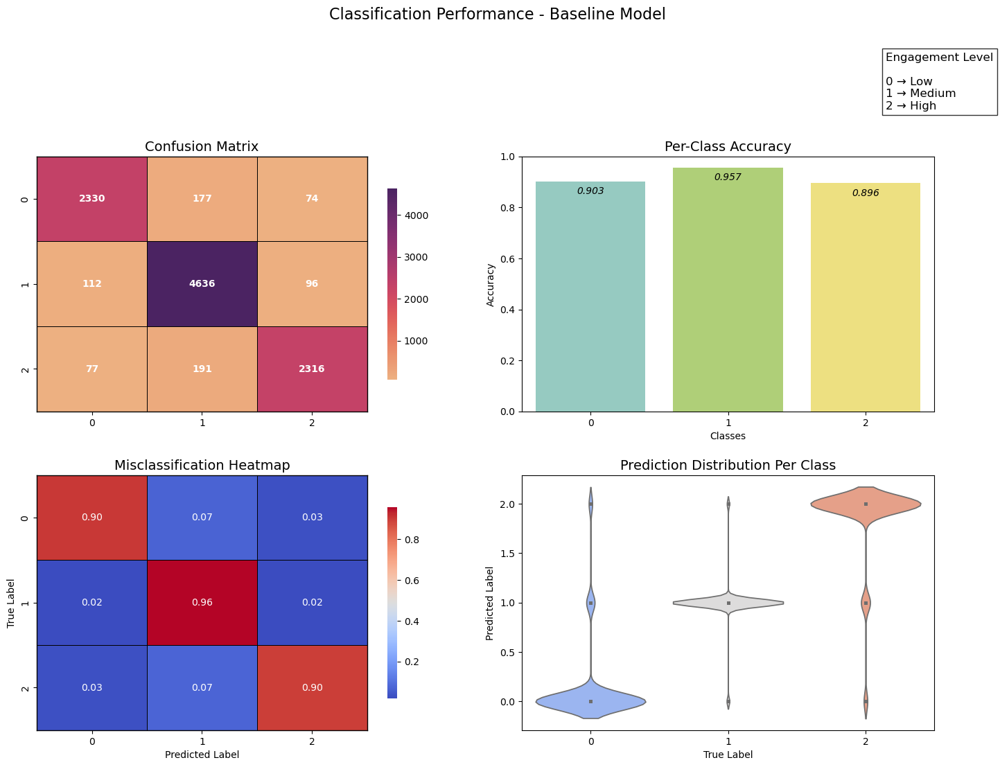

In [9]:
# Model Performance - Baseline
visualize_model_performance(y_test, y_pred_baseline, "Baseline Model")

In [10]:
# Find best hyperparameters for the XGBoost model using Optuna

# Define Objective function for running the study
def objective(trial):
    # Hyperparameter search space
    params = {
        "objective": "multi:softmax",
        "num_class": len(set(y_train)),
        "eval_metric": "mlogloss",
        "tree_method": "gpu_hist",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 1.0, log=True),
        "max_depth": trial.suggest_int("max_depth", 3, 32),
        "min_child_weight": trial.suggest_categorical("min_child_weight", [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 
        "subsample": trial.suggest_float("subsample", 0.001, 1.0, log=True),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.001, 1.0, log=True),
        "gamma": trial.suggest_float("gamma", 1e-8, 1.0, log=True),
        "lambda": trial.suggest_float("lambda", 0.001, 10.0, log=True),
        "alpha": trial.suggest_float("alpha", 0.001, 10.0, log=True),
        "eta": trial.suggest_float("eta", 1e-8, 1.0, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [32, 64, 128, 256, 512, 768, 1024, 1536, 2048, 3096, 4096, 5120]),
        "enable_categorical": trial.suggest_categorical("enable_categorical", [True]),
    }

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dvalid = xgb.DMatrix(X_test, label=y_test)

    model = xgb.train(params, dtrain, num_boost_round=100, evals=[(dvalid, "eval")], early_stopping_rounds=10, verbose_eval=False)

    y_pred = model.predict(dvalid)

    # We maximize based on accuracy
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

In [11]:
study = optuna.create_study(direction="maximize", sampler=TPESampler())
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2025-02-13 09:43:08,731] A new study created in memory with name: no-name-750b77de-c9cf-4f13-810e-1cfb849fe3e5
Best trial: 0. Best value: 0.896393:   0%|▎                                                                                 | 2/500 [00:00<01:20,  6.19it/s]

[I 2025-02-13 09:43:08,919] Trial 0 finished with value: 0.8963932460785293 and parameters: {'learning_rate': 0.0657635044714638, 'max_depth': 9, 'min_child_weight': 16, 'subsample': 0.013156124588745266, 'colsample_bytree': 0.6605274192043291, 'gamma': 0.006783673369110288, 'lambda': 1.1060970492447686, 'alpha': 1.1185600224017411, 'eta': 2.3906289698691368e-08, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.
[I 2025-02-13 09:43:09,065] Trial 1 finished with value: 0.8102707563193127 and parameters: {'learning_rate': 0.04969435928364912, 'max_depth': 7, 'min_child_weight': 9, 'subsample': 0.00587154875222455, 'colsample_bytree': 0.014990268681433785, 'gamma': 5.0759336436598585e-05, 'lambda': 0.01035123660296686, 'alpha': 0.010914502176492086, 'eta': 3.216754172395646e-08, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.


Best trial: 0. Best value: 0.896393:   1%|▍                                                                                 | 3/500 [00:00<01:18,  6.34it/s]

[I 2025-02-13 09:43:09,218] Trial 2 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.01184637077768423, 'max_depth': 14, 'min_child_weight': 8, 'subsample': 0.00471012369124459, 'colsample_bytree': 0.030952939952257792, 'gamma': 3.2168212602756436e-08, 'lambda': 0.060988384455985305, 'alpha': 0.041479966333320364, 'eta': 4.321605231893742e-08, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.


Best trial: 0. Best value: 0.896393:   1%|▊                                                                                 | 5/500 [00:01<01:36,  5.12it/s]

[I 2025-02-13 09:43:09,584] Trial 3 finished with value: 0.8703167149565391 and parameters: {'learning_rate': 0.0030231769092618943, 'max_depth': 27, 'min_child_weight': 14, 'subsample': 0.03271634644894365, 'colsample_bytree': 0.25646432094784727, 'gamma': 6.22900253739535e-06, 'lambda': 0.0031784105855165697, 'alpha': 0.0018477008653774655, 'eta': 6.872369107848446e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.
[I 2025-02-13 09:43:09,701] Trial 4 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.02523440937083897, 'max_depth': 8, 'min_child_weight': 10, 'subsample': 0.0018816235634370488, 'colsample_bytree': 0.11500330486992652, 'gamma': 0.00013086732895900707, 'lambda': 6.025545953626883, 'alpha': 0.035166741934154935, 'eta': 4.536097315849921e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.
[I 2025-02-13 09:43:09,758] Trial 5 finished with value: 

Best trial: 0. Best value: 0.896393:   2%|█▍                                                                                | 9/500 [00:01<00:52,  9.27it/s]

[I 2025-02-13 09:43:09,860] Trial 6 finished with value: 0.8910980117893895 and parameters: {'learning_rate': 0.5251814633477574, 'max_depth': 30, 'min_child_weight': 6, 'subsample': 0.007807835219958859, 'colsample_bytree': 0.14514005523004758, 'gamma': 0.06910017181890624, 'lambda': 0.053261105559748466, 'alpha': 0.01005914538788513, 'eta': 5.49210719395058e-06, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.
[I 2025-02-13 09:43:09,897] Trial 7 finished with value: 0.8840043960435608 and parameters: {'learning_rate': 0.7871130391686694, 'max_depth': 9, 'min_child_weight': 20, 'subsample': 0.007286623669686472, 'colsample_bytree': 0.362237448674409, 'gamma': 6.899741921408318e-05, 'lambda': 0.0800278287627085, 'alpha': 1.7415377694626428, 'eta': 3.110044911081398e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.
[I 2025-02-13 09:43:09,996] Trial 8 finished with value: 0.483964432011

Best trial: 0. Best value: 0.896393:   2%|█▊                                                                               | 11/500 [00:01<01:02,  7.85it/s]

[I 2025-02-13 09:43:10,177] Trial 9 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.0024429357452049917, 'max_depth': 28, 'min_child_weight': 9, 'subsample': 0.019318343629688595, 'colsample_bytree': 0.08847687960894861, 'gamma': 1.1535620703006499e-05, 'lambda': 0.004644899345330429, 'alpha': 0.013124045660869176, 'eta': 0.0015968538926587675, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.
[I 2025-02-13 09:43:10,315] Trial 10 finished with value: 0.8868018783095214 and parameters: {'learning_rate': 0.16697597408497902, 'max_depth': 21, 'min_child_weight': 16, 'subsample': 0.28305735747894656, 'colsample_bytree': 0.0015212473391453543, 'gamma': 0.9406345680805218, 'lambda': 1.3760751734709684, 'alpha': 0.6075785186711656, 'eta': 0.4840931790937407, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 0 with value: 0.8963932460785293.


Best trial: 11. Best value: 0.900689:   2%|█▊                                                                              | 11/500 [00:01<01:02,  7.85it/s]

[I 2025-02-13 09:43:10,396] Trial 11 finished with value: 0.9006893795583975 and parameters: {'learning_rate': 0.9450353351413681, 'max_depth': 19, 'min_child_weight': 6, 'subsample': 0.04918067717720057, 'colsample_bytree': 0.7549306834879435, 'gamma': 0.021010819502357, 'lambda': 0.5707241022775397, 'alpha': 0.20416044543466141, 'eta': 3.7669232436109124e-07, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 11 with value: 0.9006893795583975.


Best trial: 12. Best value: 0.925467:   3%|██                                                                              | 13/500 [00:01<01:07,  7.22it/s]

[I 2025-02-13 09:43:10,635] Trial 12 finished with value: 0.9254670796283345 and parameters: {'learning_rate': 0.22439119586646153, 'max_depth': 18, 'min_child_weight': 6, 'subsample': 0.13216920130694002, 'colsample_bytree': 0.9717094592998378, 'gamma': 0.007205888673219406, 'lambda': 0.6188802901732859, 'alpha': 0.38732478180510765, 'eta': 9.103866351737933e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 12 with value: 0.9254670796283345.


Best trial: 12. Best value: 0.925467:   3%|██▏                                                                             | 14/500 [00:02<01:13,  6.59it/s]

[I 2025-02-13 09:43:10,840] Trial 13 finished with value: 0.923368967928864 and parameters: {'learning_rate': 0.23304415292242786, 'max_depth': 19, 'min_child_weight': 6, 'subsample': 0.10406416769101899, 'colsample_bytree': 0.9258639647117411, 'gamma': 0.017146825452430382, 'lambda': 0.5345144127908106, 'alpha': 0.24686426287351934, 'eta': 1.2699465276772285e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 12 with value: 0.9254670796283345.


Best trial: 14. Best value: 0.925967:   3%|██▍                                                                             | 15/500 [00:02<01:19,  6.09it/s]

[I 2025-02-13 09:43:11,047] Trial 14 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.26368470743241723, 'max_depth': 23, 'min_child_weight': 6, 'subsample': 0.16944081177149578, 'colsample_bytree': 0.960906399797592, 'gamma': 0.001984282161520493, 'lambda': 0.29562469486927406, 'alpha': 0.2819111357877164, 'eta': 3.091875698981751e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.


Best trial: 14. Best value: 0.925967:   3%|██▋                                                                             | 17/500 [00:03<01:59,  4.04it/s]

[I 2025-02-13 09:43:11,660] Trial 15 finished with value: 0.9220701368768108 and parameters: {'learning_rate': 0.22162931788494142, 'max_depth': 24, 'min_child_weight': 19, 'subsample': 0.9452512623820346, 'colsample_bytree': 0.316496562214674, 'gamma': 0.0015767452614290519, 'lambda': 0.25826099615960646, 'alpha': 5.350630277721441, 'eta': 0.0007829123260954459, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.
[I 2025-02-13 09:43:11,836] Trial 16 finished with value: 0.892596663003297 and parameters: {'learning_rate': 0.3739946474090663, 'max_depth': 16, 'min_child_weight': 7, 'subsample': 0.201425183714168, 'colsample_bytree': 0.0026379330885084574, 'gamma': 0.41866532074402596, 'lambda': 5.489484897141078, 'alpha': 0.32927817619724287, 'eta': 2.166642380878341e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.


Best trial: 14. Best value: 0.925967:   4%|██▉                                                                             | 18/500 [00:03<02:05,  3.84it/s]

[I 2025-02-13 09:43:12,131] Trial 17 finished with value: 0.8864022379858127 and parameters: {'learning_rate': 0.1550572446218218, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.7532522652004504, 'colsample_bytree': 0.07485338562757306, 'gamma': 0.002418373525702344, 'lambda': 0.2538943973382136, 'alpha': 1.8041503461526804, 'eta': 0.018495169110528425, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.


Best trial: 14. Best value: 0.925967:   4%|███                                                                             | 19/500 [00:04<02:53,  2.78it/s]

[I 2025-02-13 09:43:12,752] Trial 18 finished with value: 0.9044859626336297 and parameters: {'learning_rate': 0.011247606665770108, 'max_depth': 15, 'min_child_weight': 11, 'subsample': 0.08063148252806637, 'colsample_bytree': 0.42473131262525876, 'gamma': 0.07381282563475967, 'lambda': 0.0011087425871223976, 'alpha': 0.11046611903234092, 'eta': 2.0160660043768264e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.


Best trial: 14. Best value: 0.925967:   4%|███▏                                                                            | 20/500 [00:04<03:18,  2.41it/s]

[I 2025-02-13 09:43:13,304] Trial 19 finished with value: 0.9078829053851534 and parameters: {'learning_rate': 0.11800345869990568, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.3450445285387992, 'colsample_bytree': 0.1833312898892082, 'gamma': 0.00042288965001445147, 'lambda': 2.57216017901333, 'alpha': 0.6376211660357232, 'eta': 1.0115832307516837e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.


Best trial: 14. Best value: 0.925967:   4%|███▌                                                                            | 22/500 [00:05<02:32,  3.13it/s]

[I 2025-02-13 09:43:13,573] Trial 20 finished with value: 0.8911979218703168 and parameters: {'learning_rate': 0.3788994071064532, 'max_depth': 14, 'min_child_weight': 5, 'subsample': 0.12988302351024641, 'colsample_bytree': 0.05212902184275287, 'gamma': 0.1155412832351612, 'lambda': 0.24240029230062857, 'alpha': 0.0011036776558013492, 'eta': 0.0005489928718518891, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.
[I 2025-02-13 09:43:13,763] Trial 21 finished with value: 0.9202717554201219 and parameters: {'learning_rate': 0.27854257369972507, 'max_depth': 19, 'min_child_weight': 6, 'subsample': 0.08403540600101335, 'colsample_bytree': 0.8831278335463629, 'gamma': 0.009198723538367058, 'lambda': 0.47822597784194393, 'alpha': 0.20235489452487634, 'eta': 1.3438671303868145e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 14 with value: 0.9259666300329703.


Best trial: 22. Best value: 0.928364:   5%|███▋                                                                            | 23/500 [00:05<02:57,  2.69it/s]

[I 2025-02-13 09:43:14,259] Trial 22 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.1033337549545116, 'max_depth': 21, 'min_child_weight': 12, 'subsample': 0.4956647643893635, 'colsample_bytree': 0.8862344261353209, 'gamma': 0.016111164829752007, 'lambda': 1.8519642157986533, 'alpha': 0.46877434042047905, 'eta': 7.055210441588764e-07, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   5%|███▊                                                                            | 24/500 [00:06<03:57,  2.00it/s]

[I 2025-02-13 09:43:15,064] Trial 23 finished with value: 0.923368967928864 and parameters: {'learning_rate': 0.10801841122729373, 'max_depth': 21, 'min_child_weight': 12, 'subsample': 0.452248827044317, 'colsample_bytree': 0.4245593483482082, 'gamma': 0.004505843921817773, 'lambda': 2.939932767278138, 'alpha': 0.617893035243097, 'eta': 1.023567003915405e-07, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   5%|████                                                                            | 25/500 [00:06<04:07,  1.92it/s]

[I 2025-02-13 09:43:15,637] Trial 24 finished with value: 0.9241682485762813 and parameters: {'learning_rate': 0.02273831629666023, 'max_depth': 22, 'min_child_weight': 12, 'subsample': 0.18619371680658567, 'colsample_bytree': 0.9872660775950086, 'gamma': 0.0008555172285913147, 'lambda': 1.4308915864557854, 'alpha': 0.10859366215999008, 'eta': 7.883905467861582e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   5%|████▏                                                                           | 26/500 [00:07<03:24,  2.32it/s]

[I 2025-02-13 09:43:15,853] Trial 25 finished with value: 0.9170746328304525 and parameters: {'learning_rate': 0.5702018166487134, 'max_depth': 12, 'min_child_weight': 12, 'subsample': 0.5469960440252607, 'colsample_bytree': 0.23785769170357607, 'gamma': 0.0003374863322920033, 'lambda': 0.20909414265030205, 'alpha': 2.4679631813400604, 'eta': 6.133103392643088e-07, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   5%|████▎                                                                           | 27/500 [00:07<02:53,  2.73it/s]

[I 2025-02-13 09:43:16,068] Trial 26 finished with value: 0.9012888400439605 and parameters: {'learning_rate': 0.09427577850053828, 'max_depth': 17, 'min_child_weight': 6, 'subsample': 0.0504467358441303, 'colsample_bytree': 0.49229826898039564, 'gamma': 0.16776723480235523, 'lambda': 2.9841804061634405, 'alpha': 9.35338377338119, 'eta': 8.886227708166223e-08, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   6%|████▍                                                                           | 28/500 [00:07<02:32,  3.10it/s]

[I 2025-02-13 09:43:16,288] Trial 27 finished with value: 0.8912978319512439 and parameters: {'learning_rate': 0.35951303080275, 'max_depth': 26, 'min_child_weight': 19, 'subsample': 0.21091008765138194, 'colsample_bytree': 0.005466012254766249, 'gamma': 0.02937725887298649, 'lambda': 9.555199184431768, 'alpha': 0.9552329583063501, 'eta': 1.086647193576362e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   6%|████▋                                                                           | 29/500 [00:08<02:51,  2.75it/s]

[I 2025-02-13 09:43:16,747] Trial 28 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.15281004081366786, 'max_depth': 12, 'min_child_weight': 17, 'subsample': 0.453282132680106, 'colsample_bytree': 0.6082082068664364, 'gamma': 0.003813451838417598, 'lambda': 0.8342752136864506, 'alpha': 0.36841944982967967, 'eta': 2.7259222796100522e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   6%|████▊                                                                           | 30/500 [00:08<03:02,  2.58it/s]

[I 2025-02-13 09:43:17,190] Trial 29 finished with value: 0.9185732840443601 and parameters: {'learning_rate': 0.06396160212260985, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.05484980102323659, 'colsample_bytree': 0.5788016104236166, 'gamma': 0.006331998601338089, 'lambda': 0.12560666947230656, 'alpha': 1.1492389716798241, 'eta': 0.00017943904434171413, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   6%|████▉                                                                           | 31/500 [00:08<03:18,  2.37it/s]

[I 2025-02-13 09:43:17,696] Trial 30 finished with value: 0.8695174343091218 and parameters: {'learning_rate': 0.013205800172057965, 'max_depth': 20, 'min_child_weight': 15, 'subsample': 0.16610063222741642, 'colsample_bytree': 0.19880010345250024, 'gamma': 0.00020524879738352902, 'lambda': 0.9667794300651502, 'alpha': 0.14055186104031886, 'eta': 1.2790624019942793e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   6%|█████                                                                           | 32/500 [00:09<03:28,  2.25it/s]

[I 2025-02-13 09:43:18,192] Trial 31 finished with value: 0.9248676191427715 and parameters: {'learning_rate': 0.16151689380588574, 'max_depth': 12, 'min_child_weight': 17, 'subsample': 0.556849491372218, 'colsample_bytree': 0.5432111253091518, 'gamma': 0.00689092374904763, 'lambda': 0.8666230662098706, 'alpha': 0.3330301530440191, 'eta': 2.7355860254112516e-06, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   7%|█████▎                                                                          | 33/500 [00:09<03:26,  2.26it/s]

[I 2025-02-13 09:43:18,626] Trial 32 finished with value: 0.9149765211309822 and parameters: {'learning_rate': 0.0010341870294849288, 'max_depth': 10, 'min_child_weight': 17, 'subsample': 0.32556616287274187, 'colsample_bytree': 0.6585040351097873, 'gamma': 0.0022112078811463484, 'lambda': 1.8956507149060955, 'alpha': 0.44386976094606795, 'eta': 5.898704548011304e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   7%|█████▌                                                                          | 35/500 [00:10<02:38,  2.93it/s]

[I 2025-02-13 09:43:18,939] Trial 33 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.04816315638410222, 'max_depth': 5, 'min_child_weight': 14, 'subsample': 0.42109198473311266, 'colsample_bytree': 0.9990032761873011, 'gamma': 0.030235625957909178, 'lambda': 0.42348691317925197, 'alpha': 0.055605695532299056, 'eta': 4.5950764910831346e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:19,136] Trial 34 finished with value: 0.9202717554201219 and parameters: {'learning_rate': 0.04894231056763909, 'max_depth': 3, 'min_child_weight': 14, 'subsample': 0.7713553764009897, 'colsample_bytree': 0.996094892424243, 'gamma': 0.04264482147751946, 'lambda': 0.13062829435257564, 'alpha': 0.04409569894477927, 'eta': 2.6288146535372095e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   7%|█████▊                                                                          | 36/500 [00:10<02:43,  2.84it/s]

[I 2025-02-13 09:43:19,513] Trial 35 finished with value: 0.914277150564492 and parameters: {'learning_rate': 0.04188865136632874, 'max_depth': 6, 'min_child_weight': 8, 'subsample': 0.25141979075833826, 'colsample_bytree': 0.34251082493223806, 'gamma': 3.401883933830851e-08, 'lambda': 0.023632114006853694, 'alpha': 0.05940657411730505, 'eta': 6.042530656142698e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   7%|█████▉                                                                          | 37/500 [00:11<02:55,  2.64it/s]

[I 2025-02-13 09:43:19,954] Trial 36 finished with value: 0.9060845239284644 and parameters: {'learning_rate': 0.06389941052460434, 'max_depth': 18, 'min_child_weight': 14, 'subsample': 0.13706261814513826, 'colsample_bytree': 0.25316856121596126, 'gamma': 0.2518803990853767, 'lambda': 0.4166975809724898, 'alpha': 0.027001203830755025, 'eta': 3.7185402932842825e-08, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   8%|██████                                                                          | 38/500 [00:11<02:36,  2.95it/s]

[I 2025-02-13 09:43:20,200] Trial 37 finished with value: 0.9023878509341593 and parameters: {'learning_rate': 0.024486487882068857, 'max_depth': 5, 'min_child_weight': 10, 'subsample': 0.03322689626086329, 'colsample_bytree': 0.6328092525036602, 'gamma': 3.092070970488976e-05, 'lambda': 4.815013930990401, 'alpha': 0.027448896502044264, 'eta': 1.527263595247395e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   8%|██████▏                                                                         | 39/500 [00:11<02:17,  3.35it/s]

[I 2025-02-13 09:43:20,403] Trial 38 finished with value: 0.8212608652213008 and parameters: {'learning_rate': 0.015953689259012388, 'max_depth': 23, 'min_child_weight': 13, 'subsample': 0.015053030871500889, 'colsample_bytree': 0.13067446181043274, 'gamma': 0.011299084354094978, 'lambda': 0.33406179196917407, 'alpha': 0.0669565273974105, 'eta': 2.5845974479270813e-08, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   8%|██████▌                                                                         | 41/500 [00:12<01:55,  3.97it/s]

[I 2025-02-13 09:43:20,725] Trial 39 finished with value: 0.8704166250374663 and parameters: {'learning_rate': 0.08425831117304389, 'max_depth': 27, 'min_child_weight': 20, 'subsample': 0.39798412813834966, 'colsample_bytree': 0.020914797298293944, 'gamma': 0.03166959853090267, 'lambda': 0.035755049199740534, 'alpha': 0.0161876761968913, 'eta': 4.95283874839029e-07, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:20,852] Trial 40 finished with value: 0.9099810170846239 and parameters: {'learning_rate': 0.5123632350634055, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.07168006345476682, 'colsample_bytree': 0.35988065313048434, 'gamma': 0.0010210827882378055, 'lambda': 0.7467541078963229, 'alpha': 0.16206075556082908, 'eta': 1.845647005248192e-05, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   8%|██████▋                                                                         | 42/500 [00:12<02:18,  3.30it/s]

[I 2025-02-13 09:43:21,273] Trial 41 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.12813568231000008, 'max_depth': 12, 'min_child_weight': 18, 'subsample': 0.5004082685603587, 'colsample_bytree': 0.6679024952283076, 'gamma': 0.003672184867669344, 'lambda': 0.1418849376329694, 'alpha': 1.1527208173280763, 'eta': 6.789863592265493e-08, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   9%|██████▉                                                                         | 43/500 [00:12<02:11,  3.48it/s]

[I 2025-02-13 09:43:21,526] Trial 42 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.23270228530717102, 'max_depth': 14, 'min_child_weight': 18, 'subsample': 0.7552037182289967, 'colsample_bytree': 0.8123924379985723, 'gamma': 0.0005495461222219144, 'lambda': 0.13132990350808355, 'alpha': 1.0223678143723864, 'eta': 8.176383645409132e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   9%|███████                                                                         | 44/500 [00:13<03:09,  2.40it/s]

[I 2025-02-13 09:43:22,244] Trial 43 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.11514239626059898, 'max_depth': 10, 'min_child_weight': 18, 'subsample': 0.6671847460368253, 'colsample_bytree': 0.4978955537111403, 'gamma': 0.0001450997119904921, 'lambda': 0.13884149295346296, 'alpha': 0.004592722153094212, 'eta': 2.421526450685705e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   9%|███████▏                                                                        | 45/500 [00:13<03:09,  2.40it/s]

[I 2025-02-13 09:43:22,663] Trial 44 finished with value: 0.9241682485762813 and parameters: {'learning_rate': 0.031086095647060556, 'max_depth': 7, 'min_child_weight': 18, 'subsample': 0.5851727956046711, 'colsample_bytree': 0.681875572371692, 'gamma': 2.2448669084829166e-05, 'lambda': 0.0750631880963293, 'alpha': 1.0649269698576094, 'eta': 4.202137991943716e-08, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:   9%|███████▎                                                                        | 46/500 [00:14<03:08,  2.41it/s]

[I 2025-02-13 09:43:23,074] Trial 45 finished with value: 0.9127784993505845 and parameters: {'learning_rate': 0.06694641774093409, 'max_depth': 13, 'min_child_weight': 18, 'subsample': 0.2802361847339086, 'colsample_bytree': 0.28066355775430185, 'gamma': 0.00045285292905392934, 'lambda': 0.014265692690862069, 'alpha': 2.8269378958027187, 'eta': 1.4228633377932903e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:23,167] Trial 46 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.6579101859963404, 'max_depth': 5, 'min_child_weight': 18, 'subsample': 0.8666286521905612, 'colsample_bytree': 0.7229563224067946, 'gamma': 3.538964292325151e-06, 'lambda': 0.17716393049480456, 'alpha': 1.4197938559663907, 'eta': 7.184272271730011e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  10%|███████▋                                                                        | 48/500 [00:14<02:09,  3.50it/s]

[I 2025-02-13 09:43:23,344] Trial 47 finished with value: 0.8983914476970727 and parameters: {'learning_rate': 0.7978666721918074, 'max_depth': 5, 'min_child_weight': 18, 'subsample': 0.919086990739087, 'colsample_bytree': 0.04914951353971074, 'gamma': 2.160164498860566e-06, 'lambda': 0.16623680044084824, 'alpha': 1.5704493313636698, 'eta': 9.532000238573761e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  10%|████████                                                                        | 50/500 [00:15<01:54,  3.93it/s]

[I 2025-02-13 09:43:23,707] Trial 48 finished with value: 0.8536317314417025 and parameters: {'learning_rate': 0.005688662135262937, 'max_depth': 10, 'min_child_weight': 18, 'subsample': 0.9745420243944932, 'colsample_bytree': 0.17334478357505118, 'gamma': 1.8870251272936373e-07, 'lambda': 0.045500576698269575, 'alpha': 2.583905362347668, 'eta': 4.106607107998435e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:23,818] Trial 49 finished with value: 0.8608252572684584 and parameters: {'learning_rate': 0.5184535074891661, 'max_depth': 8, 'min_child_weight': 16, 'subsample': 0.004100363131439314, 'colsample_bytree': 0.009602691152252067, 'gamma': 3.082682722757212e-06, 'lambda': 0.023068705165292174, 'alpha': 4.360993601693516, 'eta': 8.215832099063425e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  10%|████████▎                                                                       | 52/500 [00:15<01:30,  4.96it/s]

[I 2025-02-13 09:43:24,016] Trial 50 finished with value: 0.9253671695474074 and parameters: {'learning_rate': 0.18814651576485736, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.40602489611068704, 'colsample_bytree': 0.7379056876382419, 'gamma': 9.50659402009394e-05, 'lambda': 0.08450754882770092, 'alpha': 0.763525711217546, 'eta': 9.052318958492623e-08, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:24,122] Trial 51 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.3145298269079717, 'max_depth': 4, 'min_child_weight': 18, 'subsample': 0.6026710608272807, 'colsample_bytree': 0.7500188058411045, 'gamma': 0.002123654741976687, 'lambda': 0.17416673693448598, 'alpha': 0.4759529548008112, 'eta': 2.40545207323294e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  11%|████████▍                                                                       | 53/500 [00:15<02:12,  3.36it/s]

[I 2025-02-13 09:43:24,658] Trial 52 finished with value: 0.9219702267958837 and parameters: {'learning_rate': 0.2543887971181701, 'max_depth': 16, 'min_child_weight': 7, 'subsample': 0.7397810892531734, 'colsample_bytree': 0.4296798777087168, 'gamma': 6.393314380428996e-07, 'lambda': 0.38641704853752173, 'alpha': 1.392308071943034, 'eta': 4.00346311402808e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  11%|████████▋                                                                       | 54/500 [00:16<02:13,  3.33it/s]

[I 2025-02-13 09:43:24,966] Trial 53 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.13418294693882124, 'max_depth': 8, 'min_child_weight': 18, 'subsample': 0.24449112813274493, 'colsample_bytree': 0.7445937650502167, 'gamma': 0.014234148528067226, 'lambda': 0.1071640210259046, 'alpha': 0.2474526035829794, 'eta': 5.379842085772082e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  11%|████████▊                                                                       | 55/500 [00:16<02:05,  3.53it/s]

[I 2025-02-13 09:43:25,207] Trial 54 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.2036008763703737, 'max_depth': 14, 'min_child_weight': 11, 'subsample': 0.35299420339812115, 'colsample_bytree': 0.996173362595597, 'gamma': 0.061733194863178534, 'lambda': 0.28988370698195465, 'alpha': 0.871319557383001, 'eta': 0.039228109461404516, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  11%|█████████                                                                       | 57/500 [00:17<01:56,  3.79it/s]

[I 2025-02-13 09:43:25,580] Trial 55 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.19759741815466408, 'max_depth': 15, 'min_child_weight': 11, 'subsample': 0.484997271649981, 'colsample_bytree': 0.4491468340254945, 'gamma': 0.6497362847964411, 'lambda': 0.053111439241023184, 'alpha': 0.8113511587382046, 'eta': 0.7969583593996157, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:25,736] Trial 56 finished with value: 0.9165750824258168 and parameters: {'learning_rate': 0.6304966082184643, 'max_depth': 14, 'min_child_weight': 11, 'subsample': 0.33890853035587853, 'colsample_bytree': 0.34682800562084554, 'gamma': 0.0692601915168073, 'lambda': 0.5854250105278521, 'alpha': 1.7884403727093845, 'eta': 0.11709171380338855, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  12%|█████████▍                                                                      | 59/500 [00:17<01:34,  4.66it/s]

[I 2025-02-13 09:43:25,946] Trial 57 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.41373516894042295, 'max_depth': 11, 'min_child_weight': 11, 'subsample': 0.8052185635360571, 'colsample_bytree': 0.7988578088407358, 'gamma': 0.0525139680989431, 'lambda': 0.21036716329662772, 'alpha': 4.010178471916535, 'eta': 0.002851224034052829, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:26,082] Trial 58 finished with value: 0.9247677090618444 and parameters: {'learning_rate': 0.3975432662618358, 'max_depth': 11, 'min_child_weight': 11, 'subsample': 0.32731834426733125, 'colsample_bytree': 0.9070320675689613, 'gamma': 0.12667429510828065, 'lambda': 1.4464493632360713, 'alpha': 6.934644328791953, 'eta': 0.006916994007913889, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  12%|█████████▊                                                                      | 61/500 [00:18<01:59,  3.67it/s]

[I 2025-02-13 09:43:26,728] Trial 59 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.09157284183876525, 'max_depth': 13, 'min_child_weight': 12, 'subsample': 0.6512585626718125, 'colsample_bytree': 0.5100858503707585, 'gamma': 0.05023376924830055, 'lambda': 0.3319212163003439, 'alpha': 3.3821345403056866, 'eta': 0.0724749812743419, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:26,834] Trial 60 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.05391362871334279, 'max_depth': 15, 'min_child_weight': 11, 'subsample': 0.001052562978387106, 'colsample_bytree': 0.09731336827886096, 'gamma': 0.01776566378035676, 'lambda': 0.10030707599624022, 'alpha': 4.3531739683536115, 'eta': 0.0038606449225495687, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  13%|██████████                                                                      | 63/500 [00:18<01:24,  5.19it/s]

[I 2025-02-13 09:43:26,937] Trial 61 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.9180524112546824, 'max_depth': 9, 'min_child_weight': 11, 'subsample': 0.8339201057453132, 'colsample_bytree': 0.8001276952384352, 'gamma': 0.4372205113519741, 'lambda': 0.18514416888644644, 'alpha': 2.062258936683364, 'eta': 0.02699409417788815, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.
[I 2025-02-13 09:43:27,063] Trial 62 finished with value: 0.9244679788190628 and parameters: {'learning_rate': 0.43913872647847413, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.4743264559343805, 'colsample_bytree': 0.5908611976168865, 'gamma': 0.19533219098586635, 'lambda': 0.27236358125037646, 'alpha': 0.5453296974593406, 'eta': 0.00026637893177092355, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  13%|██████████▏                                                                     | 64/500 [00:18<01:31,  4.78it/s]

[I 2025-02-13 09:43:27,310] Trial 63 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.30696588394736046, 'max_depth': 13, 'min_child_weight': 13, 'subsample': 0.9779455940153716, 'colsample_bytree': 0.7672303248204242, 'gamma': 0.023768901859366413, 'lambda': 0.07481125795752197, 'alpha': 1.2585367128750007, 'eta': 0.20639244645699428, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  13%|██████████▍                                                                     | 65/500 [00:19<02:01,  3.59it/s]

[I 2025-02-13 09:43:27,751] Trial 64 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.3143563634413647, 'max_depth': 13, 'min_child_weight': 10, 'subsample': 0.9890524206129264, 'colsample_bytree': 0.39338061717396444, 'gamma': 0.003940673464068478, 'lambda': 0.06712524583605, 'alpha': 6.723212405576906, 'eta': 0.24063792313381044, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 22. Best value: 0.928364:  13%|██████████▌                                                                     | 66/500 [00:19<02:06,  3.44it/s]

[I 2025-02-13 09:43:28,068] Trial 65 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.12837843672999608, 'max_depth': 11, 'min_child_weight': 13, 'subsample': 0.4074066412786835, 'colsample_bytree': 0.9746107933172795, 'gamma': 0.0880075285804419, 'lambda': 0.0867939378607174, 'alpha': 0.8524001545903727, 'eta': 0.025679755040114115, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 22 with value: 0.9283644719752223.


Best trial: 66. Best value: 0.928464:  13%|██████████▋                                                                     | 67/500 [00:19<02:17,  3.16it/s]

[I 2025-02-13 09:43:28,446] Trial 66 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.12736609468102075, 'max_depth': 16, 'min_child_weight': 13, 'subsample': 0.4130870192243677, 'colsample_bytree': 0.9624652984577966, 'gamma': 0.02885813738893367, 'lambda': 0.03968575035099364, 'alpha': 0.8616811907428347, 'eta': 0.025706342816737747, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 66 with value: 0.9284643820561495.


Best trial: 66. Best value: 0.928464:  14%|██████████▉                                                                     | 68/500 [00:20<02:49,  2.55it/s]

[I 2025-02-13 09:43:29,015] Trial 67 finished with value: 0.922769507443301 and parameters: {'learning_rate': 0.13621037064125438, 'max_depth': 16, 'min_child_weight': 13, 'subsample': 0.22105552181696514, 'colsample_bytree': 0.5504881510347885, 'gamma': 0.10589431654416268, 'lambda': 0.009976125610400847, 'alpha': 0.7806604740986259, 'eta': 0.010548412643148637, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 66 with value: 0.9284643820561495.


Best trial: 66. Best value: 0.928464:  14%|███████████                                                                     | 69/500 [00:20<03:00,  2.39it/s]

[I 2025-02-13 09:43:29,495] Trial 68 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.07946934203707447, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.39594011425361136, 'colsample_bytree': 0.9879395120802664, 'gamma': 0.331220612256695, 'lambda': 0.03235640859189619, 'alpha': 0.6680646797529173, 'eta': 0.03264087593989036, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 66 with value: 0.9284643820561495.


Best trial: 69. Best value: 0.929064:  14%|███████████▏                                                                    | 70/500 [00:21<03:25,  2.09it/s]

[I 2025-02-13 09:43:30,112] Trial 69 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.0822042370821111, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.36712728748007406, 'colsample_bytree': 0.9615943471775864, 'gamma': 0.3341128531390004, 'lambda': 0.02975527123933003, 'alpha': 0.08333174697595902, 'eta': 0.030686527283428782, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  14%|███████████▎                                                                    | 71/500 [00:21<02:51,  2.51it/s]

[I 2025-02-13 09:43:30,327] Trial 70 finished with value: 0.7455290238785094 and parameters: {'learning_rate': 0.03266043449953727, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.1378571827976921, 'colsample_bytree': 0.001787060711568139, 'gamma': 0.2821103773618194, 'lambda': 0.026520054617814242, 'alpha': 0.19568111681054345, 'eta': 0.03717810968364045, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  14%|███████████▌                                                                    | 72/500 [00:22<02:55,  2.44it/s]

[I 2025-02-13 09:43:30,764] Trial 71 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08413945326327933, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.36116553628371006, 'colsample_bytree': 0.9851964695352053, 'gamma': 0.7377618932456517, 'lambda': 0.013396149811556905, 'alpha': 0.07839968957361597, 'eta': 0.20547400264337626, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  15%|███████████▋                                                                    | 73/500 [00:22<03:01,  2.36it/s]

[I 2025-02-13 09:43:31,222] Trial 72 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.08672024848307712, 'max_depth': 22, 'min_child_weight': 13, 'subsample': 0.39042596664815804, 'colsample_bytree': 0.9377425414284005, 'gamma': 0.6520045856207517, 'lambda': 0.014631145517279062, 'alpha': 0.09034488375569084, 'eta': 0.05374908127857026, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  15%|███████████▊                                                                    | 74/500 [00:22<03:09,  2.24it/s]

[I 2025-02-13 09:43:31,717] Trial 73 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.07929013016002599, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.26911063278176267, 'colsample_bytree': 0.9688831870558698, 'gamma': 0.9212089938098263, 'lambda': 0.007866953624555034, 'alpha': 0.08460002771524677, 'eta': 0.013657261609430241, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  15%|████████████                                                                    | 75/500 [00:23<03:18,  2.14it/s]

[I 2025-02-13 09:43:32,236] Trial 74 finished with value: 0.9240683384953542 and parameters: {'learning_rate': 0.08120243211448373, 'max_depth': 22, 'min_child_weight': 13, 'subsample': 0.2842343041750986, 'colsample_bytree': 0.5400483814655503, 'gamma': 0.799078487639524, 'lambda': 0.005511764405825899, 'alpha': 0.08853514012078668, 'eta': 0.01274626262878401, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  15%|████████████▏                                                                   | 76/500 [00:23<03:07,  2.27it/s]

[I 2025-02-13 09:43:32,615] Trial 75 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.10735067438030033, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.16765922256393115, 'colsample_bytree': 0.857932476137885, 'gamma': 0.423985250680541, 'lambda': 0.014251043243821784, 'alpha': 0.08591171743361387, 'eta': 0.07233227991104826, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  15%|████████████▎                                                                   | 77/500 [00:24<02:59,  2.36it/s]

[I 2025-02-13 09:43:32,998] Trial 76 finished with value: 0.9246677989809172 and parameters: {'learning_rate': 0.05563829699305516, 'max_depth': 24, 'min_child_weight': 13, 'subsample': 0.10270279641550224, 'colsample_bytree': 0.9990420685677768, 'gamma': 0.895378666096537, 'lambda': 0.00650271011580941, 'alpha': 0.035984871539997444, 'eta': 0.27312550233944866, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  16%|████████████▍                                                                   | 78/500 [00:24<03:17,  2.13it/s]

[I 2025-02-13 09:43:33,572] Trial 77 finished with value: 0.9157758017783995 and parameters: {'learning_rate': 0.07329179990278009, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.26372013491710805, 'colsample_bytree': 0.3044580671906657, 'gamma': 0.33359766406553215, 'lambda': 0.003144281555063648, 'alpha': 0.1120499419717243, 'eta': 0.07601236582657481, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  16%|████████████▋                                                                   | 79/500 [00:25<03:25,  2.05it/s]

[I 2025-02-13 09:43:34,105] Trial 78 finished with value: 0.9246677989809172 and parameters: {'learning_rate': 0.0949516630511062, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.20325074137132976, 'colsample_bytree': 0.6101057826478619, 'gamma': 0.5855501644762382, 'lambda': 0.016473795457651885, 'alpha': 0.1392820362080834, 'eta': 0.02182214821927611, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  16%|████████████▊                                                                   | 80/500 [00:25<03:39,  1.92it/s]

[I 2025-02-13 09:43:34,705] Trial 79 finished with value: 0.8983914476970727 and parameters: {'learning_rate': 0.03987395784425633, 'max_depth': 22, 'min_child_weight': 13, 'subsample': 0.3056137755620677, 'colsample_bytree': 0.21971707623006265, 'gamma': 0.18537365932489167, 'lambda': 0.03816326142962102, 'alpha': 0.05058642182517623, 'eta': 0.12899232899199664, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  16%|████████████▉                                                                   | 81/500 [00:26<04:14,  1.65it/s]

[I 2025-02-13 09:43:35,512] Trial 80 finished with value: 0.9243680687381357 and parameters: {'learning_rate': 0.10693443390362464, 'max_depth': 18, 'min_child_weight': 13, 'subsample': 0.3777281148479929, 'colsample_bytree': 0.4645692170857989, 'gamma': 0.10347572200217721, 'lambda': 0.007638109088231895, 'alpha': 0.2779304739919799, 'eta': 0.46477211622024317, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  16%|█████████████                                                                   | 82/500 [00:27<05:00,  1.39it/s]

[I 2025-02-13 09:43:36,495] Trial 81 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.04338402391382459, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.4270841098787394, 'colsample_bytree': 0.9653234893836621, 'gamma': 0.24159496134866892, 'lambda': 0.0034509979268742557, 'alpha': 0.06051077617851573, 'eta': 0.005940483760316038, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  17%|█████████████▎                                                                  | 83/500 [00:28<04:55,  1.41it/s]

[I 2025-02-13 09:43:37,177] Trial 82 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.059596476530704906, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.5247970750273478, 'colsample_bytree': 0.8421956831975626, 'gamma': 0.9367846374607035, 'lambda': 0.003659212586797373, 'alpha': 0.02542439031365716, 'eta': 0.005913944130159425, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  17%|█████████████▍                                                                  | 84/500 [00:29<05:33,  1.25it/s]

[I 2025-02-13 09:43:38,196] Trial 83 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.05925514631445856, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.5229256724131981, 'colsample_bytree': 0.6548872943237245, 'gamma': 0.3006780004468258, 'lambda': 0.002721034421004333, 'alpha': 0.02035171796336032, 'eta': 0.006280154937361659, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  17%|█████████████▌                                                                  | 85/500 [00:30<05:52,  1.18it/s]

[I 2025-02-13 09:43:39,155] Trial 84 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.06975566384595595, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.631116511788119, 'colsample_bytree': 0.8622633815617227, 'gamma': 0.14601059498789587, 'lambda': 0.0018002903562284887, 'alpha': 0.010353730847340778, 'eta': 0.0011821778794325823, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  17%|█████████████▊                                                                  | 86/500 [00:30<04:42,  1.47it/s]

[I 2025-02-13 09:43:39,445] Trial 85 finished with value: 0.8250574482965332 and parameters: {'learning_rate': 0.0445762697634907, 'max_depth': 19, 'min_child_weight': 19, 'subsample': 0.6347253356831277, 'colsample_bytree': 0.0037878543751816707, 'gamma': 0.15635722580934722, 'lambda': 0.0017025604608569126, 'alpha': 0.008928657334469814, 'eta': 0.0007805202605857877, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  17%|█████████████▉                                                                  | 87/500 [00:31<04:24,  1.56it/s]

[I 2025-02-13 09:43:39,990] Trial 86 finished with value: 0.9247677090618444 and parameters: {'learning_rate': 0.033148908177489576, 'max_depth': 24, 'min_child_weight': 12, 'subsample': 0.5272399460802296, 'colsample_bytree': 0.6449213946500573, 'gamma': 0.9903297676081013, 'lambda': 0.003985822078785332, 'alpha': 0.005708497837786312, 'eta': 0.0020058196065282324, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  18%|██████████████                                                                  | 88/500 [00:31<03:48,  1.80it/s]

[I 2025-02-13 09:43:40,344] Trial 87 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.1635277877087427, 'max_depth': 17, 'min_child_weight': 15, 'subsample': 0.2435598449143937, 'colsample_bytree': 0.8217281556190225, 'gamma': 0.10498457930416076, 'lambda': 0.0019951086219980887, 'alpha': 0.02851394901137683, 'eta': 0.016283370075063263, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  18%|██████████████▏                                                                 | 89/500 [00:32<04:05,  1.67it/s]

[I 2025-02-13 09:43:41,044] Trial 88 finished with value: 0.9194724747727046 and parameters: {'learning_rate': 0.018378183027010674, 'max_depth': 23, 'min_child_weight': 13, 'subsample': 0.4381815579268506, 'colsample_bytree': 0.5248889234218892, 'gamma': 0.5231947891709614, 'lambda': 0.0010366296965515843, 'alpha': 0.07017545583112512, 'eta': 0.005284956705140339, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  18%|██████████████▍                                                                 | 90/500 [00:34<06:35,  1.04it/s]

[I 2025-02-13 09:43:42,867] Trial 89 finished with value: 0.9219702267958837 and parameters: {'learning_rate': 0.0715554866296836, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.6499679834943957, 'colsample_bytree': 0.39419802349397876, 'gamma': 0.19397162373010476, 'lambda': 0.0014995975388522977, 'alpha': 0.010459759819666405, 'eta': 0.009128806183506977, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  18%|██████████████▌                                                                 | 91/500 [00:35<06:28,  1.05it/s]

[I 2025-02-13 09:43:43,782] Trial 90 finished with value: 0.92456788889999 and parameters: {'learning_rate': 0.027660160913103728, 'max_depth': 19, 'min_child_weight': 20, 'subsample': 0.3136286437343409, 'colsample_bytree': 0.8471846224575601, 'gamma': 0.036458433710718365, 'lambda': 0.009773701610678122, 'alpha': 0.04032699132436022, 'eta': 0.0010513248462362425, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  18%|██████████████▋                                                                 | 92/500 [00:35<05:01,  1.35it/s]

[I 2025-02-13 09:43:44,027] Trial 91 finished with value: 0.9079828154660805 and parameters: {'learning_rate': 0.07752187439927843, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.02275625743795391, 'colsample_bytree': 0.6943124114745584, 'gamma': 0.3039181744715356, 'lambda': 0.004510525629877224, 'alpha': 0.014250350184419768, 'eta': 0.027599174443413848, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  19%|███████████████                                                                 | 94/500 [00:36<04:02,  1.68it/s]

[I 2025-02-13 09:43:44,879] Trial 92 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.04901839859191817, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.3913419060777026, 'colsample_bytree': 0.8601131352969802, 'gamma': 0.4134728386008197, 'lambda': 0.019128623170430504, 'alpha': 0.022480933936931815, 'eta': 0.016060204928322216, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.
[I 2025-02-13 09:43:45,063] Trial 93 finished with value: 0.8957937855929663 and parameters: {'learning_rate': 0.057622523754739356, 'max_depth': 21, 'min_child_weight': 13, 'subsample': 0.008884924767066534, 'colsample_bytree': 0.5846664968503249, 'gamma': 0.08254607768176833, 'lambda': 0.0025385463989517965, 'alpha': 0.025097826491100605, 'eta': 0.0032843675446426715, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  19%|███████████████▏                                                                | 95/500 [00:37<04:48,  1.41it/s]

[I 2025-02-13 09:43:46,044] Trial 94 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.03785847518921082, 'max_depth': 18, 'min_child_weight': 9, 'subsample': 0.5642601861247682, 'colsample_bytree': 0.8223891745653535, 'gamma': 0.4892894019961079, 'lambda': 0.02189519387679663, 'alpha': 0.04900541272496368, 'eta': 0.001740429036511534, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  19%|███████████████▎                                                                | 96/500 [00:38<05:42,  1.18it/s]

[I 2025-02-13 09:43:47,206] Trial 95 finished with value: 0.9220701368768108 and parameters: {'learning_rate': 0.04809054160513306, 'max_depth': 21, 'min_child_weight': 16, 'subsample': 0.7040232600027029, 'colsample_bytree': 0.48074830393832674, 'gamma': 0.19266896336932485, 'lambda': 0.018046326859122393, 'alpha': 0.01919118386504236, 'eta': 0.01423924544805078, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  19%|███████████████▌                                                                | 97/500 [00:38<04:39,  1.44it/s]

[I 2025-02-13 09:43:47,540] Trial 96 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.14059889013933344, 'max_depth': 23, 'min_child_weight': 13, 'subsample': 0.4725579096800739, 'colsample_bytree': 0.6795336295104009, 'gamma': 0.9498685120605248, 'lambda': 0.011605263415540462, 'alpha': 0.007134706274731057, 'eta': 0.0003070408227307975, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  20%|███████████████▋                                                                | 98/500 [00:39<03:50,  1.74it/s]

[I 2025-02-13 09:43:47,835] Trial 97 finished with value: 0.8829053851533619 and parameters: {'learning_rate': 0.12601907586516492, 'max_depth': 23, 'min_child_weight': 7, 'subsample': 0.462392615068867, 'colsample_bytree': 0.04385966606866308, 'gamma': 0.13627645895317356, 'lambda': 0.007762188737580165, 'alpha': 0.004548731632378358, 'eta': 0.0009346835189899998, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  20%|███████████████▊                                                               | 100/500 [00:39<03:02,  2.20it/s]

[I 2025-02-13 09:43:48,476] Trial 98 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.10248640198930155, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.2271311973507945, 'colsample_bytree': 0.6892385949744022, 'gamma': 0.23079485158105542, 'lambda': 0.029360911100329387, 'alpha': 0.007529054800717876, 'eta': 4.3840730139079724e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.
[I 2025-02-13 09:43:48,608] Trial 99 finished with value: 0.8548306524128284 and parameters: {'learning_rate': 0.1451562522438051, 'max_depth': 24, 'min_child_weight': 12, 'subsample': 0.0027370111657708668, 'colsample_bytree': 0.5978066341362618, 'gamma': 0.07634181729250719, 'lambda': 0.051848906146501186, 'alpha': 0.07082596255329171, 'eta': 0.00035542575629126326, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  20%|███████████████▉                                                               | 101/500 [00:40<02:42,  2.45it/s]

[I 2025-02-13 09:43:48,904] Trial 100 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.17744929528037337, 'max_depth': 22, 'min_child_weight': 13, 'subsample': 0.35627008742914607, 'colsample_bytree': 0.7488054723135508, 'gamma': 0.6059198803561121, 'lambda': 0.01825373960558351, 'alpha': 0.002301793831092517, 'eta': 0.0001732117418991701, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  20%|████████████████                                                               | 102/500 [00:40<02:52,  2.30it/s]

[I 2025-02-13 09:43:49,401] Trial 101 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.06674588085821707, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.4342291646735228, 'colsample_bytree': 0.8875688523332059, 'gamma': 0.9984941679333696, 'lambda': 0.011544036674637059, 'alpha': 0.12399655516753653, 'eta': 0.004905379637405377, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  21%|████████████████▎                                                              | 103/500 [00:41<03:30,  1.88it/s]

[I 2025-02-13 09:43:50,158] Trial 102 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.06924697764756876, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.4327839978418732, 'colsample_bytree': 0.8796482558179005, 'gamma': 0.38006030545362113, 'lambda': 0.011512831549749213, 'alpha': 0.13554786125816007, 'eta': 0.002292666565095975, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  21%|████████████████▍                                                              | 104/500 [00:42<03:46,  1.75it/s]

[I 2025-02-13 09:43:50,826] Trial 103 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.06561815708914047, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.2826890555627638, 'colsample_bytree': 0.8882480258374078, 'gamma': 0.470417260198012, 'lambda': 0.011027292052006839, 'alpha': 0.14103990182741072, 'eta': 0.002406776395664174, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  21%|████████████████▌                                                              | 105/500 [00:42<03:21,  1.96it/s]

[I 2025-02-13 09:43:51,194] Trial 104 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.11770556616306678, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.18204020400136028, 'colsample_bytree': 0.8586267618132432, 'gamma': 0.3573675531274418, 'lambda': 0.008227614232464127, 'alpha': 0.16528189366936444, 'eta': 0.008416932768775533, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  21%|████████████████▋                                                              | 106/500 [00:43<04:35,  1.43it/s]

[I 2025-02-13 09:43:52,331] Trial 105 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.050486981998073534, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.36410674038745033, 'colsample_bytree': 0.9985593111860288, 'gamma': 0.04976698725333889, 'lambda': 0.00578033727847796, 'alpha': 0.11702561029323878, 'eta': 0.0012787376257797417, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  21%|████████████████▉                                                              | 107/500 [00:43<03:54,  1.68it/s]

[I 2025-02-13 09:43:52,688] Trial 106 finished with value: 0.8753122190028974 and parameters: {'learning_rate': 0.09483469547018401, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.3033625369367113, 'colsample_bytree': 0.01631905565140243, 'gamma': 0.012272677132453752, 'lambda': 0.005241276949401543, 'alpha': 0.10974901535973433, 'eta': 0.0040109086926345084, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  22%|█████████████████                                                              | 108/500 [00:44<04:17,  1.52it/s]

[I 2025-02-13 09:43:53,488] Trial 107 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.07056372441447839, 'max_depth': 25, 'min_child_weight': 8, 'subsample': 0.4260542132484007, 'colsample_bytree': 0.9919646412482632, 'gamma': 0.025091779553414552, 'lambda': 0.007015365095574232, 'alpha': 0.3917527133555066, 'eta': 0.001191751920255413, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  22%|█████████████████▏                                                             | 109/500 [00:45<03:36,  1.81it/s]

[I 2025-02-13 09:43:53,801] Trial 108 finished with value: 0.6114496952742532 and parameters: {'learning_rate': 0.021188614546842725, 'max_depth': 26, 'min_child_weight': 17, 'subsample': 0.5930754388349341, 'colsample_bytree': 0.0010299587792388005, 'gamma': 0.008327627313115597, 'lambda': 0.005794817134091518, 'alpha': 0.4005635594277078, 'eta': 0.0012036831637746801, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  22%|█████████████████▍                                                             | 110/500 [00:46<04:51,  1.34it/s]

[I 2025-02-13 09:43:55,003] Trial 109 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.04082034568133112, 'max_depth': 25, 'min_child_weight': 8, 'subsample': 0.4260321407780988, 'colsample_bytree': 0.7382250705435319, 'gamma': 0.019579755776066417, 'lambda': 0.04273353382793606, 'alpha': 0.22861725066622993, 'eta': 0.0016683407656773864, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  22%|█████████████████▌                                                             | 111/500 [00:47<05:20,  1.21it/s]

[I 2025-02-13 09:43:56,002] Trial 110 finished with value: 0.9221700469577381 and parameters: {'learning_rate': 0.06908013441749147, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.3537940498501946, 'colsample_bytree': 0.4318134603843801, 'gamma': 0.05437566782035845, 'lambda': 0.0012763406112701022, 'alpha': 0.3333032735543062, 'eta': 0.0005911605859048149, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  22%|█████████████████▋                                                             | 112/500 [00:47<04:57,  1.30it/s]

[I 2025-02-13 09:43:56,637] Trial 111 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.08713762120466935, 'max_depth': 25, 'min_child_weight': 8, 'subsample': 0.26087935900428344, 'colsample_bytree': 0.9754824264442752, 'gamma': 0.037434778082888386, 'lambda': 0.012829266516414412, 'alpha': 0.13022141802918055, 'eta': 0.0045623725533302404, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  23%|█████████████████▊                                                             | 113/500 [00:48<05:31,  1.17it/s]

[I 2025-02-13 09:43:57,700] Trial 112 finished with value: 0.9254670796283345 and parameters: {'learning_rate': 0.05211928473292131, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.4382644375481252, 'colsample_bytree': 0.5607018169897094, 'gamma': 0.02457880711137688, 'lambda': 0.007040915306785208, 'alpha': 0.48310478042364957, 'eta': 0.0004914840687825072, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  23%|██████████████████                                                             | 114/500 [00:49<05:47,  1.11it/s]

[I 2025-02-13 09:43:58,701] Trial 113 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.07575272258847915, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.7005997167419125, 'colsample_bytree': 0.9808219219338025, 'gamma': 0.12279176102623193, 'lambda': 0.009592880599534108, 'alpha': 0.08053556192700895, 'eta': 0.04592041948519643, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  23%|██████████████████▏                                                            | 115/500 [00:50<05:54,  1.09it/s]

[I 2025-02-13 09:43:59,668] Trial 114 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.10128461297483767, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.7251710878552247, 'colsample_bytree': 0.7427711655883174, 'gamma': 0.09412346319163266, 'lambda': 0.009116282069930252, 'alpha': 0.1762254880212929, 'eta': 0.11660237706047308, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  23%|██████████████████▎                                                            | 116/500 [00:52<07:37,  1.19s/it]

[I 2025-02-13 09:44:01,496] Trial 115 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.06519533656656407, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.8557950470499162, 'colsample_bytree': 0.6364515827877464, 'gamma': 0.046343101249169565, 'lambda': 0.002293654556593518, 'alpha': 0.06086796196273282, 'eta': 0.0025843706072473708, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  23%|██████████████████▍                                                            | 117/500 [00:53<06:37,  1.04s/it]

[I 2025-02-13 09:44:02,174] Trial 116 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.11422573361644743, 'max_depth': 26, 'min_child_weight': 10, 'subsample': 0.5808973786899786, 'colsample_bytree': 0.8830026881024086, 'gamma': 0.13443305216145454, 'lambda': 0.004460473460555576, 'alpha': 0.07582349022464265, 'eta': 0.04190508058933362, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  24%|██████████████████▋                                                            | 118/500 [00:54<06:35,  1.04s/it]

[I 2025-02-13 09:44:03,207] Trial 117 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.11760115734356766, 'max_depth': 28, 'min_child_weight': 10, 'subsample': 0.5740610129330748, 'colsample_bytree': 0.5075743703423273, 'gamma': 0.1453616284506048, 'lambda': 0.006492988287348883, 'alpha': 0.2662864084105886, 'eta': 0.04791438665622499, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  24%|██████████████████▊                                                            | 119/500 [00:54<05:10,  1.23it/s]

[I 2025-02-13 09:44:03,502] Trial 118 finished with value: 0.8854031371765411 and parameters: {'learning_rate': 0.15715735869283687, 'max_depth': 26, 'min_child_weight': 10, 'subsample': 0.7536219623928847, 'colsample_bytree': 0.0700987980997822, 'gamma': 0.030684260919474165, 'lambda': 0.004194284471512971, 'alpha': 0.5516518260543524, 'eta': 0.024350136474449488, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  24%|██████████████████▉                                                            | 120/500 [00:55<05:21,  1.18it/s]

[I 2025-02-13 09:44:04,420] Trial 119 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.0878983968727294, 'max_depth': 32, 'min_child_weight': 10, 'subsample': 0.4994211583681542, 'colsample_bytree': 0.7724369173065594, 'gamma': 0.07063486380163111, 'lambda': 0.01174700069572656, 'alpha': 0.1025106357265599, 'eta': 0.14282410055172667, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  24%|███████████████████                                                            | 121/500 [00:56<05:49,  1.08it/s]

[I 2025-02-13 09:44:05,523] Trial 120 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.07502319826207238, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6160126534230916, 'colsample_bytree': 0.8721258633749357, 'gamma': 0.017564189873628955, 'lambda': 0.005062549016810868, 'alpha': 0.0761089198047049, 'eta': 0.05574741475695617, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 69. Best value: 0.929064:  24%|███████████████████▎                                                           | 122/500 [00:57<06:08,  1.03it/s]

[I 2025-02-13 09:44:06,616] Trial 121 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.07260859149555007, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6770383000946558, 'colsample_bytree': 0.9971458939389095, 'gamma': 0.01071304408469506, 'lambda': 0.005375951262340519, 'alpha': 0.077829783415318, 'eta': 0.06039264620450028, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 69 with value: 0.9290638425417125.


Best trial: 122. Best value: 0.929663:  25%|███████████████████▏                                                          | 123/500 [00:59<06:35,  1.05s/it]

[I 2025-02-13 09:44:07,839] Trial 122 finished with value: 0.9296633030272754 and parameters: {'learning_rate': 0.06986205256899121, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.6437098304066611, 'colsample_bytree': 0.8459901809094247, 'gamma': 0.004840190822536056, 'lambda': 0.005200957684895228, 'alpha': 0.07540221242261123, 'eta': 0.06462254404302722, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  25%|███████████████████▎                                                          | 124/500 [01:00<06:50,  1.09s/it]

[I 2025-02-13 09:44:09,035] Trial 123 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.07396460445015927, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6686400386585091, 'colsample_bytree': 0.8346411838754225, 'gamma': 0.005455931269581364, 'lambda': 0.005241289214235579, 'alpha': 0.07828107960755591, 'eta': 0.05542341477197539, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  25%|███████████████████▌                                                          | 125/500 [01:01<07:24,  1.19s/it]

[I 2025-02-13 09:44:10,438] Trial 124 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.07366205518491599, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6358408708585053, 'colsample_bytree': 0.6703571026260872, 'gamma': 0.004610851353960162, 'lambda': 0.005152623695259588, 'alpha': 0.08172712503501264, 'eta': 0.3521927874595048, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  25%|███████████████████▋                                                          | 126/500 [01:03<08:46,  1.41s/it]

[I 2025-02-13 09:44:12,363] Trial 125 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.0568588596669154, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.8160575267103497, 'colsample_bytree': 0.7557902671668338, 'gamma': 0.0013483796057327951, 'lambda': 0.002843537727696879, 'alpha': 0.03433230873117076, 'eta': 0.07867745538784969, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  25%|███████████████████▊                                                          | 127/500 [01:05<08:55,  1.44s/it]

[I 2025-02-13 09:44:13,865] Trial 126 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.08217488054819916, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6164903056373666, 'colsample_bytree': 0.5871417810414875, 'gamma': 0.009070315268615363, 'lambda': 0.0062407244496113625, 'alpha': 0.07400333136668331, 'eta': 0.18172936231530337, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  26%|███████████████████▉                                                          | 128/500 [01:06<09:31,  1.54s/it]

[I 2025-02-13 09:44:15,640] Trial 127 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.050487924877592995, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.695581388947049, 'colsample_bytree': 0.8398337831053213, 'gamma': 0.00597561418681813, 'lambda': 0.004615290536066069, 'alpha': 0.0445620414599912, 'eta': 0.9458363171154216, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  26%|████████████████████                                                          | 129/500 [01:08<08:42,  1.41s/it]

[I 2025-02-13 09:44:16,749] Trial 128 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.09782657006275025, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.5317634248522567, 'colsample_bytree': 0.6302523703350488, 'gamma': 0.0026954072346641045, 'lambda': 0.00354551527515597, 'alpha': 0.05370884279102887, 'eta': 0.060455986792396395, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  26%|████████████████████▎                                                         | 130/500 [01:08<06:44,  1.09s/it]

[I 2025-02-13 09:44:17,108] Trial 129 finished with value: 0.864821660505545 and parameters: {'learning_rate': 0.07472485549095147, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.9996604830809765, 'colsample_bytree': 0.007481799874528283, 'gamma': 0.015077478922785523, 'lambda': 0.008834666445582633, 'alpha': 0.09396061291908685, 'eta': 0.04027652859084571, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  26%|████████████████████▍                                                         | 131/500 [01:09<07:34,  1.23s/it]

[I 2025-02-13 09:44:18,663] Trial 130 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.06063577968243734, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.8314651210392271, 'colsample_bytree': 0.9822854501647565, 'gamma': 0.01961004017521328, 'lambda': 0.0021040421094741454, 'alpha': 0.03256013370167, 'eta': 0.11214229879104558, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  26%|████████████████████▌                                                         | 132/500 [01:11<08:16,  1.35s/it]

[I 2025-02-13 09:44:20,285] Trial 131 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.06150037093143033, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.850613815507691, 'colsample_bytree': 0.8782055675842586, 'gamma': 0.02241408925919784, 'lambda': 0.0022659303305573755, 'alpha': 0.0638807969476148, 'eta': 0.0884220505514955, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  27%|████████████████████▋                                                         | 133/500 [01:12<07:18,  1.19s/it]

[I 2025-02-13 09:44:21,117] Trial 132 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.11263518264281576, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.6987301658973116, 'colsample_bytree': 0.9950821318860731, 'gamma': 0.005715550764423542, 'lambda': 0.0019160936173118156, 'alpha': 0.03394187077927191, 'eta': 0.09294144713901069, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  27%|████████████████████▉                                                         | 134/500 [01:13<07:14,  1.19s/it]

[I 2025-02-13 09:44:22,290] Trial 133 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.08834487642685054, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.7167944185913218, 'colsample_bytree': 0.7445562991008607, 'gamma': 0.011486358573101497, 'lambda': 0.001737955430072105, 'alpha': 0.03381620131558003, 'eta': 0.10232287968757692, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  27%|█████████████████████                                                         | 135/500 [01:15<08:44,  1.44s/it]

[I 2025-02-13 09:44:24,306] Trial 134 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.036534682535220527, 'max_depth': 32, 'min_child_weight': 8, 'subsample': 0.7808923466402181, 'colsample_bytree': 0.995713194196998, 'gamma': 0.006861083308273442, 'lambda': 0.0030479879848409473, 'alpha': 0.040908718713558806, 'eta': 0.3614447977447231, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  27%|█████████████████████▏                                                        | 136/500 [01:17<10:09,  1.67s/it]

[I 2025-02-13 09:44:26,533] Trial 135 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.03417954215050315, 'max_depth': 32, 'min_child_weight': 8, 'subsample': 0.84997270034207, 'colsample_bytree': 0.8018750518469783, 'gamma': 0.006806519151180977, 'lambda': 0.002898116509158953, 'alpha': 0.04808356696467603, 'eta': 0.5401843872594234, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  27%|█████████████████████▎                                                        | 137/500 [01:19<10:10,  1.68s/it]

[I 2025-02-13 09:44:28,235] Trial 136 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.048022250101633704, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.658277403652425, 'colsample_bytree': 0.997493998759502, 'gamma': 0.004674846149598441, 'lambda': 0.004061252979842881, 'alpha': 0.038737279821844606, 'eta': 0.3166905988406375, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  28%|█████████████████████▌                                                        | 138/500 [01:21<10:33,  1.75s/it]

[I 2025-02-13 09:44:30,147] Trial 137 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.027168968276438103, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6322233594153619, 'colsample_bytree': 0.6789347053933191, 'gamma': 0.005033393240119996, 'lambda': 0.004035208837135116, 'alpha': 0.0762041998661957, 'eta': 0.32778234994570365, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  28%|█████████████████████▋                                                        | 139/500 [01:22<09:38,  1.60s/it]

[I 2025-02-13 09:44:31,400] Trial 138 finished with value: 0.9239684284144271 and parameters: {'learning_rate': 0.04890331932113072, 'max_depth': 32, 'min_child_weight': 15, 'subsample': 0.5655044449990804, 'colsample_bytree': 0.5198294234851591, 'gamma': 0.0014069815937474202, 'lambda': 0.005240061985950995, 'alpha': 0.041356830693461154, 'eta': 0.051464486677221505, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  28%|█████████████████████▊                                                        | 140/500 [01:23<08:56,  1.49s/it]

[I 2025-02-13 09:44:32,627] Trial 139 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.04371548386252808, 'max_depth': 30, 'min_child_weight': 20, 'subsample': 0.736418198080686, 'colsample_bytree': 0.7768400669482071, 'gamma': 0.0038085572367433603, 'lambda': 0.003686297447599485, 'alpha': 0.10108541628024895, 'eta': 0.44036186650878223, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  28%|█████████████████████▉                                                        | 141/500 [01:25<09:06,  1.52s/it]

[I 2025-02-13 09:44:34,231] Trial 140 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.0023751879151292098, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6781269992191631, 'colsample_bytree': 0.9996390811431992, 'gamma': 0.00274458855252207, 'lambda': 0.003051915322201047, 'alpha': 0.15066106632786216, 'eta': 0.17100992290483233, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  28%|██████████████████████▏                                                       | 142/500 [01:27<09:44,  1.63s/it]

[I 2025-02-13 09:44:36,120] Trial 141 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.05715531460714598, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.8619915765641561, 'colsample_bytree': 0.8201451371499086, 'gamma': 0.008728453490325545, 'lambda': 0.0013554670167178191, 'alpha': 0.030721371740757727, 'eta': 0.20240382878081856, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  29%|██████████████████████▎                                                       | 143/500 [01:29<09:42,  1.63s/it]

[I 2025-02-13 09:44:37,749] Trial 142 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.03604883381316316, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.5550894251084518, 'colsample_bytree': 0.9010383570020746, 'gamma': 0.015843699985859005, 'lambda': 0.0021816305756559976, 'alpha': 0.039036510516973925, 'eta': 0.7230159257264238, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  29%|██████████████████████▍                                                       | 144/500 [01:30<08:41,  1.47s/it]

[I 2025-02-13 09:44:38,826] Trial 143 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.10776145736042973, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.7771371690026035, 'colsample_bytree': 0.9970432009747474, 'gamma': 0.007205676767759709, 'lambda': 0.0018739622261133146, 'alpha': 0.05597167780874396, 'eta': 0.09739645248212887, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  29%|██████████████████████▌                                                       | 145/500 [01:31<07:57,  1.34s/it]

[I 2025-02-13 09:44:39,885] Trial 144 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.10951310729708201, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.5117382535937293, 'colsample_bytree': 0.7098173641460981, 'gamma': 0.0021317227236448046, 'lambda': 0.0018038867125795223, 'alpha': 0.056071755755573244, 'eta': 0.059097855983268104, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  29%|██████████████████████▊                                                       | 146/500 [01:33<09:21,  1.59s/it]

[I 2025-02-13 09:44:42,036] Trial 145 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.07678657664090613, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.9343895338101443, 'colsample_bytree': 0.6256862078630255, 'gamma': 0.0006248551718339097, 'lambda': 0.004623631839277062, 'alpha': 0.1179304951181055, 'eta': 0.22045292761880336, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  29%|██████████████████████▉                                                       | 147/500 [01:34<07:54,  1.35s/it]

[I 2025-02-13 09:44:42,819] Trial 146 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.09201191221609654, 'max_depth': 31, 'min_child_weight': 19, 'subsample': 0.7553294933312056, 'colsample_bytree': 0.8446104383820005, 'gamma': 0.0067446819474112, 'lambda': 0.002567723197314582, 'alpha': 0.06792102768488113, 'eta': 0.03847586072328137, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  30%|███████████████████████                                                       | 148/500 [01:34<06:10,  1.05s/it]

[I 2025-02-13 09:44:43,191] Trial 147 finished with value: 0.8798081726446199 and parameters: {'learning_rate': 0.11192918912625764, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.6166017340329206, 'colsample_bytree': 0.03287509375225753, 'gamma': 0.0033906826660602333, 'lambda': 0.0015027143389496492, 'alpha': 0.08572898014188472, 'eta': 0.32009930761612604, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  30%|███████████████████████▏                                                      | 149/500 [01:35<06:35,  1.13s/it]

[I 2025-02-13 09:44:44,494] Trial 148 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.05271406625650441, 'max_depth': 30, 'min_child_weight': 14, 'subsample': 0.6657654216122688, 'colsample_bytree': 0.8689294252668834, 'gamma': 0.010390600762054995, 'lambda': 0.005869781702716472, 'alpha': 0.0511192956890402, 'eta': 0.13959688743162663, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  30%|███████████████████████▍                                                      | 150/500 [01:36<06:44,  1.15s/it]

[I 2025-02-13 09:44:45,711] Trial 149 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.08236642670342587, 'max_depth': 30, 'min_child_weight': 14, 'subsample': 0.6672088326026239, 'colsample_bytree': 0.5678852532995854, 'gamma': 0.0010460511440447632, 'lambda': 0.0011845931414782896, 'alpha': 0.054702006603645194, 'eta': 0.15738358832617996, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  30%|███████████████████████▌                                                      | 151/500 [01:38<08:07,  1.40s/it]

[I 2025-02-13 09:44:47,675] Trial 150 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.06410335470919368, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.7665076235657862, 'colsample_bytree': 0.7075433846014993, 'gamma': 0.012578505384170754, 'lambda': 0.0033521194214400324, 'alpha': 0.04895194396388891, 'eta': 0.09281121969769333, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  30%|███████████████████████▋                                                      | 152/500 [01:40<07:52,  1.36s/it]

[I 2025-02-13 09:44:48,939] Trial 151 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.04027890331125493, 'max_depth': 29, 'min_child_weight': 14, 'subsample': 0.49829026566951984, 'colsample_bytree': 0.8683754906593362, 'gamma': 0.005699163559970693, 'lambda': 0.0053197090290971714, 'alpha': 0.07463816185262019, 'eta': 0.06326945278530821, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  31%|███████████████████████▊                                                      | 153/500 [01:41<07:35,  1.31s/it]

[I 2025-02-13 09:44:50,148] Trial 152 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.04700043421676272, 'max_depth': 30, 'min_child_weight': 16, 'subsample': 0.5888099845329973, 'colsample_bytree': 0.8764616502778569, 'gamma': 0.00026355973220962997, 'lambda': 0.005983177998365124, 'alpha': 0.08969140791886912, 'eta': 0.03537894868489843, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  31%|████████████████████████                                                      | 154/500 [01:42<07:36,  1.32s/it]

[I 2025-02-13 09:44:51,478] Trial 153 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.05254472517948363, 'max_depth': 31, 'min_child_weight': 14, 'subsample': 0.6714749260734773, 'colsample_bytree': 0.7450277443973526, 'gamma': 0.008533023213058273, 'lambda': 0.004321355911199972, 'alpha': 0.06351548193794282, 'eta': 0.2558881242107315, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  31%|████████████████████████▏                                                     | 155/500 [01:44<07:44,  1.35s/it]

[I 2025-02-13 09:44:52,890] Trial 154 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.07217215324534411, 'max_depth': 27, 'min_child_weight': 7, 'subsample': 0.9664547568067365, 'colsample_bytree': 0.9878201069523853, 'gamma': 1.687497874140776e-08, 'lambda': 0.0092707590066225, 'alpha': 0.11260612628746876, 'eta': 0.14263129440931835, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  31%|████████████████████████▎                                                     | 156/500 [01:45<08:06,  1.41s/it]

[I 2025-02-13 09:44:54,459] Trial 155 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.030908206812208266, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.49044490539132224, 'colsample_bytree': 0.9881290879604042, 'gamma': 0.004449374548501452, 'lambda': 0.007970920780174464, 'alpha': 0.04371582112029741, 'eta': 0.08184305378486796, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  31%|████████████████████████▍                                                     | 157/500 [01:46<07:03,  1.23s/it]

[I 2025-02-13 09:44:55,276] Trial 156 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.09941018598747077, 'max_depth': 29, 'min_child_weight': 10, 'subsample': 0.5055960213891296, 'colsample_bytree': 0.8014363872113336, 'gamma': 0.0016805410079022648, 'lambda': 0.013364706940511754, 'alpha': 0.046107684006042704, 'eta': 0.6104395620480444, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  32%|████████████████████████▋                                                     | 158/500 [01:48<08:48,  1.54s/it]

[I 2025-02-13 09:44:57,544] Trial 157 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.0323763974753755, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.7763718339070652, 'colsample_bytree': 0.6489079648838549, 'gamma': 0.004421884521264493, 'lambda': 0.0077084626760868516, 'alpha': 0.01745800550898446, 'eta': 0.01880665176526702, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  32%|████████████████████████▊                                                     | 159/500 [01:50<09:43,  1.71s/it]

[I 2025-02-13 09:44:59,646] Trial 158 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.027148478789005833, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.5871065915024969, 'colsample_bytree': 0.8652920121971328, 'gamma': 0.002637981929951105, 'lambda': 0.009880446842847094, 'alpha': 0.037817223620987384, 'eta': 0.09070604594161559, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  32%|████████████████████████▉                                                     | 160/500 [01:52<10:18,  1.82s/it]

[I 2025-02-13 09:45:01,720] Trial 159 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.021227297028683072, 'max_depth': 32, 'min_child_weight': 5, 'subsample': 0.4600688352818534, 'colsample_bytree': 0.7098124477415628, 'gamma': 0.009458358645934674, 'lambda': 0.0034098189613015147, 'alpha': 0.05894739799544392, 'eta': 0.05029633349041778, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  32%|█████████████████████████                                                     | 161/500 [01:54<08:56,  1.58s/it]

[I 2025-02-13 09:45:02,748] Trial 160 finished with value: 0.9254670796283345 and parameters: {'learning_rate': 0.13233027303187797, 'max_depth': 30, 'min_child_weight': 17, 'subsample': 0.6644015195541103, 'colsample_bytree': 0.47308935673100166, 'gamma': 0.0030456855071517427, 'lambda': 0.007163562241807363, 'alpha': 0.024016273686171825, 'eta': 0.12864486383573215, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  32%|█████████████████████████▎                                                    | 162/500 [01:54<07:00,  1.25s/it]

[I 2025-02-13 09:45:03,205] Trial 161 finished with value: 0.9188730142871415 and parameters: {'learning_rate': 0.03764914628060931, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.04335269605478012, 'colsample_bytree': 0.9652559377798697, 'gamma': 0.012049266381331147, 'lambda': 0.005944176936128804, 'alpha': 0.09367063707307403, 'eta': 0.3740935524227718, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  33%|█████████████████████████▍                                                    | 163/500 [01:55<06:46,  1.21s/it]

[I 2025-02-13 09:45:04,318] Trial 162 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.055569467954119864, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.36322320923422574, 'colsample_bytree': 0.9954123914612168, 'gamma': 0.005720935795187281, 'lambda': 0.004405266603982785, 'alpha': 0.06491198700639765, 'eta': 0.07268487835241624, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  33%|█████████████████████████▌                                                    | 164/500 [01:57<07:07,  1.27s/it]

[I 2025-02-13 09:45:05,744] Trial 163 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.062067529792790885, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.5480129501219112, 'colsample_bytree': 0.8048048907283623, 'gamma': 0.004762295758276481, 'lambda': 0.0047445466192127615, 'alpha': 0.07913926574158232, 'eta': 0.07699572216704864, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  33%|█████████████████████████▋                                                    | 165/500 [01:57<06:16,  1.12s/it]

[I 2025-02-13 09:45:06,520] Trial 164 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.0855294473982187, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.36251643045385257, 'colsample_bytree': 0.988472329237668, 'gamma': 0.006892304200209112, 'lambda': 0.0039672254284523235, 'alpha': 0.06686650556561755, 'eta': 0.031290390436422504, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  33%|█████████████████████████▉                                                    | 166/500 [01:58<05:41,  1.02s/it]

[I 2025-02-13 09:45:07,310] Trial 165 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.08343577681895263, 'max_depth': 31, 'min_child_weight': 14, 'subsample': 0.47208989917378613, 'colsample_bytree': 0.8766301085387118, 'gamma': 0.008496546027186188, 'lambda': 0.0024713648433517753, 'alpha': 0.04137059200742837, 'eta': 0.03153529928941505, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  33%|██████████████████████████                                                    | 167/500 [01:59<06:02,  1.09s/it]

[I 2025-02-13 09:45:08,550] Trial 166 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.10189059533773466, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.773177215920223, 'colsample_bytree': 0.660623623968367, 'gamma': 0.003675453309214734, 'lambda': 0.0030334953718889465, 'alpha': 0.053670916621733254, 'eta': 0.02325600934310613, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  34%|██████████████████████████▏                                                   | 168/500 [02:01<06:37,  1.20s/it]

[I 2025-02-13 09:45:10,007] Trial 167 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.07688153444582255, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.8936725749749003, 'colsample_bytree': 0.772311208231859, 'gamma': 0.0019073918780060956, 'lambda': 0.0018121370615174922, 'alpha': 0.07514811123601801, 'eta': 0.048423076683849604, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  34%|██████████████████████████▎                                                   | 169/500 [02:01<05:39,  1.03s/it]

[I 2025-02-13 09:45:10,629] Trial 168 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.11684939605781376, 'max_depth': 28, 'min_child_weight': 19, 'subsample': 0.598989668961887, 'colsample_bytree': 0.864662532001248, 'gamma': 0.016480980730498865, 'lambda': 0.0037223990006874643, 'alpha': 0.09972946326351666, 'eta': 0.17466971918443697, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  34%|██████████████████████████▌                                                   | 170/500 [02:03<06:18,  1.15s/it]

[I 2025-02-13 09:45:12,053] Trial 169 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.06772290831579812, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.7034463484626949, 'colsample_bytree': 0.5453081672697366, 'gamma': 0.24577292037921195, 'lambda': 0.015477618304344293, 'alpha': 0.04666933916083039, 'eta': 0.26661612979506055, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  34%|██████████████████████████▋                                                   | 171/500 [02:03<05:22,  1.02it/s]

[I 2025-02-13 09:45:12,651] Trial 170 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.09578700778468194, 'max_depth': 27, 'min_child_weight': 10, 'subsample': 0.31744780803037803, 'colsample_bytree': 0.9895770851698121, 'gamma': 4.762886136884536e-05, 'lambda': 0.006777453919167606, 'alpha': 0.0026465426737559312, 'eta': 0.1235373602342428, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  34%|██████████████████████████▊                                                   | 172/500 [02:05<05:42,  1.04s/it]

[I 2025-02-13 09:45:13,844] Trial 171 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.05558817994595021, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.37619283889947214, 'colsample_bytree': 0.9866112353935343, 'gamma': 0.006049115018472483, 'lambda': 0.0042602970358220854, 'alpha': 0.06230197739341524, 'eta': 0.06856153342516867, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  35%|██████████████████████████▉                                                   | 173/500 [02:06<05:39,  1.04s/it]

[I 2025-02-13 09:45:14,862] Trial 172 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.07137350523646512, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.36090177424709274, 'colsample_bytree': 0.7683829916000465, 'gamma': 0.00636468970336811, 'lambda': 0.0050414007076172995, 'alpha': 0.012418753600613513, 'eta': 0.031167375558809236, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  35%|███████████████████████████▏                                                  | 174/500 [02:07<06:19,  1.16s/it]

[I 2025-02-13 09:45:16,321] Trial 173 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.04312966783922447, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.49259572647313943, 'colsample_bytree': 0.8713524289098182, 'gamma': 0.010524601190003398, 'lambda': 0.007986112694473463, 'alpha': 0.07203724355696561, 'eta': 0.09077672314084047, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  35%|███████████████████████████▎                                                  | 175/500 [02:08<06:24,  1.18s/it]

[I 2025-02-13 09:45:17,554] Trial 174 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.08494520360825099, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.591606502240668, 'colsample_bytree': 0.7029732613987613, 'gamma': 0.0063320600864237905, 'lambda': 0.0037757497609120813, 'alpha': 0.030309014147877206, 'eta': 0.052825178951617646, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  35%|███████████████████████████▍                                                  | 176/500 [02:09<05:55,  1.10s/it]

[I 2025-02-13 09:45:18,446] Trial 175 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.058153400409449565, 'max_depth': 18, 'min_child_weight': 20, 'subsample': 0.43479910417372847, 'colsample_bytree': 0.8773181895624355, 'gamma': 0.003923525316786588, 'lambda': 0.0028761228542931337, 'alpha': 0.06317162388692893, 'eta': 0.018229214243087166, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  35%|███████████████████████████▌                                                  | 177/500 [02:10<05:23,  1.00s/it]

[I 2025-02-13 09:45:19,228] Trial 176 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08829692960678193, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.6752106467339013, 'colsample_bytree': 0.9887251778117152, 'gamma': 0.01260867201430937, 'lambda': 0.00616175106951675, 'alpha': 0.0527913570975963, 'eta': 0.03834021984887138, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  36%|███████████████████████████▊                                                  | 178/500 [02:11<06:00,  1.12s/it]

[I 2025-02-13 09:45:20,619] Trial 177 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.0664889651644117, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.5303939482166167, 'colsample_bytree': 0.6180549462176042, 'gamma': 0.0028298007092446872, 'lambda': 0.0014910998719847798, 'alpha': 0.14371120241638327, 'eta': 0.011055316441942393, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  36%|███████████████████████████▉                                                  | 179/500 [02:12<05:05,  1.05it/s]

[I 2025-02-13 09:45:21,182] Trial 178 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.1461106007656283, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.3293888515986215, 'colsample_bytree': 0.739915495935558, 'gamma': 1.3448705801093186e-05, 'lambda': 0.0045749899106714296, 'alpha': 0.19124634658704687, 'eta': 0.06625770646488914, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  36%|████████████████████████████                                                  | 180/500 [02:13<05:46,  1.08s/it]

[I 2025-02-13 09:45:22,571] Trial 179 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.029409445715434704, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.8385044826496498, 'colsample_bytree': 0.8168305872896909, 'gamma': 0.15903652627541454, 'lambda': 0.010692920637980326, 'alpha': 0.08485355020052557, 'eta': 0.22022928723790394, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  36%|████████████████████████████▏                                                 | 181/500 [02:14<05:43,  1.08s/it]

[I 2025-02-13 09:45:23,631] Trial 180 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.05210207633906254, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.7545580909938477, 'colsample_bytree': 0.8772100215348969, 'gamma': 0.6459830603365396, 'lambda': 0.002019325279913765, 'alpha': 0.03604338170742283, 'eta': 0.11579170345532586, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  36%|████████████████████████████▍                                                 | 182/500 [02:15<05:33,  1.05s/it]

[I 2025-02-13 09:45:24,613] Trial 181 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.08997778850227461, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.6628676506531342, 'colsample_bytree': 0.9877096792457524, 'gamma': 0.013052830105780941, 'lambda': 0.0056409031820185696, 'alpha': 0.04682156881211905, 'eta': 0.026075911275701736, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  37%|████████████████████████████▌                                                 | 183/500 [02:16<05:29,  1.04s/it]

[I 2025-02-13 09:45:25,635] Trial 182 finished with value: 0.8893995404136278 and parameters: {'learning_rate': 0.0780827349008505, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.9930471702906056, 'colsample_bytree': 0.15203108018181108, 'gamma': 0.008604728589265637, 'lambda': 0.006211056423282054, 'alpha': 0.05725933083253259, 'eta': 0.041081760241559934, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  37%|████████████████████████████▋                                                 | 184/500 [02:17<04:58,  1.06it/s]

[I 2025-02-13 09:45:26,353] Trial 183 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.10939724389645866, 'max_depth': 32, 'min_child_weight': 15, 'subsample': 0.6631790098921907, 'colsample_bytree': 0.7858290919138613, 'gamma': 0.004826246560482151, 'lambda': 0.008069076590822032, 'alpha': 0.06698762878438085, 'eta': 9.077843151763067e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  37%|████████████████████████████▊                                                 | 185/500 [02:18<04:30,  1.16it/s]

[I 2025-02-13 09:45:27,016] Trial 184 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.11088011677054167, 'max_depth': 32, 'min_child_weight': 15, 'subsample': 0.5270959012049918, 'colsample_bytree': 0.7798346397583542, 'gamma': 0.004808658469473378, 'lambda': 0.008484758083934948, 'alpha': 0.0704281114335794, 'eta': 9.061313975259077e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  37%|█████████████████████████████                                                 | 186/500 [02:18<04:07,  1.27it/s]

[I 2025-02-13 09:45:27,636] Trial 185 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.1227744799282379, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.3986265676952448, 'colsample_bytree': 0.9938231047998912, 'gamma': 0.002155540319740214, 'lambda': 0.00410113924246884, 'alpha': 0.1021868360031107, 'eta': 0.08226055856204761, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  37%|█████████████████████████████▏                                                | 187/500 [02:19<04:20,  1.20it/s]

[I 2025-02-13 09:45:28,577] Trial 186 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.12944362172418614, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.6112835891010557, 'colsample_bytree': 0.6562339740162775, 'gamma': 0.0019399565231366042, 'lambda': 0.0025233162841766786, 'alpha': 0.1230119134943175, 'eta': 0.09641946370351508, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  38%|█████████████████████████████▎                                                | 188/500 [02:20<03:40,  1.42it/s]

[I 2025-02-13 09:45:28,984] Trial 187 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.1821775959670366, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.4492945241393848, 'colsample_bytree': 0.7839062840028838, 'gamma': 0.3778072049369752, 'lambda': 0.00929270098397154, 'alpha': 0.10415652295046332, 'eta': 0.00013963441017294124, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  38%|█████████████████████████████▋                                                | 190/500 [02:21<02:57,  1.74it/s]

[I 2025-02-13 09:45:29,863] Trial 188 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.10575418169706605, 'max_depth': 31, 'min_child_weight': 15, 'subsample': 0.8165935326349124, 'colsample_bytree': 0.7061869053555633, 'gamma': 0.002961922125840995, 'lambda': 0.0032630354972273063, 'alpha': 0.08569157411850686, 'eta': 2.553376770738479e-05, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.
[I 2025-02-13 09:45:30,009] Trial 189 finished with value: 0.9043860525527025 and parameters: {'learning_rate': 0.14583413561959252, 'max_depth': 31, 'min_child_weight': 10, 'subsample': 0.010579170325196298, 'colsample_bytree': 0.8658327223356173, 'gamma': 0.0011874654560599916, 'lambda': 0.006928397113374358, 'alpha': 0.09903966249790688, 'eta': 0.1576556511575254, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  38%|█████████████████████████████▊                                                | 191/500 [02:22<03:40,  1.40it/s]

[I 2025-02-13 09:45:31,048] Trial 190 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.1152927860090604, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.56171923642797, 'colsample_bytree': 0.6240922364152175, 'gamma': 0.0075874875182013815, 'lambda': 0.005143716172051076, 'alpha': 0.04330287056745197, 'eta': 0.48999551217437504, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  38%|█████████████████████████████▉                                                | 192/500 [02:23<03:44,  1.37it/s]

[I 2025-02-13 09:45:31,810] Trial 191 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.07359646672791047, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.38748177445961157, 'colsample_bytree': 0.9995856486758039, 'gamma': 0.005885346944991776, 'lambda': 0.0038171271967325795, 'alpha': 0.0655932191779843, 'eta': 0.06217569432173108, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  39%|██████████████████████████████                                                | 193/500 [02:23<03:50,  1.33it/s]

[I 2025-02-13 09:45:32,609] Trial 192 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.09995371225928702, 'max_depth': 20, 'min_child_weight': 8, 'subsample': 0.6836680962303853, 'colsample_bytree': 0.999040812397311, 'gamma': 0.0035734812919352545, 'lambda': 0.00425879320833072, 'alpha': 0.07929535932607457, 'eta': 7.572377662449373e-05, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  39%|██████████████████████████████▎                                               | 194/500 [02:24<04:19,  1.18it/s]

[I 2025-02-13 09:45:33,682] Trial 193 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.06071247789559694, 'max_depth': 29, 'min_child_weight': 14, 'subsample': 0.4686377452590042, 'colsample_bytree': 0.890420381602413, 'gamma': 0.004998759341093298, 'lambda': 0.0048398288284314285, 'alpha': 0.054903941564237176, 'eta': 0.07182632811470992, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  39%|██████████████████████████████▍                                               | 195/500 [02:25<04:18,  1.18it/s]

[I 2025-02-13 09:45:34,529] Trial 194 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.08186200421490779, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.40328156617224253, 'colsample_bytree': 0.7863375818678245, 'gamma': 0.009961718627952658, 'lambda': 0.007693269518909593, 'alpha': 0.12393307885899739, 'eta': 5.820473913028128e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  39%|██████████████████████████████▌                                               | 196/500 [02:26<04:26,  1.14it/s]

[I 2025-02-13 09:45:35,477] Trial 195 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06697232594934362, 'max_depth': 32, 'min_child_weight': 8, 'subsample': 0.29512589968251807, 'colsample_bytree': 0.874132134459916, 'gamma': 0.016481269626537898, 'lambda': 0.012546649404043812, 'alpha': 0.0010820369370755012, 'eta': 0.09967028972168233, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  39%|██████████████████████████████▋                                               | 197/500 [02:29<06:46,  1.34s/it]

[I 2025-02-13 09:45:37,904] Trial 196 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.009507941974623086, 'max_depth': 31, 'min_child_weight': 7, 'subsample': 0.7327237962652571, 'colsample_bytree': 0.7253997923800575, 'gamma': 0.004860611553545827, 'lambda': 0.0030973766691299236, 'alpha': 0.0681697996268732, 'eta': 0.04320125679358851, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  40%|██████████████████████████████▉                                               | 198/500 [02:30<06:40,  1.33s/it]

[I 2025-02-13 09:45:39,195] Trial 197 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.04518024782959829, 'max_depth': 27, 'min_child_weight': 12, 'subsample': 0.6164489910817247, 'colsample_bytree': 0.8840322131092844, 'gamma': 0.11972556185601484, 'lambda': 0.005415439671760313, 'alpha': 0.09036745218897341, 'eta': 0.00012604598695325524, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  40%|███████████████████████████████                                               | 199/500 [02:31<05:40,  1.13s/it]

[I 2025-02-13 09:45:39,873] Trial 198 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.12589355420700993, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.5232207011346262, 'colsample_bytree': 0.790868482819727, 'gamma': 0.002318949626789441, 'lambda': 0.004036620724988933, 'alpha': 0.039696317817766294, 'eta': 0.18811515350386898, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  40%|███████████████████████████████▏                                              | 200/500 [02:31<05:11,  1.04s/it]

[I 2025-02-13 09:45:40,688] Trial 199 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0871585516703901, 'max_depth': 29, 'min_child_weight': 6, 'subsample': 0.3283900754648385, 'colsample_bytree': 0.915079280113324, 'gamma': 0.007235634556184845, 'lambda': 0.010173320311884122, 'alpha': 0.07635198967676159, 'eta': 0.05059290500358397, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  40%|███████████████████████████████▎                                              | 201/500 [02:32<04:48,  1.04it/s]

[I 2025-02-13 09:45:41,481] Trial 200 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.09394680850579022, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.815268270445608, 'colsample_bytree': 0.9973017413542024, 'gamma': 0.1942292010447187, 'lambda': 0.0025179945254733887, 'alpha': 0.15755020979914908, 'eta': 0.28745699058589774, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  40%|███████████████████████████████▌                                              | 202/500 [02:33<04:29,  1.11it/s]

[I 2025-02-13 09:45:42,243] Trial 201 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10131130298514424, 'max_depth': 20, 'min_child_weight': 8, 'subsample': 0.815472386316079, 'colsample_bytree': 0.9682128291774281, 'gamma': 0.24539777442791288, 'lambda': 0.002180300380174242, 'alpha': 0.11557867570051986, 'eta': 0.14013265658871982, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  41%|███████████████████████████████▋                                              | 203/500 [02:34<04:31,  1.10it/s]

[I 2025-02-13 09:45:43,178] Trial 202 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.0760435224118677, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.8835539819470836, 'colsample_bytree': 0.9806067284886159, 'gamma': 0.3916676621701115, 'lambda': 0.0016738514569259871, 'alpha': 0.18310311723549988, 'eta': 0.30546845970050285, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  41%|███████████████████████████████▊                                              | 204/500 [02:35<04:22,  1.13it/s]

[I 2025-02-13 09:45:44,010] Trial 203 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.09428585734509735, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.7193630290291729, 'colsample_bytree': 0.9954149397306729, 'gamma': 0.22159888507346961, 'lambda': 0.0025929612093902395, 'alpha': 0.06117429956745033, 'eta': 0.3670864455651624, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  41%|███████████████████████████████▉                                              | 205/500 [02:35<04:04,  1.21it/s]

[I 2025-02-13 09:45:44,703] Trial 204 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.09385429384856432, 'max_depth': 27, 'min_child_weight': 17, 'subsample': 0.665423966052607, 'colsample_bytree': 0.7920788564696918, 'gamma': 0.20748014101777784, 'lambda': 0.0028572535538976813, 'alpha': 0.05312743089216229, 'eta': 0.6037987333236469, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  41%|████████████████████████████████▏                                             | 206/500 [02:36<04:16,  1.15it/s]

[I 2025-02-13 09:45:45,670] Trial 205 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.11486616856828949, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.7628734861846092, 'colsample_bytree': 0.695871048511272, 'gamma': 0.1352802310172116, 'lambda': 0.0021629745842640644, 'alpha': 0.15082588747675532, 'eta': 0.44868378064157155, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  41%|████████████████████████████████▎                                             | 207/500 [02:37<04:18,  1.13it/s]

[I 2025-02-13 09:45:46,581] Trial 206 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.09300590770267925, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.5960172360954523, 'colsample_bytree': 0.8483079673292138, 'gamma': 0.2563169561909093, 'lambda': 0.002415014759587196, 'alpha': 0.08690500194799133, 'eta': 0.2889925876024325, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  42%|████████████████████████████████▌                                             | 209/500 [02:38<02:56,  1.65it/s]

[I 2025-02-13 09:45:47,200] Trial 207 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.1587814737990089, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.7088182559543119, 'colsample_bytree': 0.8424094500301119, 'gamma': 0.08147643195653298, 'lambda': 0.003477416086153558, 'alpha': 0.0459234079046618, 'eta': 0.21883233121174342, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.
[I 2025-02-13 09:45:47,349] Trial 208 finished with value: 0.8833050254770707 and parameters: {'learning_rate': 0.0794972111407791, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.005497517479996044, 'colsample_bytree': 0.7023425282728881, 'gamma': 0.18329158602499887, 'lambda': 0.0018669832708083803, 'alpha': 0.10084276942178239, 'eta': 0.11071830772204624, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  42%|████████████████████████████████▊                                             | 210/500 [02:39<02:51,  1.69it/s]

[I 2025-02-13 09:45:47,898] Trial 209 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.1303623543525347, 'max_depth': 19, 'min_child_weight': 8, 'subsample': 0.9314128927694787, 'colsample_bytree': 0.9986015802209062, 'gamma': 0.4726858136173613, 'lambda': 0.006685568226996486, 'alpha': 0.030700227593905973, 'eta': 0.7889815620283532, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  42%|████████████████████████████████▉                                             | 211/500 [02:39<03:10,  1.52it/s]

[I 2025-02-13 09:45:48,715] Trial 210 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.0706933579657324, 'max_depth': 24, 'min_child_weight': 13, 'subsample': 0.5732441562918995, 'colsample_bytree': 0.575220808983459, 'gamma': 0.5883292383504704, 'lambda': 0.0027201335675232285, 'alpha': 0.060573111222314006, 'eta': 0.3217166259578854, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  42%|█████████████████████████████████                                             | 212/500 [02:41<03:55,  1.23it/s]

[I 2025-02-13 09:45:49,900] Trial 211 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.057880839074220224, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.4812950909237403, 'colsample_bytree': 0.9870119047509848, 'gamma': 0.003911475536749822, 'lambda': 0.004502667416896693, 'alpha': 0.0726624232413428, 'eta': 0.00020781508443391085, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  43%|█████████████████████████████████▏                                            | 213/500 [02:41<03:49,  1.25it/s]

[I 2025-02-13 09:45:50,666] Trial 212 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.10549746881549667, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.8122754982427768, 'colsample_bytree': 0.8495591575608941, 'gamma': 0.3174425197706929, 'lambda': 0.0037617296981931926, 'alpha': 0.06350805612398722, 'eta': 0.09074623761862649, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  43%|█████████████████████████████████▍                                            | 214/500 [02:43<04:19,  1.10it/s]

[I 2025-02-13 09:45:51,824] Trial 213 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.06401907069374912, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6414561066857839, 'colsample_bytree': 0.993811503918472, 'gamma': 0.007579516341772106, 'lambda': 0.0010129714339636177, 'alpha': 0.1329856873638924, 'eta': 0.06512344084538339, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  43%|█████████████████████████████████▌                                            | 215/500 [02:44<04:48,  1.01s/it]

[I 2025-02-13 09:45:53,075] Trial 214 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.06456325990027625, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.6299178057493925, 'colsample_bytree': 0.7825781255334823, 'gamma': 0.0110147163634718, 'lambda': 0.0014142701825857471, 'alpha': 0.1363785255697634, 'eta': 0.03224382293768823, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  43%|█████████████████████████████████▋                                            | 216/500 [02:45<04:32,  1.04it/s]

[I 2025-02-13 09:45:53,919] Trial 215 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.08374720470142909, 'max_depth': 31, 'min_child_weight': 19, 'subsample': 0.7021730464098718, 'colsample_bytree': 0.8876122184198977, 'gamma': 0.007397735285926944, 'lambda': 0.001210974109499504, 'alpha': 0.1560789040437739, 'eta': 0.15010440782660084, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  43%|█████████████████████████████████▊                                            | 217/500 [02:46<04:23,  1.07it/s]

[I 2025-02-13 09:45:54,778] Trial 216 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.08201823477834783, 'max_depth': 32, 'min_child_weight': 10, 'subsample': 0.7484290881132712, 'colsample_bytree': 0.9953797297830677, 'gamma': 0.10508602107087649, 'lambda': 0.0011053619955084572, 'alpha': 0.21875832681969468, 'eta': 0.05648522301925564, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  44%|██████████████████████████████████                                            | 218/500 [02:46<03:30,  1.34it/s]

[I 2025-02-13 09:45:55,092] Trial 217 finished with value: 0.9156758916974723 and parameters: {'learning_rate': 0.0861439870105096, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.024857051264418086, 'colsample_bytree': 0.7752086486701749, 'gamma': 0.006969481649552086, 'lambda': 0.0011766145939866085, 'alpha': 0.15076372552191017, 'eta': 0.19404452434917274, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  44%|██████████████████████████████████▏                                           | 219/500 [02:46<03:17,  1.42it/s]

[I 2025-02-13 09:45:55,694] Trial 218 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.10255586280404413, 'max_depth': 25, 'min_child_weight': 19, 'subsample': 0.5458399379445965, 'colsample_bytree': 0.8586058172385056, 'gamma': 0.003657329864074406, 'lambda': 0.001333567835987069, 'alpha': 0.10613905756904686, 'eta': 0.3968161575855394, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  44%|██████████████████████████████████▎                                           | 220/500 [02:47<03:21,  1.39it/s]

[I 2025-02-13 09:45:56,458] Trial 219 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.11819698323742131, 'max_depth': 31, 'min_child_weight': 19, 'subsample': 0.8727728719958721, 'colsample_bytree': 0.6989930970960379, 'gamma': 1.045330639715987e-07, 'lambda': 0.0010700145542019194, 'alpha': 0.18313833265603288, 'eta': 0.020487647528924752, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  44%|██████████████████████████████████▍                                           | 221/500 [02:48<03:33,  1.30it/s]

[I 2025-02-13 09:45:57,331] Trial 220 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.07247293065052537, 'max_depth': 29, 'min_child_weight': 19, 'subsample': 0.7060037129154689, 'colsample_bytree': 0.8863205454561368, 'gamma': 0.02048386103153969, 'lambda': 0.0015788893090147933, 'alpha': 0.13022823442145323, 'eta': 0.08054637606149427, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  44%|██████████████████████████████████▋                                           | 222/500 [02:49<03:45,  1.23it/s]

[I 2025-02-13 09:45:58,244] Trial 221 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.09460682488224549, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.6484207131306612, 'colsample_bytree': 0.8763349521367844, 'gamma': 0.010043078983525577, 'lambda': 0.001867747398285121, 'alpha': 0.1638695461640321, 'eta': 0.14378736586204777, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  45%|██████████████████████████████████▉                                           | 224/500 [02:50<02:50,  1.62it/s]

[I 2025-02-13 09:45:59,107] Trial 222 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.0726202441596049, 'max_depth': 30, 'min_child_weight': 20, 'subsample': 0.7882776198562683, 'colsample_bytree': 0.9971561446237949, 'gamma': 0.007447705741228033, 'lambda': 0.001352187530609792, 'alpha': 0.08213428511022008, 'eta': 0.1492235252264865, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.
[I 2025-02-13 09:45:59,236] Trial 223 finished with value: 0.6522130082925367 and parameters: {'learning_rate': 0.06303633898493763, 'max_depth': 31, 'min_child_weight': 11, 'subsample': 0.0017524800593862638, 'colsample_bytree': 0.7736212286732437, 'gamma': 0.005335602241764022, 'lambda': 0.005581698488998076, 'alpha': 0.09766083507794683, 'eta': 0.04318806445750351, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  45%|███████████████████████████████████                                           | 225/500 [02:51<03:51,  1.19it/s]

[I 2025-02-13 09:46:00,598] Trial 224 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.02392729702304836, 'max_depth': 29, 'min_child_weight': 19, 'subsample': 0.6268712830260829, 'colsample_bytree': 0.8781652500740896, 'gamma': 0.014642100946654779, 'lambda': 0.0010304123546250666, 'alpha': 0.050417289254732836, 'eta': 0.06733458517782094, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  45%|███████████████████████████████████▎                                          | 226/500 [02:52<04:04,  1.12it/s]

[I 2025-02-13 09:46:01,614] Trial 225 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.08496833943898076, 'max_depth': 32, 'min_child_weight': 15, 'subsample': 0.531322921117887, 'colsample_bytree': 0.7181169200081711, 'gamma': 0.00883975346906318, 'lambda': 0.00234032194116172, 'alpha': 0.07913566556751567, 'eta': 0.10893182279071616, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  45%|███████████████████████████████████▍                                          | 227/500 [02:53<03:26,  1.32it/s]

[I 2025-02-13 09:46:02,049] Trial 226 finished with value: 0.9235687880907184 and parameters: {'learning_rate': 0.06577988094202876, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.06146616644006288, 'colsample_bytree': 0.999907513420118, 'gamma': 0.17041672138129313, 'lambda': 0.007593728868752931, 'alpha': 0.03649015932135178, 'eta': 0.26258771179230034, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  46%|███████████████████████████████████▌                                          | 228/500 [02:54<04:18,  1.05it/s]

[I 2025-02-13 09:46:03,450] Trial 227 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.049268168499183425, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6765100294293312, 'colsample_bytree': 0.8613618062327294, 'gamma': 0.005077644083265955, 'lambda': 0.0032131562847989097, 'alpha': 0.0565894977737219, 'eta': 0.029822691529030058, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  46%|███████████████████████████████████▋                                          | 229/500 [02:55<04:26,  1.02it/s]

[I 2025-02-13 09:46:04,515] Trial 228 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.09202658371065663, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.7536242048158559, 'colsample_bytree': 0.6242589030260831, 'gamma': 0.0023601674164021678, 'lambda': 0.0033314144599812363, 'alpha': 0.11469933001725438, 'eta': 0.031239743880753446, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  46%|███████████████████████████████████▉                                          | 230/500 [02:57<04:54,  1.09s/it]

[I 2025-02-13 09:46:05,851] Trial 229 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.04063397963899859, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.578148096216856, 'colsample_bytree': 0.787916104356463, 'gamma': 0.004386981928471871, 'lambda': 0.002666363490527781, 'alpha': 0.06911206967748566, 'eta': 0.02510734623486548, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  46%|████████████████████████████████████                                          | 231/500 [02:58<04:47,  1.07s/it]

[I 2025-02-13 09:46:06,871] Trial 230 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.07646479269338954, 'max_depth': 17, 'min_child_weight': 13, 'subsample': 0.9797608954913081, 'colsample_bytree': 0.8629078860996311, 'gamma': 0.003239366546603143, 'lambda': 0.0209500878595798, 'alpha': 0.0884368860096746, 'eta': 0.01342076143311705, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  46%|████████████████████████████████████▏                                         | 232/500 [02:59<05:12,  1.17s/it]

[I 2025-02-13 09:46:08,266] Trial 231 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.05229630621929638, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6835730898205853, 'colsample_bytree': 0.8766765281883154, 'gamma': 0.005492096951650436, 'lambda': 0.0016634701385866452, 'alpha': 0.05541413581114208, 'eta': 0.053464748380449574, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  47%|████████████████████████████████████▎                                         | 233/500 [03:00<05:34,  1.25s/it]

[I 2025-02-13 09:46:09,717] Trial 232 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.031349619538149597, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.6951710383067198, 'colsample_bytree': 0.8793336501450245, 'gamma': 0.006191022803737519, 'lambda': 0.0016534170493357969, 'alpha': 0.05622993355875922, 'eta': 0.04861461825801615, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  47%|████████████████████████████████████▌                                         | 234/500 [03:02<06:14,  1.41s/it]

[I 2025-02-13 09:46:11,488] Trial 233 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.03572997568468484, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.8620261912979703, 'colsample_bytree': 0.7591845325146572, 'gamma': 0.004613610521001787, 'lambda': 0.001879035804790289, 'alpha': 0.044585033975592395, 'eta': 0.03476618645832938, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  47%|████████████████████████████████████▋                                         | 235/500 [03:03<05:52,  1.33s/it]

[I 2025-02-13 09:46:12,639] Trial 234 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.048352465491252196, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.468747601821594, 'colsample_bytree': 0.9957032165880698, 'gamma': 0.006566392692598879, 'lambda': 0.0012703929936686799, 'alpha': 0.06439249150930884, 'eta': 0.056079373000431997, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  47%|████████████████████████████████████▊                                         | 236/500 [03:04<05:28,  1.24s/it]

[I 2025-02-13 09:46:13,678] Trial 235 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.05566147495428445, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.6348217431528999, 'colsample_bytree': 0.874246475208834, 'gamma': 0.33182496446560594, 'lambda': 0.002122304733340019, 'alpha': 0.07964385080202711, 'eta': 0.06942596538759764, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  47%|████████████████████████████████████▉                                         | 237/500 [03:06<05:16,  1.21s/it]

[I 2025-02-13 09:46:14,794] Trial 236 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.052248555228828174, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.707056372110584, 'colsample_bytree': 0.6919620146561791, 'gamma': 0.32715511662394, 'lambda': 0.002078338496312224, 'alpha': 0.0927438987693864, 'eta': 0.0818073806713047, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  48%|█████████████████████████████████████▏                                        | 238/500 [03:06<04:41,  1.07s/it]

[I 2025-02-13 09:46:15,565] Trial 237 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.044903987236836, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.553377051699252, 'colsample_bytree': 0.8809673984978094, 'gamma': 0.6377082423289395, 'lambda': 0.0017464392862095142, 'alpha': 0.13502136887080055, 'eta': 0.04356815660019507, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  48%|█████████████████████████████████████▎                                        | 239/500 [03:08<04:51,  1.12s/it]

[I 2025-02-13 09:46:16,775] Trial 238 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.05912135740051164, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.7958897376937834, 'colsample_bytree': 0.7577022609302079, 'gamma': 0.3137062879913363, 'lambda': 0.0024939048673239066, 'alpha': 0.058221910305073454, 'eta': 3.787081593847074e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  48%|█████████████████████████████████████▍                                        | 240/500 [03:08<04:05,  1.06it/s]

[I 2025-02-13 09:46:17,322] Trial 239 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.1180912014081074, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.6341307888969786, 'colsample_bytree': 0.9919582507450094, 'gamma': 0.22856936069018766, 'lambda': 0.0014119115568667208, 'alpha': 0.11158797787869164, 'eta': 0.08800048052960294, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  48%|█████████████████████████████████████▌                                        | 241/500 [03:08<03:18,  1.31it/s]

[I 2025-02-13 09:46:17,670] Trial 240 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.1396700986556625, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.43320597307886055, 'colsample_bytree': 0.9959433982850739, 'gamma': 0.49866517097575824, 'lambda': 0.0014849620898675874, 'alpha': 0.11420293243114336, 'eta': 0.09972020291658415, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  48%|█████████████████████████████████████▊                                        | 242/500 [03:09<02:46,  1.55it/s]

[I 2025-02-13 09:46:18,032] Trial 241 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.1382400282121474, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.4191823226895057, 'colsample_bytree': 0.9960908329237693, 'gamma': 0.4784595683729984, 'lambda': 0.0015633107305405142, 'alpha': 0.16193829229720808, 'eta': 0.09999039582717055, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  49%|█████████████████████████████████████▉                                        | 243/500 [03:09<02:35,  1.65it/s]

[I 2025-02-13 09:46:18,543] Trial 242 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.11809379570300081, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.47721924875955013, 'colsample_bytree': 0.8703614278881192, 'gamma': 0.20381801518657747, 'lambda': 0.001291938359498881, 'alpha': 0.10416217134486778, 'eta': 0.0722748947494834, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  49%|██████████████████████████████████████                                        | 244/500 [03:10<02:16,  1.88it/s]

[I 2025-02-13 09:46:18,906] Trial 243 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.16806764121725537, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.6112560986749096, 'colsample_bytree': 0.8695863170637302, 'gamma': 0.6623761291944683, 'lambda': 0.0015655194187881, 'alpha': 0.12230739954939975, 'eta': 0.1968880117033226, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  49%|██████████████████████████████████████▏                                       | 245/500 [03:10<02:08,  1.99it/s]

[I 2025-02-13 09:46:19,344] Trial 244 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.1374389377782577, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.5117900905687524, 'colsample_bytree': 0.7901789019021714, 'gamma': 0.43362017147364745, 'lambda': 0.001178540817948938, 'alpha': 0.2094411935366264, 'eta': 0.12043678162497075, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 122. Best value: 0.929663:  49%|██████████████████████████████████████▍                                       | 246/500 [03:11<02:21,  1.80it/s]

[I 2025-02-13 09:46:20,021] Trial 245 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.10899572834649494, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.6309392642805749, 'colsample_bytree': 0.984576217286162, 'gamma': 0.00015810418198070725, 'lambda': 0.0010154407317911542, 'alpha': 0.10892677707946129, 'eta': 0.0826297672498593, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 122 with value: 0.9296633030272754.


Best trial: 246. Best value: 0.929763:  49%|██████████████████████████████████████▌                                       | 247/500 [03:11<02:22,  1.78it/s]

[I 2025-02-13 09:46:20,602] Trial 246 finished with value: 0.9297632131082026 and parameters: {'learning_rate': 0.11138113539452253, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.6402938307667704, 'colsample_bytree': 0.9922371481568888, 'gamma': 0.22904179729609517, 'lambda': 0.0010534589681754837, 'alpha': 0.1357967487431917, 'eta': 0.0774151371013524, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  50%|██████████████████████████████████████▋                                       | 248/500 [03:12<02:24,  1.74it/s]

[I 2025-02-13 09:46:21,200] Trial 247 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.11023036495312326, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.734346680736201, 'colsample_bytree': 0.9795508306593139, 'gamma': 0.20498007337412072, 'lambda': 0.0010262968654731128, 'alpha': 0.1555185975304612, 'eta': 0.09678127425877585, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  50%|██████████████████████████████████████▊                                       | 249/500 [03:12<02:17,  1.82it/s]

[I 2025-02-13 09:46:21,690] Trial 248 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.15316686847836358, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.5610024014494387, 'colsample_bytree': 0.7860964569079216, 'gamma': 0.0031084650781313004, 'lambda': 0.001008980203505482, 'alpha': 0.12617300831460648, 'eta': 0.15135981338346008, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  50%|███████████████████████████████████████                                       | 250/500 [03:13<02:31,  1.65it/s]

[I 2025-02-13 09:46:22,425] Trial 249 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.12347393373928092, 'max_depth': 24, 'min_child_weight': 7, 'subsample': 0.6688650328861796, 'colsample_bytree': 0.9941981205330235, 'gamma': 0.00020612760062211727, 'lambda': 0.001316397993029696, 'alpha': 0.10990667314121567, 'eta': 0.05964581468535571, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  50%|███████████████████████████████████████▏                                      | 251/500 [03:14<02:53,  1.44it/s]

[I 2025-02-13 09:46:23,335] Trial 250 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.10266997429529322, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.8394866847881756, 'colsample_bytree': 0.8764224425844102, 'gamma': 5.7199810448783346e-05, 'lambda': 0.0013891806600607633, 'alpha': 0.1657004697745232, 'eta': 0.03400331094218482, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  50%|███████████████████████████████████████▎                                      | 252/500 [03:15<02:55,  1.41it/s]

[I 2025-02-13 09:46:24,068] Trial 251 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.12287811757786969, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.5711226634411709, 'colsample_bytree': 0.6878902162068845, 'gamma': 0.00010628906035696717, 'lambda': 0.001456920471182976, 'alpha': 0.13096951733155704, 'eta': 0.08855603449409834, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  51%|███████████████████████████████████████▍                                      | 253/500 [03:16<03:02,  1.35it/s]

[I 2025-02-13 09:46:24,881] Trial 252 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.10666104154378954, 'max_depth': 24, 'min_child_weight': 13, 'subsample': 0.7557542759230522, 'colsample_bytree': 0.7898911318647122, 'gamma': 0.004426307143963453, 'lambda': 0.0012329329786423503, 'alpha': 0.10102329545159876, 'eta': 0.11128981713793185, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  51%|███████████████████████████████████████▌                                      | 254/500 [03:16<03:00,  1.36it/s]

[I 2025-02-13 09:46:25,605] Trial 253 finished with value: 0.8945948646218403 and parameters: {'learning_rate': 0.13371690460442767, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.4936781760259179, 'colsample_bytree': 0.11256566356401512, 'gamma': 0.00032847185887435905, 'lambda': 0.0010063066764137282, 'alpha': 0.19639497489626362, 'eta': 0.022925862679182455, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  51%|███████████████████████████████████████▊                                      | 255/500 [03:17<02:23,  1.71it/s]

[I 2025-02-13 09:46:25,838] Trial 254 finished with value: 0.87451293835548 and parameters: {'learning_rate': 0.09357907834479591, 'max_depth': 25, 'min_child_weight': 12, 'subsample': 0.635734863011401, 'colsample_bytree': 0.010091815717125386, 'gamma': 0.27061756531751296, 'lambda': 0.0017725247627393055, 'alpha': 0.14485077561977164, 'eta': 0.05162824542071769, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  51%|███████████████████████████████████████▉                                      | 256/500 [03:17<02:34,  1.58it/s]

[I 2025-02-13 09:46:26,579] Trial 255 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.10948642170654217, 'max_depth': 32, 'min_child_weight': 18, 'subsample': 0.8986537137348218, 'colsample_bytree': 0.8897890629126376, 'gamma': 0.0017171665306811102, 'lambda': 0.0015499199319707337, 'alpha': 0.040265530163577416, 'eta': 0.24247359537005814, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  51%|████████████████████████████████████████                                      | 257/500 [03:18<02:36,  1.55it/s]

[I 2025-02-13 09:46:27,254] Trial 256 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.15550376114685813, 'max_depth': 32, 'min_child_weight': 10, 'subsample': 0.9236306985225206, 'colsample_bytree': 0.9992208080293042, 'gamma': 0.0008250322568493909, 'lambda': 0.00311730851308077, 'alpha': 0.02664730243034814, 'eta': 0.26043754108820305, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  52%|████████████████████████████████████████▏                                     | 258/500 [03:20<04:15,  1.06s/it]

[I 2025-02-13 09:46:29,273] Trial 257 finished with value: 0.9232690578479369 and parameters: {'learning_rate': 0.001172825273814844, 'max_depth': 32, 'min_child_weight': 18, 'subsample': 0.9898924023844423, 'colsample_bytree': 0.9959306882344809, 'gamma': 0.0016266116984534078, 'lambda': 0.0015301757537896836, 'alpha': 0.03740630044100075, 'eta': 0.6490560370477929, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  52%|████████████████████████████████████████▍                                     | 259/500 [03:21<03:35,  1.12it/s]

[I 2025-02-13 09:46:29,790] Trial 258 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.19660747428006792, 'max_depth': 31, 'min_child_weight': 18, 'subsample': 0.8425099611167808, 'colsample_bytree': 0.7522370154756618, 'gamma': 0.0019974482273284306, 'lambda': 0.0020655632705727186, 'alpha': 0.0036075383194234035, 'eta': 0.469341384093776, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  52%|████████████████████████████████████████▌                                     | 260/500 [03:21<03:19,  1.20it/s]

[I 2025-02-13 09:46:30,472] Trial 259 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.11520675829302578, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.426626767513849, 'colsample_bytree': 0.6584152169138039, 'gamma': 0.1532776738735106, 'lambda': 0.002581258944921512, 'alpha': 0.04110630740261205, 'eta': 0.37949393481283483, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  52%|████████████████████████████████████████▋                                     | 261/500 [03:22<02:58,  1.34it/s]

[I 2025-02-13 09:46:31,027] Trial 260 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.14062098927022318, 'max_depth': 25, 'min_child_weight': 18, 'subsample': 0.7600287276043779, 'colsample_bytree': 0.8545080513684052, 'gamma': 0.0024829366875793665, 'lambda': 0.0018834804403634942, 'alpha': 0.04919675670523447, 'eta': 0.03776306859369192, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  53%|█████████████████████████████████████████                                     | 263/500 [03:23<02:07,  1.86it/s]

[I 2025-02-13 09:46:31,630] Trial 261 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.10393126708770183, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.6020457655758026, 'colsample_bytree': 0.9989161818098002, 'gamma': 0.0014088649967084928, 'lambda': 0.0037509994870181663, 'alpha': 0.001366831664008816, 'eta': 0.07403285663866345, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:46:31,773] Trial 262 finished with value: 0.9005894694774703 and parameters: {'learning_rate': 0.103331751953541, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.014809149869975866, 'colsample_bytree': 0.8847719551935059, 'gamma': 0.000674392705794349, 'lambda': 0.003829795760797015, 'alpha': 0.03341708496794097, 'eta': 0.07404533288778156, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  53%|█████████████████████████████████████████▏                                    | 264/500 [03:23<02:05,  1.88it/s]

[I 2025-02-13 09:46:32,297] Trial 263 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.12287904975278208, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.5308478556877849, 'colsample_bytree': 0.9985141639321115, 'gamma': 0.001099234365405822, 'lambda': 0.0030647832493116, 'alpha': 0.001207571313083004, 'eta': 0.0505291128419629, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  53%|█████████████████████████████████████████▎                                    | 265/500 [03:24<02:13,  1.76it/s]

[I 2025-02-13 09:46:32,950] Trial 264 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.0909544334201371, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.4144300338556659, 'colsample_bytree': 0.87807878342436, 'gamma': 0.0013099026276666384, 'lambda': 0.003692468305781446, 'alpha': 0.0397037552026021, 'eta': 0.07522171366752754, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  53%|█████████████████████████████████████████▍                                    | 266/500 [03:25<03:07,  1.25it/s]

[I 2025-02-13 09:46:34,293] Trial 265 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.037344469353707097, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.5463330347352854, 'colsample_bytree': 0.9994519629198303, 'gamma': 0.0004979559789994419, 'lambda': 0.0023087083069521573, 'alpha': 0.0014898831727877208, 'eta': 0.9705232666774595, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  53%|█████████████████████████████████████████▋                                    | 267/500 [03:26<03:32,  1.10it/s]

[I 2025-02-13 09:46:35,466] Trial 266 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.09954292544164675, 'max_depth': 29, 'min_child_weight': 6, 'subsample': 0.6240384851222767, 'colsample_bytree': 0.7543531890618688, 'gamma': 0.002509899139189212, 'lambda': 0.0016309406989477029, 'alpha': 0.0021805943849073214, 'eta': 0.016664198738712777, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  54%|█████████████████████████████████████████▊                                    | 268/500 [03:27<03:18,  1.17it/s]

[I 2025-02-13 09:46:36,182] Trial 267 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.1236962892281699, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.8342543462208291, 'colsample_bytree': 0.8684229202544093, 'gamma': 0.0014919112961474536, 'lambda': 0.0031427726202145974, 'alpha': 0.09784772041997317, 'eta': 0.02902379287077811, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  54%|█████████████████████████████████████████▉                                    | 269/500 [03:28<03:11,  1.20it/s]

[I 2025-02-13 09:46:36,958] Trial 268 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.09427423910167154, 'max_depth': 30, 'min_child_weight': 7, 'subsample': 0.4656012799700301, 'colsample_bytree': 0.9963859827658977, 'gamma': 0.26113645227322785, 'lambda': 0.001242007889445305, 'alpha': 0.00571222255585018, 'eta': 0.1992152608541654, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  54%|██████████████████████████████████████████                                    | 270/500 [03:28<02:44,  1.40it/s]

[I 2025-02-13 09:46:37,409] Trial 269 finished with value: 0.9223698671195923 and parameters: {'learning_rate': 0.11082740069366437, 'max_depth': 24, 'min_child_weight': 8, 'subsample': 0.09168275707974102, 'colsample_bytree': 0.6514153999326694, 'gamma': 0.003209221601414617, 'lambda': 0.0042925538739658885, 'alpha': 0.02004698374269262, 'eta': 0.1100007353605003, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  54%|██████████████████████████████████████████▎                                   | 271/500 [03:29<02:27,  1.55it/s]

[I 2025-02-13 09:46:37,881] Trial 270 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.17528684752463733, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.6101241325541887, 'colsample_bytree': 0.7837281825897278, 'gamma': 0.11247360966255417, 'lambda': 0.0027298351367156014, 'alpha': 0.029018355191527713, 'eta': 0.04431109219183148, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  54%|██████████████████████████████████████████▍                                   | 272/500 [03:29<02:10,  1.75it/s]

[I 2025-02-13 09:46:38,290] Trial 271 finished with value: 0.859426516135478 and parameters: {'learning_rate': 0.06574546347695102, 'max_depth': 23, 'min_child_weight': 17, 'subsample': 0.7350880368669448, 'colsample_bytree': 0.06503422495441447, 'gamma': 0.00442300773551763, 'lambda': 0.004647759638958807, 'alpha': 0.04800404785983108, 'eta': 0.06351839083326959, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  55%|██████████████████████████████████████████▌                                   | 273/500 [03:29<01:59,  1.89it/s]

[I 2025-02-13 09:46:38,714] Trial 272 finished with value: 0.869017883904486 and parameters: {'learning_rate': 0.08237221891314661, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.8750629883065405, 'colsample_bytree': 0.02426526696045074, 'gamma': 1.849896475256774e-05, 'lambda': 0.0013783847980951272, 'alpha': 0.06133796778783223, 'eta': 0.0882637906770892, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  55%|██████████████████████████████████████████▋                                   | 274/500 [03:30<02:08,  1.76it/s]

[I 2025-02-13 09:46:39,373] Trial 273 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.13278898256750266, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.5000529015764557, 'colsample_bytree': 0.8711452214167194, 'gamma': 0.0017950142660216268, 'lambda': 0.002038463862965945, 'alpha': 0.0033160840142100793, 'eta': 0.13973087672408763, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  55%|██████████████████████████████████████████▉                                   | 275/500 [03:31<02:56,  1.28it/s]

[I 2025-02-13 09:46:40,661] Trial 274 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.04826040591461429, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.6790011392383904, 'colsample_bytree': 0.7180820136708137, 'gamma': 0.15740603359910987, 'lambda': 0.003371027878655249, 'alpha': 0.08960418323576509, 'eta': 0.2794280025525878, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  55%|███████████████████████████████████████████                                   | 276/500 [03:32<03:07,  1.19it/s]

[I 2025-02-13 09:46:41,624] Trial 275 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.06892505913972047, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.3699037574776736, 'colsample_bytree': 0.8731175391293763, 'gamma': 0.006087482955213185, 'lambda': 0.001670532131328431, 'alpha': 0.11591175684552675, 'eta': 0.032682794450360694, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  55%|███████████████████████████████████████████▏                                  | 277/500 [03:33<02:36,  1.42it/s]

[I 2025-02-13 09:46:42,012] Trial 276 finished with value: 0.8761114996503148 and parameters: {'learning_rate': 0.09914722152827442, 'max_depth': 29, 'min_child_weight': 10, 'subsample': 0.5802863100971623, 'colsample_bytree': 0.0034815511775942044, 'gamma': 0.003243236955050536, 'lambda': 0.002482070560267477, 'alpha': 0.07095899286577446, 'eta': 0.05819764788307705, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  56%|███████████████████████████████████████████▎                                  | 278/500 [03:33<02:24,  1.54it/s]

[I 2025-02-13 09:46:42,535] Trial 277 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.14805209266227912, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.7851720244087751, 'colsample_bytree': 0.7810422071399423, 'gamma': 0.2204037474348755, 'lambda': 0.00399743155494043, 'alpha': 0.014632352971103657, 'eta': 0.18516213854831243, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  56%|███████████████████████████████████████████▌                                  | 279/500 [03:34<02:31,  1.46it/s]

[I 2025-02-13 09:46:43,311] Trial 278 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.0784219134222927, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.6794050353879804, 'colsample_bytree': 0.9928364555924613, 'gamma': 3.175732486788007e-05, 'lambda': 0.0011433344127028094, 'alpha': 0.24983042293644253, 'eta': 0.021188717826574513, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  56%|███████████████████████████████████████████▋                                  | 280/500 [03:35<02:37,  1.40it/s]

[I 2025-02-13 09:46:44,095] Trial 279 finished with value: 0.9238685183334998 and parameters: {'learning_rate': 0.04057054457706128, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.44792439874282897, 'colsample_bytree': 0.6077159311486651, 'gamma': 0.00016380322212581543, 'lambda': 3.783645128566711, 'alpha': 0.05109956201951956, 'eta': 0.10054994684084963, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  56%|███████████████████████████████████████████▊                                  | 281/500 [03:35<02:30,  1.46it/s]

[I 2025-02-13 09:46:44,708] Trial 280 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.11271197262503824, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.57930414462816, 'colsample_bytree': 0.8563756650430742, 'gamma': 0.41177010588716584, 'lambda': 0.0014964301968686342, 'alpha': 0.04239762681088732, 'eta': 0.040983726386350255, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  56%|███████████████████████████████████████████▉                                  | 282/500 [03:36<02:28,  1.46it/s]

[I 2025-02-13 09:46:45,386] Trial 281 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.10738937638098554, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.5937454840503772, 'colsample_bytree': 0.7368954156583774, 'gamma': 0.4202338748988067, 'lambda': 0.001482496526005227, 'alpha': 0.04411852460405777, 'eta': 1.2196768054511526e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  57%|████████████████████████████████████████████▏                                 | 283/500 [03:37<02:27,  1.47it/s]

[I 2025-02-13 09:46:46,062] Trial 282 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.12343532179134933, 'max_depth': 29, 'min_child_weight': 11, 'subsample': 0.5393230100796721, 'colsample_bytree': 0.8319082635408461, 'gamma': 1.6839807825206706e-06, 'lambda': 0.0019994120169485345, 'alpha': 0.033884925248215736, 'eta': 0.39168599559968764, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  57%|████████████████████████████████████████████▎                                 | 284/500 [03:37<02:23,  1.50it/s]

[I 2025-02-13 09:46:46,691] Trial 283 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.14691500274770053, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.9930167003624077, 'colsample_bytree': 0.6878961584938446, 'gamma': 0.31176379702952994, 'lambda': 0.001033669856595421, 'alpha': 0.03974522309730671, 'eta': 0.07098376490294006, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  57%|████████████████████████████████████████████▍                                 | 285/500 [03:38<02:18,  1.55it/s]

[I 2025-02-13 09:46:47,289] Trial 284 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.11188242779689785, 'max_depth': 31, 'min_child_weight': 8, 'subsample': 0.7443121357458062, 'colsample_bytree': 0.8721428037276069, 'gamma': 0.5172909252879004, 'lambda': 0.001235153720495166, 'alpha': 0.11398513670107768, 'eta': 0.0004479751431722834, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  57%|████████████████████████████████████████████▊                                 | 287/500 [03:38<01:29,  2.39it/s]

[I 2025-02-13 09:46:47,619] Trial 285 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.22674150725032866, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6340221970361136, 'colsample_bytree': 0.875943902173595, 'gamma': 0.3942753699416671, 'lambda': 0.0016868614935469006, 'alpha': 0.023240564693643367, 'eta': 0.04875756478176798, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:46:47,729] Trial 286 finished with value: 0.8578279548406434 and parameters: {'learning_rate': 0.21784401551592175, 'max_depth': 17, 'min_child_weight': 13, 'subsample': 0.0034372914146592417, 'colsample_bytree': 0.6380110315127826, 'gamma': 0.771017137172717, 'lambda': 0.0017535666833582123, 'alpha': 0.008131395361953082, 'eta': 0.04137279297214064, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  58%|████████████████████████████████████████████▉                                 | 288/500 [03:39<01:49,  1.93it/s]

[I 2025-02-13 09:46:48,478] Trial 287 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.09231948579022918, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.6492549348514781, 'colsample_bytree': 0.7924874858726917, 'gamma': 0.3941142919284802, 'lambda': 0.0016088953888134271, 'alpha': 0.02525804234419829, 'eta': 0.05121211212876269, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  58%|█████████████████████████████████████████████                                 | 289/500 [03:40<02:34,  1.37it/s]

[I 2025-02-13 09:46:49,706] Trial 288 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.061292062972720836, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.832090996266382, 'colsample_bytree': 0.8747959520206204, 'gamma': 0.2479948980379447, 'lambda': 0.0019990904333769834, 'alpha': 0.023439058953667918, 'eta': 0.008746595037936475, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  58%|█████████████████████████████████████████████▏                                | 290/500 [03:41<02:15,  1.55it/s]

[I 2025-02-13 09:46:50,145] Trial 289 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.23243458086761426, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.7169214774732068, 'colsample_bytree': 0.7111261839575622, 'gamma': 0.16611433949586266, 'lambda': 0.0014131929316769797, 'alpha': 0.012032777399009122, 'eta': 0.13904383704082043, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  58%|█████████████████████████████████████████████▍                                | 291/500 [03:41<01:53,  1.83it/s]

[I 2025-02-13 09:46:50,461] Trial 290 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.25981832413919353, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.6250234843715703, 'colsample_bytree': 0.9992631367533278, 'gamma': 0.37122203316113844, 'lambda': 0.0021805104452436767, 'alpha': 0.03420855104643837, 'eta': 0.026392033312428582, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  58%|█████████████████████████████████████████████▌                                | 292/500 [03:42<02:16,  1.52it/s]

[I 2025-02-13 09:46:51,385] Trial 291 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.12862304278806322, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.846659040923395, 'colsample_bytree': 0.5703782979044336, 'gamma': 0.06799960017189115, 'lambda': 0.002739196745449709, 'alpha': 0.13172780550790603, 'eta': 0.2303231088277656, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  59%|█████████████████████████████████████████████▋                                | 293/500 [03:43<02:02,  1.68it/s]

[I 2025-02-13 09:46:51,827] Trial 292 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.18757622326187431, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.5888909148267255, 'colsample_bytree': 0.8130343515321152, 'gamma': 0.5449158914897794, 'lambda': 0.0014729807406508567, 'alpha': 0.058170628200794106, 'eta': 0.04339556388574853, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  59%|█████████████████████████████████████████████▊                                | 294/500 [03:44<02:41,  1.28it/s]

[I 2025-02-13 09:46:53,052] Trial 293 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.053923020933446184, 'max_depth': 18, 'min_child_weight': 9, 'subsample': 0.7231869343875925, 'colsample_bytree': 0.8698029308892077, 'gamma': 0.29692661417552885, 'lambda': 0.001812340577858724, 'alpha': 0.08996600270321889, 'eta': 0.5743441664136001, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  59%|██████████████████████████████████████████████                                | 295/500 [03:46<03:43,  1.09s/it]

[I 2025-02-13 09:46:54,862] Trial 294 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.07078269263862069, 'max_depth': 29, 'min_child_weight': 7, 'subsample': 0.8768714601794616, 'colsample_bytree': 0.712564911391795, 'gamma': 0.10922196648016408, 'lambda': 0.0011930776107985082, 'alpha': 0.009510682349947702, 'eta': 0.06442433746582486, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  59%|██████████████████████████████████████████████▏                               | 296/500 [03:46<03:13,  1.06it/s]

[I 2025-02-13 09:46:55,470] Trial 295 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.09918162550450713, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.5350279312328898, 'colsample_bytree': 0.9983264867862781, 'gamma': 0.20516489106505092, 'lambda': 0.0010014866752887088, 'alpha': 0.030584166057914572, 'eta': 0.11225960496699273, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  59%|██████████████████████████████████████████████▎                               | 297/500 [03:47<02:54,  1.16it/s]

[I 2025-02-13 09:46:56,126] Trial 296 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.10124003764009315, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.5190143548624138, 'colsample_bytree': 0.8719479360424431, 'gamma': 0.19343804457718558, 'lambda': 0.001065265461660336, 'alpha': 0.028866490268371653, 'eta': 0.10328387701007669, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  60%|██████████████████████████████████████████████▍                               | 298/500 [03:47<02:19,  1.44it/s]

[I 2025-02-13 09:46:56,429] Trial 297 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.316969298271451, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.5412839120826021, 'colsample_bytree': 0.9986107176413133, 'gamma': 0.14357623719578985, 'lambda': 0.001032010086224506, 'alpha': 0.029367082692476013, 'eta': 0.08581361878811211, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  60%|██████████████████████████████████████████████▋                               | 299/500 [03:47<01:50,  1.82it/s]

[I 2025-02-13 09:46:56,645] Trial 298 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.4532916182376543, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.47513321732298125, 'colsample_bytree': 0.7917204289611218, 'gamma': 0.23708565146764377, 'lambda': 0.0013084334591856141, 'alpha': 0.11647637003113007, 'eta': 0.12867302774827027, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  60%|██████████████████████████████████████████████▊                               | 300/500 [03:48<01:29,  2.24it/s]

[I 2025-02-13 09:46:56,852] Trial 299 finished with value: 0.8725147367369368 and parameters: {'learning_rate': 0.08563918163781352, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.640890520899335, 'colsample_bytree': 0.03733211543614445, 'gamma': 0.4789379626219735, 'lambda': 0.0014994368165651092, 'alpha': 0.01630435207464373, 'eta': 0.06460900440477557, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  60%|██████████████████████████████████████████████▉                               | 301/500 [03:48<01:41,  1.96it/s]

[I 2025-02-13 09:46:57,515] Trial 300 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.11462578763984486, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.5694414920524485, 'colsample_bytree': 0.6479734367658865, 'gamma': 0.33735418907602766, 'lambda': 0.0012892255779232444, 'alpha': 0.0819715541926491, 'eta': 0.03744406054283019, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  60%|███████████████████████████████████████████████                               | 302/500 [03:49<01:52,  1.76it/s]

[I 2025-02-13 09:46:58,220] Trial 301 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10169326310863534, 'max_depth': 25, 'min_child_weight': 18, 'subsample': 0.6738437160162463, 'colsample_bytree': 0.8858624298084656, 'gamma': 0.0008822569872323478, 'lambda': 0.0010221085867268356, 'alpha': 0.01940921181318908, 'eta': 0.17444435549188925, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  61%|███████████████████████████████████████████████▎                              | 303/500 [03:50<01:51,  1.77it/s]

[I 2025-02-13 09:46:58,775] Trial 302 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.15779103434582134, 'max_depth': 32, 'min_child_weight': 10, 'subsample': 0.43238471798533296, 'colsample_bytree': 0.7627883697574112, 'gamma': 0.0833288864167347, 'lambda': 0.05927536408568058, 'alpha': 0.1839420370317285, 'eta': 0.0926793165029734, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  61%|███████████████████████████████████████████████▍                              | 304/500 [03:50<01:53,  1.73it/s]

[I 2025-02-13 09:46:59,381] Trial 303 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.07841975735019373, 'max_depth': 27, 'min_child_weight': 12, 'subsample': 0.5914331895689933, 'colsample_bytree': 0.8812765031739433, 'gamma': 0.7586468773236107, 'lambda': 0.0016961327183020747, 'alpha': 0.022925039827781612, 'eta': 0.05223337293802652, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  61%|███████████████████████████████████████████████▌                              | 305/500 [03:51<01:55,  1.69it/s]

[I 2025-02-13 09:47:00,012] Trial 304 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0938487660517575, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.5092362960888778, 'colsample_bytree': 0.9970788391630764, 'gamma': 0.1847053497208448, 'lambda': 0.0272324776930972, 'alpha': 0.1008010302600704, 'eta': 0.021243102007139046, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  61%|███████████████████████████████████████████████▋                              | 306/500 [03:52<02:18,  1.41it/s]

[I 2025-02-13 09:47:00,999] Trial 305 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.12066871670635722, 'max_depth': 31, 'min_child_weight': 6, 'subsample': 0.7490418554873733, 'colsample_bytree': 0.7208789358847207, 'gamma': 0.12260497531730054, 'lambda': 0.002210081918832064, 'alpha': 0.006362256577007785, 'eta': 0.13944292083444187, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  61%|███████████████████████████████████████████████▉                              | 307/500 [03:52<02:03,  1.56it/s]

[I 2025-02-13 09:47:01,479] Trial 306 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.08739393440189207, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.14805910544303927, 'colsample_bytree': 0.7972468380573335, 'gamma': 0.2594681034860897, 'lambda': 0.0012399141845160018, 'alpha': 0.05362031428902032, 'eta': 0.07311960761603364, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  62%|████████████████████████████████████████████████                              | 308/500 [03:53<01:53,  1.69it/s]

[I 2025-02-13 09:47:01,952] Trial 307 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.13715654750028028, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6524838738134676, 'colsample_bytree': 0.8879466038180137, 'gamma': 0.5109062768889574, 'lambda': 0.0013839353379282073, 'alpha': 0.1496360558645891, 'eta': 0.0351823036246428, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  62%|████████████████████████████████████████████████▏                             | 309/500 [03:53<01:42,  1.86it/s]

[I 2025-02-13 09:47:02,363] Trial 308 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.17948502672124755, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6154634084537106, 'colsample_bytree': 0.5754961766179786, 'gamma': 0.5482377168930954, 'lambda': 0.0013297532087847021, 'alpha': 0.14108373724110126, 'eta': 0.030353457322612416, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  62%|████████████████████████████████████████████████▌                             | 311/500 [03:54<01:22,  2.30it/s]

[I 2025-02-13 09:47:02,917] Trial 309 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.1576870077350267, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.4909215747385598, 'colsample_bytree': 0.6469044796022191, 'gamma': 0.41490332060110857, 'lambda': 0.0015408039294413838, 'alpha': 0.16624646607961238, 'eta': 0.018332224552460072, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:47:03,102] Trial 310 finished with value: 0.9117793985413128 and parameters: {'learning_rate': 0.13757103678730503, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.03535225519911306, 'colsample_bytree': 0.8775784288000503, 'gamma': 0.824250662663291, 'lambda': 0.0011821085227635933, 'alpha': 0.13074530164966772, 'eta': 0.03989890286069805, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  62%|████████████████████████████████████████████████▋                             | 312/500 [03:55<01:50,  1.70it/s]

[I 2025-02-13 09:47:04,047] Trial 311 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.06594308810398891, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.5530793913335952, 'colsample_bytree': 0.7500248979973291, 'gamma': 0.35511856053438007, 'lambda': 0.0017054300020056142, 'alpha': 0.10469456153367976, 'eta': 0.011285659141012606, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  63%|████████████████████████████████████████████████▊                             | 313/500 [03:55<01:50,  1.70it/s]

[I 2025-02-13 09:47:04,640] Trial 312 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.07392515713190298, 'max_depth': 19, 'min_child_weight': 18, 'subsample': 0.396730670632384, 'colsample_bytree': 0.8629566525806214, 'gamma': 0.2537000539542016, 'lambda': 0.0010270911474972192, 'alpha': 0.22060316579289477, 'eta': 0.04711004101101608, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  63%|████████████████████████████████████████████████▉                             | 314/500 [03:56<01:55,  1.61it/s]

[I 2025-02-13 09:47:05,330] Trial 313 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.12707589375383957, 'max_depth': 16, 'min_child_weight': 13, 'subsample': 0.6708616124437088, 'colsample_bytree': 0.6887521927891123, 'gamma': 8.26117102248956e-06, 'lambda': 0.0014375616953891724, 'alpha': 0.07925523457338064, 'eta': 0.031236765928339218, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  63%|█████████████████████████████████████████████████▏                            | 315/500 [03:57<01:58,  1.56it/s]

[I 2025-02-13 09:47:06,017] Trial 314 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.10637164245993615, 'max_depth': 24, 'min_child_weight': 5, 'subsample': 0.7784461734570052, 'colsample_bytree': 0.8883718392684602, 'gamma': 0.5927791934018055, 'lambda': 0.0010016642843041143, 'alpha': 0.14792882138643967, 'eta': 0.06303131769981583, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  63%|█████████████████████████████████████████████████▎                            | 316/500 [03:58<02:08,  1.43it/s]

[I 2025-02-13 09:47:06,860] Trial 315 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.0874316332753297, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.9105183537006167, 'colsample_bytree': 0.787328897026597, 'gamma': 0.19917737983286432, 'lambda': 0.002701683502275378, 'alpha': 0.07134604946673836, 'eta': 0.11032092488047332, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  63%|█████████████████████████████████████████████████▍                            | 317/500 [03:58<02:17,  1.33it/s]

[I 2025-02-13 09:47:07,728] Trial 316 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.07604676610303755, 'max_depth': 31, 'min_child_weight': 7, 'subsample': 0.6277527334680444, 'colsample_bytree': 0.8899290776557096, 'gamma': 0.4319390040373431, 'lambda': 0.0019226657961796015, 'alpha': 0.09182413565652563, 'eta': 0.0007191054259813327, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  64%|█████████████████████████████████████████████████▌                            | 318/500 [03:59<02:04,  1.47it/s]

[I 2025-02-13 09:47:08,248] Trial 317 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.13961227761660117, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.48064609863936925, 'colsample_bytree': 0.7601632412735698, 'gamma': 0.12931321028161874, 'lambda': 0.0022462270831599945, 'alpha': 0.1770923547857483, 'eta': 0.2312097453991234, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  64%|█████████████████████████████████████████████████▊                            | 319/500 [04:00<02:20,  1.29it/s]

[I 2025-02-13 09:47:09,246] Trial 318 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.056516208832789114, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.5423091487690054, 'colsample_bytree': 0.9951890096492909, 'gamma': 0.30433292419386243, 'lambda': 0.005219305053810158, 'alpha': 0.1199560327833964, 'eta': 0.015484315570254426, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  64%|█████████████████████████████████████████████████▉                            | 320/500 [04:01<02:08,  1.40it/s]

[I 2025-02-13 09:47:09,817] Trial 319 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.09616198397426304, 'max_depth': 26, 'min_child_weight': 10, 'subsample': 0.7038779238464535, 'colsample_bytree': 0.9983106324653773, 'gamma': 0.7133218172102304, 'lambda': 0.001435784051851324, 'alpha': 0.05701628218674049, 'eta': 0.024483532193015328, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  64%|██████████████████████████████████████████████████                            | 321/500 [04:01<02:17,  1.30it/s]

[I 2025-02-13 09:47:10,707] Trial 320 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.06543722373234256, 'max_depth': 29, 'min_child_weight': 20, 'subsample': 0.43260509836063993, 'colsample_bytree': 0.6257064447551995, 'gamma': 0.00034180156720655763, 'lambda': 0.0012024874771356417, 'alpha': 0.10647050544360666, 'eta': 0.04858355861721858, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  64%|██████████████████████████████████████████████████▏                           | 322/500 [04:02<01:55,  1.54it/s]

[I 2025-02-13 09:47:11,083] Trial 321 finished with value: 0.9237686082525727 and parameters: {'learning_rate': 0.1135149926680335, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.12056017197220152, 'colsample_bytree': 0.8008433113689483, 'gamma': 0.05656994913465876, 'lambda': 0.0018181559173681555, 'alpha': 0.06607459011560704, 'eta': 0.08799121404979539, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  65%|██████████████████████████████████████████████████▍                           | 323/500 [04:03<02:37,  1.12it/s]

[I 2025-02-13 09:47:12,530] Trial 322 finished with value: 0.9253671695474074 and parameters: {'learning_rate': 0.0055990733916257375, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.7838556118194258, 'colsample_bytree': 0.8677947088516984, 'gamma': 0.1464345029048032, 'lambda': 0.003403968562062462, 'alpha': 0.08099095452687768, 'eta': 0.1645567311033471, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  65%|██████████████████████████████████████████████████▋                           | 325/500 [04:04<01:35,  1.83it/s]

[I 2025-02-13 09:47:12,774] Trial 323 finished with value: 0.8695174343091218 and parameters: {'learning_rate': 0.08244579619411085, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6181505152747443, 'colsample_bytree': 0.017779960367670797, 'gamma': 0.22703621686900421, 'lambda': 6.52888911388532, 'alpha': 0.12641984452008398, 'eta': 0.040522860139275384, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:47:12,970] Trial 324 finished with value: 0.878109701268858 and parameters: {'learning_rate': 0.10085247332222294, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.5550521756988079, 'colsample_bytree': 0.0015498447126106422, 'gamma': 0.5342981348047798, 'lambda': 0.004551157370834634, 'alpha': 0.048336909512617154, 'eta': 0.061742471185270015, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  65%|██████████████████████████████████████████████████▊                           | 326/500 [04:05<01:59,  1.46it/s]

[I 2025-02-13 09:47:13,985] Trial 325 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.136482479409049, 'max_depth': 24, 'min_child_weight': 16, 'subsample': 0.8673999114026923, 'colsample_bytree': 0.5112764773573177, 'gamma': 0.0018014750142463793, 'lambda': 0.002276237351964293, 'alpha': 0.14853316018801627, 'eta': 0.32562645461702294, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  65%|███████████████████████████████████████████████████                           | 327/500 [04:05<01:35,  1.81it/s]

[I 2025-02-13 09:47:14,226] Trial 326 finished with value: 0.8571285842741533 and parameters: {'learning_rate': 0.06241973744598397, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.6739450370529615, 'colsample_bytree': 0.013107931627749658, 'gamma': 0.3313824500337928, 'lambda': 0.0013428401977342162, 'alpha': 0.001488033269597562, 'eta': 0.11992429835590784, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  66%|███████████████████████████████████████████████████▏                          | 328/500 [04:05<01:29,  1.93it/s]

[I 2025-02-13 09:47:14,661] Trial 327 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.11804362480857429, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.7641169180507543, 'colsample_bytree': 0.7038504634869617, 'gamma': 0.984790674495699, 'lambda': 0.0016386572382420031, 'alpha': 0.10071318288506817, 'eta': 0.029120719639075993, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  66%|███████████████████████████████████████████████████▎                          | 329/500 [04:06<01:52,  1.52it/s]

[I 2025-02-13 09:47:15,645] Trial 328 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.07443877286437486, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.47176306662901135, 'colsample_bytree': 0.883688504759543, 'gamma': 0.2011421266548956, 'lambda': 0.00284066934367818, 'alpha': 0.07196638300606553, 'eta': 0.0030368118236964703, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  66%|███████████████████████████████████████████████████▍                          | 330/500 [04:07<01:52,  1.51it/s]

[I 2025-02-13 09:47:16,314] Trial 329 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.16563829453705367, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.985604607486377, 'colsample_bytree': 0.9946581458220236, 'gamma': 0.1054462304580391, 'lambda': 0.0011715458856242779, 'alpha': 0.00407559329461746, 'eta': 0.06061573638406878, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  66%|███████████████████████████████████████████████████▋                          | 331/500 [04:08<01:41,  1.66it/s]

[I 2025-02-13 09:47:16,783] Trial 330 finished with value: 0.92456788889999 and parameters: {'learning_rate': 0.04861552167222391, 'max_depth': 30, 'min_child_weight': 7, 'subsample': 0.5857353865381488, 'colsample_bytree': 0.7887903271056862, 'gamma': 0.0011835448954445062, 'lambda': 0.003778193290940622, 'alpha': 9.986526935786312, 'eta': 0.07336770516791855, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  66%|███████████████████████████████████████████████████▊                          | 332/500 [04:08<01:50,  1.53it/s]

[I 2025-02-13 09:47:17,560] Trial 331 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.09010637626890752, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.6752386661016372, 'colsample_bytree': 0.6886876750277152, 'gamma': 0.38787956139642615, 'lambda': 0.0015529635545003706, 'alpha': 0.18528589225071232, 'eta': 0.19023211702910586, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  67%|███████████████████████████████████████████████████▉                          | 333/500 [04:09<01:59,  1.39it/s]

[I 2025-02-13 09:47:18,424] Trial 332 finished with value: 0.9073833549805176 and parameters: {'learning_rate': 0.10814553085555169, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.386671828169217, 'colsample_bytree': 0.21945765622109725, 'gamma': 0.03917782687883372, 'lambda': 0.004975679038224177, 'alpha': 0.09059351596916848, 'eta': 0.04286968739428602, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  67%|████████████████████████████████████████████████████                          | 334/500 [04:10<02:12,  1.25it/s]

[I 2025-02-13 09:47:19,406] Trial 333 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.05915287694913327, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.5216539694591957, 'colsample_bytree': 0.888330445048632, 'gamma': 0.17232483929540243, 'lambda': 0.002432929631757322, 'alpha': 0.058081885005820406, 'eta': 4.212563789737759e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  67%|████████████████████████████████████████████████████▎                         | 335/500 [04:11<02:06,  1.30it/s]

[I 2025-02-13 09:47:20,106] Trial 334 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.1267640611531793, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.7888256331267328, 'colsample_bytree': 0.9933241247263673, 'gamma': 7.645747466116753e-05, 'lambda': 0.0011883001952463885, 'alpha': 0.039033012372503915, 'eta': 0.10142240569017338, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  67%|████████████████████████████████████████████████████▍                         | 336/500 [04:12<02:19,  1.18it/s]

[I 2025-02-13 09:47:21,149] Trial 335 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.08080244228341248, 'max_depth': 31, 'min_child_weight': 12, 'subsample': 0.6235504037237166, 'colsample_bytree': 0.7897852449997872, 'gamma': 0.0006261939233984049, 'lambda': 0.0019814376082724215, 'alpha': 0.11720640847128776, 'eta': 0.020454075201108167, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  67%|████████████████████████████████████████████████████▌                         | 337/500 [04:12<01:55,  1.41it/s]

[I 2025-02-13 09:47:21,533] Trial 336 finished with value: 0.9249675292236986 and parameters: {'learning_rate': 0.28760932815312207, 'max_depth': 29, 'min_child_weight': 10, 'subsample': 0.45133517249629973, 'colsample_bytree': 0.5924434211418743, 'gamma': 0.003069367452200183, 'lambda': 0.002962319103180865, 'alpha': 0.0476496690107499, 'eta': 0.24954929836136247, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  68%|████████████████████████████████████████████████████▋                         | 338/500 [04:13<01:51,  1.45it/s]

[I 2025-02-13 09:47:22,173] Trial 337 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.09823347229343188, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.8749564801517347, 'colsample_bytree': 0.9997401552389192, 'gamma': 0.5763557015563114, 'lambda': 0.03429242808117172, 'alpha': 0.07325431230941622, 'eta': 0.03367887929094062, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  68%|████████████████████████████████████████████████████▉                         | 339/500 [04:14<01:46,  1.51it/s]

[I 2025-02-13 09:47:22,767] Trial 338 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.11448305060256737, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.7126554180824628, 'colsample_bytree': 0.8534446884224122, 'gamma': 0.27227887199779005, 'lambda': 0.001481719672449143, 'alpha': 0.1403975015814815, 'eta': 0.07993302895436215, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  68%|█████████████████████████████████████████████████████                         | 340/500 [04:15<02:03,  1.29it/s]

[I 2025-02-13 09:47:23,804] Trial 339 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.07175131161866459, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.5571385157534158, 'colsample_bytree': 0.702695246182657, 'gamma': 0.00994014220612666, 'lambda': 0.0017236903861565893, 'alpha': 0.3173643627887076, 'eta': 0.1674121056580008, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  68%|█████████████████████████████████████████████████████▏                        | 341/500 [04:15<01:52,  1.42it/s]

[I 2025-02-13 09:47:24,352] Trial 340 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.1452880912636086, 'max_depth': 22, 'min_child_weight': 8, 'subsample': 0.652602394728546, 'colsample_bytree': 0.7903454817642067, 'gamma': 0.4382972709812905, 'lambda': 0.006236546257817648, 'alpha': 0.08712452900359512, 'eta': 0.054191268593523835, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  68%|█████████████████████████████████████████████████████▎                        | 342/500 [04:16<01:40,  1.58it/s]

[I 2025-02-13 09:47:24,815] Trial 341 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.21958370629110988, 'max_depth': 19, 'min_child_weight': 6, 'subsample': 0.5060450712783241, 'colsample_bytree': 0.9987947853659055, 'gamma': 0.0018768300782498306, 'lambda': 0.003930257033216789, 'alpha': 0.002930312164573914, 'eta': 0.11521911566226117, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  69%|█████████████████████████████████████████████████████▌                        | 343/500 [04:16<01:21,  1.92it/s]

[I 2025-02-13 09:47:25,078] Trial 342 finished with value: 0.8722150064941553 and parameters: {'learning_rate': 0.08723124162978758, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.7567476193565646, 'colsample_bytree': 0.0054154566780707, 'gamma': 0.23215767730260697, 'lambda': 0.0012418177137070044, 'alpha': 0.062048554165928194, 'eta': 0.4760946988469261, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  69%|█████████████████████████████████████████████████████▊                        | 345/500 [04:17<01:08,  2.26it/s]

[I 2025-02-13 09:47:25,728] Trial 343 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.09563333518021311, 'max_depth': 23, 'min_child_weight': 8, 'subsample': 0.3306896284040652, 'colsample_bytree': 0.8787103809050267, 'gamma': 0.08221451305335971, 'lambda': 0.0010131045071966492, 'alpha': 0.23308999842010408, 'eta': 0.0016972206373652074, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:47:25,893] Trial 344 finished with value: 0.8852033170146868 and parameters: {'learning_rate': 0.05362140836414472, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.006802007639243064, 'colsample_bytree': 0.765466213771093, 'gamma': 0.0024114246331587604, 'lambda': 0.0019470047696193069, 'alpha': 0.03532700873307749, 'eta': 0.03729012919358543, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  69%|█████████████████████████████████████████████████████▉                        | 346/500 [04:18<01:40,  1.53it/s]

[I 2025-02-13 09:47:27,038] Trial 345 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.06406496786125372, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.6159484727102393, 'colsample_bytree': 0.641819052528067, 'gamma': 0.15922570175893258, 'lambda': 0.0032995030757425655, 'alpha': 0.11939270716833714, 'eta': 0.0783582535131186, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  69%|██████████████████████████████████████████████████████▏                       | 347/500 [04:18<01:32,  1.65it/s]

[I 2025-02-13 09:47:27,532] Trial 346 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.12615251347000925, 'max_depth': 32, 'min_child_weight': 17, 'subsample': 0.41534631598116645, 'colsample_bytree': 0.8616113187200503, 'gamma': 0.004128652583001652, 'lambda': 0.0010006616702497148, 'alpha': 0.09661025027599993, 'eta': 0.014516560221480632, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  70%|██████████████████████████████████████████████████████▎                       | 348/500 [04:19<01:43,  1.47it/s]

[I 2025-02-13 09:47:28,386] Trial 347 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.07186766618640945, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.8653683502010251, 'colsample_bytree': 0.8859965722832176, 'gamma': 0.3300690741708886, 'lambda': 0.002473491514691626, 'alpha': 0.1635814416826048, 'eta': 0.04909520804393831, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  70%|██████████████████████████████████████████████████████▍                       | 349/500 [04:20<01:40,  1.50it/s]

[I 2025-02-13 09:47:29,021] Trial 348 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.19681669991134967, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.7075219500395482, 'colsample_bytree': 0.7099345164324082, 'gamma': 0.013235330308498508, 'lambda': 0.0014059961677497805, 'alpha': 0.04493770044403036, 'eta': 0.025966490557646497, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  70%|██████████████████████████████████████████████████████▌                       | 350/500 [04:20<01:22,  1.83it/s]

[I 2025-02-13 09:47:29,293] Trial 349 finished with value: 0.925167349385553 and parameters: {'learning_rate': 0.3712072354728485, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.5455167473925886, 'colsample_bytree': 0.7961073032469856, 'gamma': 0.629550883342056, 'lambda': 0.004689814832841537, 'alpha': 0.07813062150538916, 'eta': 0.12842355746083614, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  70%|██████████████████████████████████████████████████████▊                       | 351/500 [04:21<01:22,  1.81it/s]

[I 2025-02-13 09:47:29,860] Trial 350 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.1665041402113094, 'max_depth': 31, 'min_child_weight': 7, 'subsample': 0.5944847850780872, 'colsample_bytree': 0.8894897925275063, 'gamma': 0.00814036543694612, 'lambda': 0.0018945204775274718, 'alpha': 0.05313893426657865, 'eta': 0.30907154865900427, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  70%|██████████████████████████████████████████████████████▉                       | 352/500 [04:21<01:21,  1.82it/s]

[I 2025-02-13 09:47:30,400] Trial 351 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.15792838389827532, 'max_depth': 31, 'min_child_weight': 7, 'subsample': 0.4664104089977782, 'colsample_bytree': 0.8998654578248433, 'gamma': 0.008342674379439181, 'lambda': 0.00185396095690123, 'alpha': 0.05197747421298743, 'eta': 0.3996078000592686, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  71%|███████████████████████████████████████████████████████                       | 353/500 [04:22<01:19,  1.85it/s]

[I 2025-02-13 09:47:30,920] Trial 352 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.1468279041803383, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.5840883804787061, 'colsample_bytree': 0.9172743338566035, 'gamma': 0.3875445294376971, 'lambda': 0.002336813102348046, 'alpha': 0.03433734848658603, 'eta': 0.30408928587519135, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  71%|███████████████████████████████████████████████████████▏                      | 354/500 [04:22<01:15,  1.92it/s]

[I 2025-02-13 09:47:31,390] Trial 353 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.19119542215215993, 'max_depth': 31, 'min_child_weight': 7, 'subsample': 0.5065901871089836, 'colsample_bytree': 0.9904910413852985, 'gamma': 0.02808878911977305, 'lambda': 0.0015383554742159952, 'alpha': 0.04196503752052988, 'eta': 0.6695266244591259, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  71%|███████████████████████████████████████████████████████▍                      | 355/500 [04:22<01:05,  2.22it/s]

[I 2025-02-13 09:47:31,683] Trial 354 finished with value: 0.9204715755819762 and parameters: {'learning_rate': 0.1703539897284341, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.07312906636841568, 'colsample_bytree': 0.7299249297491314, 'gamma': 0.12217384559992739, 'lambda': 0.046551589200535023, 'alpha': 0.02652459458201095, 'eta': 0.22460769709448705, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  71%|███████████████████████████████████████████████████████▋                      | 357/500 [04:24<01:07,  2.13it/s]

[I 2025-02-13 09:47:32,677] Trial 355 finished with value: 0.9250674393046259 and parameters: {'learning_rate': 0.12788581755397802, 'max_depth': 25, 'min_child_weight': 7, 'subsample': 0.7929302569734916, 'colsample_bytree': 0.5975149995168796, 'gamma': 0.25616083630589437, 'lambda': 0.0021035276831183787, 'alpha': 0.05721944703749256, 'eta': 0.34213080660015477, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:47:32,809] Trial 356 finished with value: 0.9098811070036966 and parameters: {'learning_rate': 0.24500411662717228, 'max_depth': 31, 'min_child_weight': 13, 'subsample': 0.01827295480074254, 'colsample_bytree': 0.9973016520976148, 'gamma': 0.0009064224142197085, 'lambda': 0.0017002078135568352, 'alpha': 0.1956792298965559, 'eta': 0.16288261011695163, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  72%|███████████████████████████████████████████████████████▊                      | 358/500 [04:24<01:11,  1.99it/s]

[I 2025-02-13 09:47:33,384] Trial 357 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.14335255767297164, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.6024945254303995, 'colsample_bytree': 0.7957930593610729, 'gamma': 0.016422214296554834, 'lambda': 0.0012648370627487784, 'alpha': 0.0615350492106219, 'eta': 0.23986362992793056, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  72%|████████████████████████████████████████████████████████                      | 359/500 [04:25<01:18,  1.79it/s]

[I 2025-02-13 09:47:34,082] Trial 358 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.11038537421027592, 'max_depth': 31, 'min_child_weight': 20, 'subsample': 0.9924530773709486, 'colsample_bytree': 0.9982646020377579, 'gamma': 4.045454466130845e-05, 'lambda': 0.0029330385285394472, 'alpha': 0.14287006462280954, 'eta': 0.10286466407700527, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  72%|████████████████████████████████████████████████████████▏                     | 360/500 [04:25<01:14,  1.88it/s]

[I 2025-02-13 09:47:34,551] Trial 359 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.17839314109174872, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.38682428094619165, 'colsample_bytree': 0.6903538398880957, 'gamma': 0.010667754315010061, 'lambda': 0.00143972265689822, 'alpha': 0.04233216668134628, 'eta': 0.5230081359550048, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  72%|████████████████████████████████████████████████████████▎                     | 361/500 [04:26<01:00,  2.30it/s]

[I 2025-02-13 09:47:34,759] Trial 360 finished with value: 0.8783095214307124 and parameters: {'learning_rate': 0.10765164586988159, 'max_depth': 26, 'min_child_weight': 10, 'subsample': 0.6697260209794179, 'colsample_bytree': 0.0796932022006266, 'gamma': 0.47060113598095166, 'lambda': 0.0018313644995735599, 'alpha': 0.004898444172514883, 'eta': 0.1512473825209129, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  72%|████████████████████████████████████████████████████████▍                     | 362/500 [04:26<01:02,  2.22it/s]

[I 2025-02-13 09:47:35,242] Trial 361 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.1289081763492725, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.43451132107928586, 'colsample_bytree': 0.8551066973177548, 'gamma': 0.1930711608484973, 'lambda': 0.0025806313323609264, 'alpha': 0.10777490470272011, 'eta': 0.07247679477545048, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  73%|████████████████████████████████████████████████████████▋                     | 363/500 [04:27<01:12,  1.90it/s]

[I 2025-02-13 09:47:35,947] Trial 362 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.04518074685007081, 'max_depth': 20, 'min_child_weight': 18, 'subsample': 0.5388483474328183, 'colsample_bytree': 0.7950115110078074, 'gamma': 0.7092126165366942, 'lambda': 0.0012019954709429237, 'alpha': 0.030749159114005425, 'eta': 1.4602074581126445e-06, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  73%|████████████████████████████████████████████████████████▊                     | 364/500 [04:28<01:26,  1.57it/s]

[I 2025-02-13 09:47:36,844] Trial 363 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.094189183083318, 'max_depth': 27, 'min_child_weight': 7, 'subsample': 0.7448703276233483, 'colsample_bytree': 0.884353608473161, 'gamma': 0.2932998921601413, 'lambda': 0.0021392500423632753, 'alpha': 0.055275526623756586, 'eta': 0.2722601977065955, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  73%|████████████████████████████████████████████████████████▉                     | 365/500 [04:28<01:30,  1.50it/s]

[I 2025-02-13 09:47:37,582] Trial 364 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.11904175785890887, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.6193781585389103, 'colsample_bytree': 0.6685533083954673, 'gamma': 0.00360089732787037, 'lambda': 0.0015390155400140555, 'alpha': 0.06929299149543774, 'eta': 0.054967685555132734, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  73%|█████████████████████████████████████████████████████████                     | 366/500 [04:29<01:31,  1.46it/s]

[I 2025-02-13 09:47:38,301] Trial 365 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.1632133841584462, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.8638302794728684, 'colsample_bytree': 0.5555607558218417, 'gamma': 3.851352812986971e-07, 'lambda': 0.0012028830042658213, 'alpha': 0.04757244042437674, 'eta': 0.008135511934775306, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  73%|█████████████████████████████████████████████████████████▎                    | 367/500 [04:30<01:33,  1.43it/s]

[I 2025-02-13 09:47:39,038] Trial 366 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.1027571563006235, 'max_depth': 29, 'min_child_weight': 9, 'subsample': 0.4729254657361726, 'colsample_bytree': 0.79997787214667, 'gamma': 0.005501327472692015, 'lambda': 0.003501423932076787, 'alpha': 0.13158145602012417, 'eta': 0.03535351605764214, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  74%|█████████████████████████████████████████████████████████▍                    | 368/500 [04:30<01:22,  1.60it/s]

[I 2025-02-13 09:47:39,487] Trial 367 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.08720333225315086, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.6961862683689055, 'colsample_bytree': 0.8982343559948164, 'gamma': 0.9442297194777918, 'lambda': 1.8535750715776345, 'alpha': 0.08994591078615854, 'eta': 0.09701385332406932, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  74%|█████████████████████████████████████████████████████████▌                    | 369/500 [04:31<01:19,  1.64it/s]

[I 2025-02-13 09:47:40,064] Trial 368 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.08211778078546693, 'max_depth': 18, 'min_child_weight': 13, 'subsample': 0.7319722126661309, 'colsample_bytree': 0.7311623343627099, 'gamma': 0.9707331110239193, 'lambda': 1.7940178495235262, 'alpha': 0.09238271764881383, 'eta': 0.09236607506479215, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  74%|█████████████████████████████████████████████████████████▋                    | 370/500 [04:31<01:12,  1.81it/s]

[I 2025-02-13 09:47:40,487] Trial 369 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.08148897133465552, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.7975886355615492, 'colsample_bytree': 0.9982405567275251, 'gamma': 0.9894508276042527, 'lambda': 8.46250782132791, 'alpha': 0.10871447034300812, 'eta': 0.07945247410239697, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  74%|█████████████████████████████████████████████████████████▉                    | 371/500 [04:32<01:06,  1.94it/s]

[I 2025-02-13 09:47:40,912] Trial 370 finished with value: 0.906484164252173 and parameters: {'learning_rate': 0.08978244009679162, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.6796737703233757, 'colsample_bytree': 0.16720218179919358, 'gamma': 0.4334889090482116, 'lambda': 0.7940016178354158, 'alpha': 0.16081075674594136, 'eta': 0.12631720182601172, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  74%|██████████████████████████████████████████████████████████                    | 372/500 [04:32<01:16,  1.66it/s]

[I 2025-02-13 09:47:41,714] Trial 371 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.0674041132418051, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.900224053260317, 'colsample_bytree': 0.8949381378651192, 'gamma': 0.6262314405000668, 'lambda': 0.001009437714569816, 'alpha': 0.0872305094050311, 'eta': 0.00023331314044608244, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  75%|██████████████████████████████████████████████████████████▏                   | 373/500 [04:34<01:39,  1.27it/s]

[I 2025-02-13 09:47:42,928] Trial 372 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.05752223523743488, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.5351855968377565, 'colsample_bytree': 0.7768812737384918, 'gamma': 0.085852427047712, 'lambda': 0.0013222923357368553, 'alpha': 0.12463443330405735, 'eta': 0.05533311812396434, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  75%|██████████████████████████████████████████████████████████▎                   | 374/500 [04:34<01:30,  1.39it/s]

[I 2025-02-13 09:47:43,498] Trial 373 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.10282753529110375, 'max_depth': 29, 'min_child_weight': 14, 'subsample': 0.6805438969671647, 'colsample_bytree': 0.9982525359415982, 'gamma': 0.4891183029525632, 'lambda': 0.0031141810228386586, 'alpha': 0.07439392712576799, 'eta': 0.08863309963736826, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  75%|██████████████████████████████████████████████████████████▌                   | 375/500 [04:35<01:25,  1.47it/s]

[I 2025-02-13 09:47:44,085] Trial 374 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0780546354985748, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.7796792504261482, 'colsample_bytree': 0.9996301339562264, 'gamma': 0.6504944372689092, 'lambda': 0.5897958076326472, 'alpha': 0.09905535948169936, 'eta': 0.045111619486616315, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  75%|██████████████████████████████████████████████████████████▋                   | 376/500 [04:36<01:29,  1.39it/s]

[I 2025-02-13 09:47:44,897] Trial 375 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.09379355501075907, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.35038655110487044, 'colsample_bytree': 0.6418550315818555, 'gamma': 0.3060197180815401, 'lambda': 0.018305290850219084, 'alpha': 0.001709910983253216, 'eta': 0.027089761004432007, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  75%|██████████████████████████████████████████████████████████▊                   | 377/500 [04:36<01:32,  1.34it/s]

[I 2025-02-13 09:47:45,712] Trial 376 finished with value: 0.9183734638825057 and parameters: {'learning_rate': 0.11339568733693782, 'max_depth': 23, 'min_child_weight': 13, 'subsample': 0.5929388704647797, 'colsample_bytree': 0.31003538761596405, 'gamma': 0.2044036450624792, 'lambda': 0.23417389885734388, 'alpha': 0.1929459191465107, 'eta': 0.1352639334577362, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  76%|██████████████████████████████████████████████████████████▉                   | 378/500 [04:37<01:26,  1.40it/s]

[I 2025-02-13 09:47:46,341] Trial 377 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.05083600955898357, 'max_depth': 24, 'min_child_weight': 18, 'subsample': 0.6844242899350419, 'colsample_bytree': 0.8631565989103026, 'gamma': 0.9866368939009479, 'lambda': 0.4759664799885973, 'alpha': 0.02110913209015906, 'eta': 0.06791238991811961, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  76%|███████████████████████████████████████████████████████████                   | 379/500 [04:38<01:26,  1.40it/s]

[I 2025-02-13 09:47:47,058] Trial 378 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.08800250134004876, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.5049771988267239, 'colsample_bytree': 0.7788634624345178, 'gamma': 0.3817862895775047, 'lambda': 0.00383923234696889, 'alpha': 0.11517221272408312, 'eta': 0.019923698184819896, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  76%|███████████████████████████████████████████████████████████▎                  | 380/500 [04:39<01:50,  1.09it/s]

[I 2025-02-13 09:47:48,449] Trial 379 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06989161065806453, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.8933544167375503, 'colsample_bytree': 0.8750494571341543, 'gamma': 0.1467475434598657, 'lambda': 0.11626406598272306, 'alpha': 0.1505488912911173, 'eta': 0.11150211936983075, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:47:48,521] Trial 380 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.09974157847481684, 'max_depth': 15, 'min_child_weight': 12, 'subsample': 0.0014733660882672024, 'colsample_bytree': 0.689088997485453, 'gamma': 0.058100368452659645, 'lambda': 0.0015306964127401617, 'alpha': 0.08151071371973481, 'eta': 0.17900077357579336, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  76%|███████████████████████████████████████████████████████████▌                  | 382/500 [04:40<01:23,  1.41it/s]

[I 2025-02-13 09:47:49,371] Trial 381 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.06329152456328692, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.407449220509499, 'colsample_bytree': 0.88898112331839, 'gamma': 0.0012907943394709195, 'lambda': 0.001189113209428359, 'alpha': 0.06552017337065648, 'eta': 0.03500193861357773, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  77%|███████████████████████████████████████████████████████████▋                  | 383/500 [04:41<01:15,  1.54it/s]

[I 2025-02-13 09:47:49,847] Trial 382 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.12021530853478848, 'max_depth': 29, 'min_child_weight': 10, 'subsample': 0.7853244645386422, 'colsample_bytree': 0.7842205053314405, 'gamma': 0.6626439418573602, 'lambda': 3.049382525850347, 'alpha': 0.09805901413067042, 'eta': 0.061151331297924987, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  77%|███████████████████████████████████████████████████████████▉                  | 384/500 [04:41<01:16,  1.51it/s]

[I 2025-02-13 09:47:50,543] Trial 383 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.07766402089659002, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.28408802176895515, 'colsample_bytree': 0.8641880477360384, 'gamma': 0.2616567588231592, 'lambda': 0.32325953960621395, 'alpha': 0.010359782256787622, 'eta': 0.04421536581273057, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  77%|████████████████████████████████████████████████████████████                  | 385/500 [04:42<01:17,  1.49it/s]

[I 2025-02-13 09:47:51,237] Trial 384 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.10690805602809977, 'max_depth': 32, 'min_child_weight': 13, 'subsample': 0.6091920301385964, 'colsample_bytree': 0.6919552742882834, 'gamma': 0.1162705374958003, 'lambda': 1.006544777966827, 'alpha': 0.13559278397582825, 'eta': 0.09727969477981718, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  77%|████████████████████████████████████████████████████████████▏                 | 386/500 [04:43<01:17,  1.47it/s]

[I 2025-02-13 09:47:51,947] Trial 385 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.13476965913492664, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.5504929654092697, 'colsample_bytree': 0.9956335565816112, 'gamma': 0.0024115496956940465, 'lambda': 0.023183579586737404, 'alpha': 0.03615532973535219, 'eta': 0.005081553401524599, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  77%|████████████████████████████████████████████████████████████▎                 | 387/500 [04:44<01:24,  1.34it/s]

[I 2025-02-13 09:47:52,857] Trial 386 finished with value: 0.9249675292236986 and parameters: {'learning_rate': 0.13660457836595938, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.4668090144163648, 'colsample_bytree': 0.5271973839276596, 'gamma': 0.0019443803961932589, 'lambda': 0.07966636510522161, 'alpha': 0.02552885939793032, 'eta': 0.003908354032995487, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  78%|████████████████████████████████████████████████████████████▌                 | 388/500 [04:45<01:46,  1.05it/s]

[I 2025-02-13 09:47:54,301] Trial 387 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.05775513535891458, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.5415867707258215, 'colsample_bytree': 0.9987188978792543, 'gamma': 0.0028430841981155206, 'lambda': 0.029070686617510284, 'alpha': 0.02766648665128409, 'eta': 0.0020416484238982447, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  78%|████████████████████████████████████████████████████████████▋                 | 389/500 [04:47<02:12,  1.19s/it]

[I 2025-02-13 09:47:56,089] Trial 388 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.05179781494087604, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.5500461891385877, 'colsample_bytree': 0.7629559800245093, 'gamma': 0.0021460179241102433, 'lambda': 0.02658521549529829, 'alpha': 0.030656488464338237, 'eta': 0.0019431510853251271, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  78%|████████████████████████████████████████████████████████████▊                 | 390/500 [04:49<02:28,  1.35s/it]

[I 2025-02-13 09:47:57,815] Trial 389 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.060492348969555076, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.6960722761828435, 'colsample_bytree': 0.8874494325756118, 'gamma': 0.0032459895542003405, 'lambda': 0.034789185330484765, 'alpha': 0.016630723590675398, 'eta': 0.0030357853096571116, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  78%|████████████████████████████████████████████████████████████▉                 | 391/500 [04:50<02:41,  1.48s/it]

[I 2025-02-13 09:47:59,597] Trial 390 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.04373830922155086, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.5534875364765549, 'colsample_bytree': 0.9951592360717876, 'gamma': 0.0028441426099884595, 'lambda': 0.020746718019031104, 'alpha': 0.034721245865867015, 'eta': 0.0021379429201174253, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  78%|█████████████████████████████████████████████████████████████▏                | 392/500 [04:52<02:46,  1.54s/it]

[I 2025-02-13 09:48:01,289] Trial 391 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.04678766470642481, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.517316388931479, 'colsample_bytree': 0.9979418036806116, 'gamma': 0.001356895495358572, 'lambda': 0.023991016480405913, 'alpha': 0.02290838789280755, 'eta': 0.00396984926429896, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  79%|█████████████████████████████████████████████████████████████▎                | 393/500 [04:54<02:51,  1.60s/it]

[I 2025-02-13 09:48:03,036] Trial 392 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.04441357488241914, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.5226647900916416, 'colsample_bytree': 0.8997109771819658, 'gamma': 0.0010403757308002771, 'lambda': 0.017202177777707238, 'alpha': 0.022438042723524818, 'eta': 0.004616967418911965, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  79%|█████████████████████████████████████████████████████████████▍                | 394/500 [04:55<02:50,  1.60s/it]

[I 2025-02-13 09:48:04,644] Trial 393 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.04192437949378595, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.45188289962806616, 'colsample_bytree': 0.9941176087003434, 'gamma': 0.0016917346798394834, 'lambda': 0.02398908422636837, 'alpha': 0.01888217918285637, 'eta': 0.0022680093091830707, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  79%|█████████████████████████████████████████████████████████████▌                | 395/500 [04:56<02:10,  1.25s/it]

[I 2025-02-13 09:48:05,053] Trial 394 finished with value: 0.8482365870716355 and parameters: {'learning_rate': 0.05731547408348924, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.4949859397440694, 'colsample_bytree': 0.001001185840515829, 'gamma': 0.0013813612517189864, 'lambda': 0.029400185969251653, 'alpha': 0.02765952154055766, 'eta': 0.00578448108853448, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  79%|█████████████████████████████████████████████████████████████▊                | 396/500 [04:58<02:29,  1.44s/it]

[I 2025-02-13 09:48:06,932] Trial 395 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.03927744274373644, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.5813830184212471, 'colsample_bytree': 0.9957153484689083, 'gamma': 0.0026330484106983874, 'lambda': 0.02459568029969103, 'alpha': 0.027975030756638916, 'eta': 0.001036663220041381, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  79%|█████████████████████████████████████████████████████████████▉                | 397/500 [04:59<02:31,  1.47s/it]

[I 2025-02-13 09:48:08,470] Trial 396 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.03386685152615534, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.39730746119348453, 'colsample_bytree': 0.9894870392060162, 'gamma': 0.0025844306204462117, 'lambda': 0.02231699066052631, 'alpha': 0.025183847104130522, 'eta': 0.0012895302158674132, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  80%|██████████████████████████████████████████████████████████████                | 398/500 [05:01<02:30,  1.48s/it]

[I 2025-02-13 09:48:09,967] Trial 397 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.03640992569869895, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.36221844510523615, 'colsample_bytree': 0.792271945704126, 'gamma': 0.0025972248822205336, 'lambda': 0.021784294769110202, 'alpha': 0.020405060913866496, 'eta': 0.001262064663188643, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  80%|██████████████████████████████████████████████████████████████▏               | 399/500 [05:02<02:30,  1.49s/it]

[I 2025-02-13 09:48:11,490] Trial 398 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.03833467220833321, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.40844225939132145, 'colsample_bytree': 0.9934969811509032, 'gamma': 0.0023660493166886396, 'lambda': 0.024158241108842654, 'alpha': 0.02447904002109518, 'eta': 0.0009416148487447481, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  80%|██████████████████████████████████████████████████████████████▍               | 400/500 [05:04<02:34,  1.54s/it]

[I 2025-02-13 09:48:13,156] Trial 399 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.028338633963694574, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.3900047110036217, 'colsample_bytree': 0.7770829258590958, 'gamma': 0.0013060235340817013, 'lambda': 0.022808038278117716, 'alpha': 0.023940709089234576, 'eta': 0.0005884986277805307, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  80%|██████████████████████████████████████████████████████████████▌               | 401/500 [05:04<01:59,  1.20s/it]

[I 2025-02-13 09:48:13,569] Trial 400 finished with value: 0.7375362174043361 and parameters: {'learning_rate': 0.031207964498525226, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.3446924480013877, 'colsample_bytree': 0.002222261190995014, 'gamma': 0.001595659746898687, 'lambda': 0.029703022290699245, 'alpha': 0.01607487872292082, 'eta': 0.0012636655174499637, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  80%|██████████████████████████████████████████████████████████████▋               | 402/500 [05:06<02:09,  1.32s/it]

[I 2025-02-13 09:48:15,152] Trial 401 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.038379420446544917, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.41126717332807705, 'colsample_bytree': 0.8853566104556259, 'gamma': 0.0009158016494589049, 'lambda': 0.03985696028342212, 'alpha': 0.02823113905778954, 'eta': 0.0009413550926382362, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  81%|██████████████████████████████████████████████████████████████▊               | 403/500 [05:07<02:08,  1.33s/it]

[I 2025-02-13 09:48:16,504] Trial 402 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.04025121289573749, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.30693719918304724, 'colsample_bytree': 0.9975365295190841, 'gamma': 0.002352340731898426, 'lambda': 0.020626039384591403, 'alpha': 0.023935143573070763, 'eta': 0.001707684614536259, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  81%|███████████████████████████████████████████████████████████████               | 404/500 [05:09<02:23,  1.49s/it]

[I 2025-02-13 09:48:18,384] Trial 403 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.033649082840510484, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.43639746108497474, 'colsample_bytree': 0.6247333629417862, 'gamma': 0.0030986179050342196, 'lambda': 0.014326045619578147, 'alpha': 0.014023714042198494, 'eta': 0.0008989978411768608, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  81%|███████████████████████████████████████████████████████████████▏              | 405/500 [05:11<02:18,  1.46s/it]

[I 2025-02-13 09:48:19,750] Trial 404 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.03973418839408422, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.3229051260701289, 'colsample_bytree': 0.9969845440658819, 'gamma': 0.0019106351115372954, 'lambda': 0.023982412690069673, 'alpha': 0.01941854598131084, 'eta': 0.0022455670706393246, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  81%|███████████████████████████████████████████████████████████████▎              | 406/500 [05:11<01:47,  1.14s/it]

[I 2025-02-13 09:48:20,170] Trial 405 finished with value: 0.7691078029773204 and parameters: {'learning_rate': 0.03459587420847938, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.24873051828435722, 'colsample_bytree': 0.060947883077086255, 'gamma': 0.0018195853400476655, 'lambda': 0.024630577578570685, 'alpha': 0.02137352346507269, 'eta': 0.002921164520479746, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  81%|███████████████████████████████████████████████████████████████▍              | 407/500 [05:12<01:55,  1.24s/it]

[I 2025-02-13 09:48:21,629] Trial 406 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.040330890837139546, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.3294447725812099, 'colsample_bytree': 0.713577163529256, 'gamma': 0.0004950913033350809, 'lambda': 0.018233376740963227, 'alpha': 0.026650429066040218, 'eta': 0.0022325418759535404, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  82%|███████████████████████████████████████████████████████████████▋              | 408/500 [05:14<02:03,  1.34s/it]

[I 2025-02-13 09:48:23,203] Trial 407 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.033205115683479655, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.38022057919745406, 'colsample_bytree': 0.8197327214215816, 'gamma': 0.000809225288535563, 'lambda': 0.028876601745554422, 'alpha': 0.017942031364959966, 'eta': 0.0015968573431623455, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  82%|███████████████████████████████████████████████████████████████▊              | 409/500 [05:15<02:03,  1.36s/it]

[I 2025-02-13 09:48:24,595] Trial 408 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.027016341733828032, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.30915585465740963, 'colsample_bytree': 0.8895214819204088, 'gamma': 0.001563783848627594, 'lambda': 0.03391604585266128, 'alpha': 0.02925251297394495, 'eta': 0.0010647060301133247, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  82%|███████████████████████████████████████████████████████████████▉              | 410/500 [05:17<02:04,  1.38s/it]

[I 2025-02-13 09:48:26,040] Trial 409 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04605045354333454, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.3722964707584273, 'colsample_bytree': 0.7910566305489511, 'gamma': 0.002359814536938754, 'lambda': 0.023987901750100987, 'alpha': 0.022243587685965998, 'eta': 0.002626718082068514, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  82%|████████████████████████████████████████████████████████████████              | 411/500 [05:19<02:12,  1.49s/it]

[I 2025-02-13 09:48:27,788] Trial 410 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.029806008175429857, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.4755907818264178, 'colsample_bytree': 0.9951421510775718, 'gamma': 0.002482500803083749, 'lambda': 0.02149672266452411, 'alpha': 0.031481466136012985, 'eta': 0.0003781086090462812, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  82%|████████████████████████████████████████████████████████████████▎             | 412/500 [05:20<02:17,  1.56s/it]

[I 2025-02-13 09:48:29,523] Trial 411 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.02441764858824901, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.447165110578884, 'colsample_bytree': 0.9922890206780804, 'gamma': 0.002533049733396606, 'lambda': 0.019257576770057485, 'alpha': 0.034189727604962465, 'eta': 0.00035953235238457863, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  83%|████████████████████████████████████████████████████████████████▍             | 413/500 [05:22<02:16,  1.57s/it]

[I 2025-02-13 09:48:31,114] Trial 412 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.03279891179925422, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.3923232272659564, 'colsample_bytree': 0.8878778067799646, 'gamma': 0.001430052702460285, 'lambda': 0.015480286919687959, 'alpha': 0.031012575812670105, 'eta': 0.0017479345184726654, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  83%|████████████████████████████████████████████████████████████████▌             | 414/500 [05:23<02:11,  1.53s/it]

[I 2025-02-13 09:48:32,543] Trial 413 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.01767897907114945, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.278776512277286, 'colsample_bytree': 0.8833891803632186, 'gamma': 0.001109329482328726, 'lambda': 0.020263216449813975, 'alpha': 0.02552457735750577, 'eta': 0.0007337081632668727, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  83%|████████████████████████████████████████████████████████████████▋             | 415/500 [05:25<02:17,  1.62s/it]

[I 2025-02-13 09:48:34,382] Trial 414 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.026459818749684075, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.4293370822169251, 'colsample_bytree': 0.7055081056368335, 'gamma': 0.0023535796060270915, 'lambda': 0.029016405192025876, 'alpha': 0.01891739111388529, 'eta': 0.0037369525745506397, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  83%|████████████████████████████████████████████████████████████████▉             | 416/500 [05:27<02:17,  1.64s/it]

[I 2025-02-13 09:48:36,063] Trial 415 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.037936239836330314, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.4834254763645711, 'colsample_bytree': 0.9966530896279697, 'gamma': 0.0020801806526196467, 'lambda': 0.02475635962287782, 'alpha': 0.0356335058746227, 'eta': 0.0013745954254011999, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  83%|█████████████████████████████████████████████████████████████████             | 417/500 [05:29<02:17,  1.65s/it]

[I 2025-02-13 09:48:37,745] Trial 416 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.04214829917044792, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.4987616228879604, 'colsample_bytree': 0.9950038079301704, 'gamma': 0.003406149126805179, 'lambda': 0.03431951360427757, 'alpha': 0.03501754925037295, 'eta': 0.0004517413535643294, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  84%|█████████████████████████████████████████████████████████████████▏            | 418/500 [05:29<01:55,  1.41s/it]

[I 2025-02-13 09:48:38,581] Trial 417 finished with value: 0.8606254371066041 and parameters: {'learning_rate': 0.02725425224172831, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.4624221632512844, 'colsample_bytree': 0.11728057374656331, 'gamma': 0.0006721035441814876, 'lambda': 0.04109233153525875, 'alpha': 0.03216785541464073, 'eta': 0.001305892828338247, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  84%|█████████████████████████████████████████████████████████████████▎            | 419/500 [05:31<02:03,  1.52s/it]

[I 2025-02-13 09:48:40,369] Trial 418 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.036437096155856684, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.49058787581026125, 'colsample_bytree': 0.7901283031279892, 'gamma': 0.001426388663487634, 'lambda': 0.01732694030820632, 'alpha': 0.027980275922938003, 'eta': 0.0007475910766163568, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  84%|█████████████████████████████████████████████████████████████████▌            | 420/500 [05:33<02:05,  1.57s/it]

[I 2025-02-13 09:48:42,042] Trial 419 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.031102009780995834, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.42765067617834207, 'colsample_bytree': 0.8620453220806364, 'gamma': 0.002502095891922167, 'lambda': 0.026923160065457603, 'alpha': 0.038194286906511596, 'eta': 0.0014899222823426105, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  84%|█████████████████████████████████████████████████████████████████▋            | 421/500 [05:35<02:13,  1.69s/it]

[I 2025-02-13 09:48:44,012] Trial 420 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.03553861026830782, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.5547421032369007, 'colsample_bytree': 0.7364065956304067, 'gamma': 0.003143509306593161, 'lambda': 0.02260353135673356, 'alpha': 0.03378500668086046, 'eta': 0.00567884982038039, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  84%|█████████████████████████████████████████████████████████████████▊            | 422/500 [05:37<02:14,  1.72s/it]

[I 2025-02-13 09:48:45,803] Trial 421 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.038338871234059706, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.5099323707814072, 'colsample_bytree': 0.8713905258015971, 'gamma': 0.0018099568819968537, 'lambda': 0.015802186149492713, 'alpha': 0.02371819513070898, 'eta': 0.0008899701581102874, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  85%|█████████████████████████████████████████████████████████████████▉            | 423/500 [05:38<02:05,  1.63s/it]

[I 2025-02-13 09:48:47,234] Trial 422 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.04607154169055413, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.390140231679384, 'colsample_bytree': 0.9997987914922718, 'gamma': 0.001227087520638173, 'lambda': 0.031113460703015797, 'alpha': 0.02801687132125685, 'eta': 0.0029974863537638842, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  85%|██████████████████████████████████████████████████████████████████▏           | 424/500 [05:40<02:01,  1.60s/it]

[I 2025-02-13 09:48:48,744] Trial 423 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.046460491527398354, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.35479285434733016, 'colsample_bytree': 0.5886105548461565, 'gamma': 0.0009653151551402213, 'lambda': 0.032865429200769056, 'alpha': 0.03913004241878278, 'eta': 0.0038324479377598534, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  85%|██████████████████████████████████████████████████████████████████▎           | 425/500 [05:41<01:59,  1.60s/it]

[I 2025-02-13 09:48:50,340] Trial 424 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.04529522137598406, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.39675484768261365, 'colsample_bytree': 0.7842969425754186, 'gamma': 0.0011896439215810608, 'lambda': 0.02235531573083453, 'alpha': 0.03185684208031721, 'eta': 0.0027147205401436805, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  85%|██████████████████████████████████████████████████████████████████▍           | 426/500 [05:43<01:56,  1.58s/it]

[I 2025-02-13 09:48:51,872] Trial 425 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.04472060200394135, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.4026997497968103, 'colsample_bytree': 0.998462572868355, 'gamma': 0.0017479260649780504, 'lambda': 0.012821295779924349, 'alpha': 0.023870991049140172, 'eta': 0.0032693673655603806, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  85%|██████████████████████████████████████████████████████████████████▌           | 427/500 [05:45<02:04,  1.70s/it]

[I 2025-02-13 09:48:53,868] Trial 426 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.029682959245894106, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.4416992133401872, 'colsample_bytree': 0.6557553748222561, 'gamma': 0.0010415517538468393, 'lambda': 0.011081012957502084, 'alpha': 0.022873433547671712, 'eta': 0.00242177575567714, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  86%|██████████████████████████████████████████████████████████████████▊           | 428/500 [05:46<01:57,  1.63s/it]

[I 2025-02-13 09:48:55,339] Trial 427 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.04399782187402591, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.36584985941389553, 'colsample_bytree': 0.8875038691143327, 'gamma': 0.0015902732145967589, 'lambda': 0.015391624588090864, 'alpha': 0.025363488459537346, 'eta': 0.0020776688678718694, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  86%|██████████████████████████████████████████████████████████████████▉           | 429/500 [05:47<01:50,  1.55s/it]

[I 2025-02-13 09:48:56,710] Trial 428 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.04817637208149034, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.33452622514660363, 'colsample_bytree': 0.7791230059676924, 'gamma': 0.000717969649887308, 'lambda': 0.01335696559519814, 'alpha': 0.020497594206701525, 'eta': 0.0030514062148334726, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  86%|███████████████████████████████████████████████████████████████████           | 430/500 [05:49<01:48,  1.55s/it]

[I 2025-02-13 09:48:58,256] Trial 429 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.03450349610060647, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.40284298318084194, 'colsample_bytree': 0.9937335029262323, 'gamma': 0.0014022527587041335, 'lambda': 0.04919726141468906, 'alpha': 0.014148368601238377, 'eta': 0.001764045840906622, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  86%|███████████████████████████████████████████████████████████████████▏          | 431/500 [05:50<01:43,  1.50s/it]

[I 2025-02-13 09:48:59,620] Trial 430 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.029004985613566066, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.2935392501291109, 'colsample_bytree': 0.8897864373444558, 'gamma': 0.0005942027026743023, 'lambda': 0.049557619090998775, 'alpha': 0.014141307006260831, 'eta': 0.0016747396949801663, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  86%|███████████████████████████████████████████████████████████████████▍          | 432/500 [05:52<01:41,  1.49s/it]

[I 2025-02-13 09:49:01,097] Trial 431 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.03482931079375707, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.36792038634686064, 'colsample_bytree': 0.9898355938447619, 'gamma': 0.0009779072552880009, 'lambda': 0.06596588779457531, 'alpha': 0.029272179591544076, 'eta': 0.001326461016470582, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  87%|███████████████████████████████████████████████████████████████████▌          | 433/500 [05:53<01:37,  1.45s/it]

[I 2025-02-13 09:49:02,469] Trial 432 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.03382976920233343, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.31939662303680844, 'colsample_bytree': 0.9962153089438509, 'gamma': 0.000400323160413941, 'lambda': 0.05623181542585362, 'alpha': 0.028202763180565405, 'eta': 0.001554249944417227, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  87%|███████████████████████████████████████████████████████████████████▋          | 434/500 [05:54<01:32,  1.40s/it]

[I 2025-02-13 09:49:03,731] Trial 433 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.03190652211166815, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.26581040916169163, 'colsample_bytree': 0.9796399931510957, 'gamma': 0.0005221237686348891, 'lambda': 0.0670645810857728, 'alpha': 0.015715305974958918, 'eta': 0.0012576385674565626, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  87%|███████████████████████████████████████████████████████████████████▊          | 435/500 [05:56<01:30,  1.40s/it]

[I 2025-02-13 09:49:05,126] Trial 434 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.024943937911781806, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.3094707207901191, 'colsample_bytree': 0.9981392632596694, 'gamma': 0.0008586344634426762, 'lambda': 0.09806309901514365, 'alpha': 0.028191545901493614, 'eta': 0.000630707848160812, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  87%|████████████████████████████████████████████████████████████████████          | 436/500 [05:57<01:25,  1.33s/it]

[I 2025-02-13 09:49:06,297] Trial 435 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.034856113853223666, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.22314755340943745, 'colsample_bytree': 0.8701186247504822, 'gamma': 0.0013159593447170936, 'lambda': 0.05136143760258917, 'alpha': 0.01928372278872313, 'eta': 0.0014893530806860274, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  87%|████████████████████████████████████████████████████████████████████▏         | 437/500 [05:58<01:25,  1.35s/it]

[I 2025-02-13 09:49:07,696] Trial 436 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.03976421839613946, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.3520333654818122, 'colsample_bytree': 0.99927278693295, 'gamma': 0.00035068040345592966, 'lambda': 0.07025978821946299, 'alpha': 0.0296388793149826, 'eta': 0.003614753610224743, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  88%|████████████████████████████████████████████████████████████████████▎         | 438/500 [06:00<01:27,  1.41s/it]

[I 2025-02-13 09:49:09,249] Trial 437 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.03497884211609845, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.37569586608193944, 'colsample_bytree': 0.7817869115931042, 'gamma': 0.00043467114032330644, 'lambda': 0.04230472917859108, 'alpha': 0.02531808456464876, 'eta': 0.002100106539043442, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  88%|████████████████████████████████████████████████████████████████████▍         | 439/500 [06:02<01:27,  1.44s/it]

[I 2025-02-13 09:49:10,745] Trial 438 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.02167361502879154, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.3130271722788599, 'colsample_bytree': 0.9947495338954958, 'gamma': 0.0002715521762655828, 'lambda': 0.053908327494504055, 'alpha': 0.032290857205074394, 'eta': 0.0024834916905995216, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  88%|████████████████████████████████████████████████████████████████████▋         | 440/500 [06:03<01:29,  1.50s/it]

[I 2025-02-13 09:49:12,385] Trial 439 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.03115489392526579, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.39320413328150394, 'colsample_bytree': 0.8794110180803797, 'gamma': 0.0010406658490278826, 'lambda': 0.03963034236736749, 'alpha': 0.012255219136865149, 'eta': 0.0013000810718394777, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  88%|████████████████████████████████████████████████████████████████████▊         | 441/500 [06:05<01:26,  1.46s/it]

[I 2025-02-13 09:49:13,770] Trial 440 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.04145802862141054, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.33341903759060465, 'colsample_bytree': 0.9975824356659074, 'gamma': 0.0007560637767882827, 'lambda': 0.045034880369845265, 'alpha': 0.022894862656996185, 'eta': 0.0008949417237769135, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  88%|████████████████████████████████████████████████████████████████████▉         | 442/500 [06:06<01:29,  1.55s/it]

[I 2025-02-13 09:49:15,511] Trial 441 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.023189694030180705, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.4017487286825799, 'colsample_bytree': 0.7353321704802013, 'gamma': 0.0016727663476045344, 'lambda': 0.06016732807157209, 'alpha': 0.016518689866176783, 'eta': 0.0017181031581740408, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  89%|█████████████████████████████████████████████████████████████████████         | 443/500 [06:07<01:06,  1.16s/it]

[I 2025-02-13 09:49:15,773] Trial 442 finished with value: 0.9239684284144271 and parameters: {'learning_rate': 0.03575618765563986, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.2679233670623725, 'colsample_bytree': 0.9990503016646358, 'gamma': 0.001308583657576926, 'lambda': 0.03132389928528241, 'alpha': 0.025985930730237423, 'eta': 0.0005375023400112113, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  89%|█████████████████████████████████████████████████████████████████████▎        | 444/500 [06:08<01:10,  1.27s/it]

[I 2025-02-13 09:49:17,286] Trial 443 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.029230987307821765, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.3458576157305972, 'colsample_bytree': 0.8051657240336481, 'gamma': 0.0018868660599901093, 'lambda': 0.03250961449111829, 'alpha': 0.030741004330960265, 'eta': 0.0043488700316568355, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  89%|█████████████████████████████████████████████████████████████████████▍        | 445/500 [06:10<01:13,  1.34s/it]

[I 2025-02-13 09:49:18,804] Trial 444 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.045756681945832045, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.41026905420665677, 'colsample_bytree': 0.8807400011262535, 'gamma': 0.0008424240074828081, 'lambda': 0.0279146760938113, 'alpha': 0.03776443803595657, 'eta': 0.0030530793787181603, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  89%|█████████████████████████████████████████████████████████████████████▌        | 446/500 [06:11<01:17,  1.44s/it]

[I 2025-02-13 09:49:20,486] Trial 445 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.037419427168237006, 'max_depth': 24, 'min_child_weight': 6, 'subsample': 0.4156421021092917, 'colsample_bytree': 0.6740483807831664, 'gamma': 0.0017392055088074185, 'lambda': 0.01941021054358222, 'alpha': 0.02703216706317215, 'eta': 0.0010527717379629777, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  89%|█████████████████████████████████████████████████████████████████████▋        | 447/500 [06:13<01:15,  1.43s/it]

[I 2025-02-13 09:49:21,895] Trial 446 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.05086123991933147, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.36555833371201724, 'colsample_bytree': 0.7932419490496774, 'gamma': 0.0011968288826772853, 'lambda': 0.08279849682474402, 'alpha': 0.017855106394185607, 'eta': 0.000298259893235833, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  90%|█████████████████████████████████████████████████████████████████████▉        | 448/500 [06:14<01:16,  1.48s/it]

[I 2025-02-13 09:49:23,477] Trial 447 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.04250384401197391, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.45746218691326807, 'colsample_bytree': 0.9957401752814466, 'gamma': 0.003697154949809694, 'lambda': 0.05627416601606415, 'alpha': 0.03505051151973753, 'eta': 0.0019422494392302523, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  90%|██████████████████████████████████████████████████████████████████████        | 449/500 [06:16<01:16,  1.50s/it]

[I 2025-02-13 09:49:25,026] Trial 448 finished with value: 0.9110800279748227 and parameters: {'learning_rate': 0.03140118241748647, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.24330117731175716, 'colsample_bytree': 0.3802224639130357, 'gamma': 0.002627263025206747, 'lambda': 0.03793392708203603, 'alpha': 0.022673051346332324, 'eta': 0.0012062906166227514, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  90%|██████████████████████████████████████████████████████████████████████▏       | 450/500 [06:17<01:14,  1.48s/it]

[I 2025-02-13 09:49:26,464] Trial 449 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.03628548461493657, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.3018081978021887, 'colsample_bytree': 0.8619414227230613, 'gamma': 0.0020103119215834297, 'lambda': 0.027375124870774318, 'alpha': 0.020214739777132232, 'eta': 0.007181204550505732, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  90%|██████████████████████████████████████████████████████████████████████▎       | 451/500 [06:18<01:04,  1.33s/it]

[I 2025-02-13 09:49:27,430] Trial 450 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.048914799520283304, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.4446379438063856, 'colsample_bytree': 0.7165570338322635, 'gamma': 0.000628508111810959, 'lambda': 0.018003824584231144, 'alpha': 0.2608348590134021, 'eta': 0.0008358669281969964, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  90%|██████████████████████████████████████████████████████████████████████▌       | 452/500 [06:19<01:01,  1.28s/it]

[I 2025-02-13 09:49:28,610] Trial 451 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.026134747392712075, 'max_depth': 25, 'min_child_weight': 17, 'subsample': 0.36509995948069796, 'colsample_bytree': 0.87115898697849, 'gamma': 0.000970717659034544, 'lambda': 0.03640901849348407, 'alpha': 0.030841650647905606, 'eta': 0.0017019520092262008, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  91%|██████████████████████████████████████████████████████████████████████▋       | 453/500 [06:20<00:47,  1.02s/it]

[I 2025-02-13 09:49:29,014] Trial 452 finished with value: 0.8151663502847437 and parameters: {'learning_rate': 0.041572889398514196, 'max_depth': 28, 'min_child_weight': 19, 'subsample': 0.47234792039828494, 'colsample_bytree': 0.007353525240559348, 'gamma': 0.0014577867822300934, 'lambda': 0.027285442246583393, 'alpha': 0.037892352640249996, 'eta': 0.003655065921168289, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  91%|██████████████████████████████████████████████████████████████████████▉       | 455/500 [06:21<00:37,  1.19it/s]

[I 2025-02-13 09:49:30,472] Trial 453 finished with value: 0.9016884803676691 and parameters: {'learning_rate': 0.03336859571741947, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.39281826654597113, 'colsample_bytree': 0.25402358740125086, 'gamma': 0.00021688893011048086, 'lambda': 0.06372957858541609, 'alpha': 0.02632073797732116, 'eta': 0.001337889296861483, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:49:30,599] Trial 454 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.045152636760683575, 'max_depth': 24, 'min_child_weight': 20, 'subsample': 0.002721482915872214, 'colsample_bytree': 0.7817438621174322, 'gamma': 0.0036892366607473638, 'lambda': 0.020343709263052366, 'alpha': 0.03445774313529828, 'eta': 0.0024060929735241314, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  91%|███████████████████████████████████████████████████████████████████████▏      | 456/500 [06:22<00:34,  1.26it/s]

[I 2025-02-13 09:49:31,270] Trial 455 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.05394638032220468, 'max_depth': 9, 'min_child_weight': 11, 'subsample': 0.44902391687400606, 'colsample_bytree': 0.99719203131632, 'gamma': 0.002227609342632612, 'lambda': 0.046665188380496096, 'alpha': 0.023799709565489897, 'eta': 0.0005953974520970579, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  91%|███████████████████████████████████████████████████████████████████████▎      | 457/500 [06:22<00:27,  1.57it/s]

[I 2025-02-13 09:49:31,545] Trial 456 finished with value: 0.9073833549805176 and parameters: {'learning_rate': 0.03832903708564799, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.009630272501406559, 'colsample_bytree': 0.9978577467029118, 'gamma': 0.0012377139882291071, 'lambda': 0.0366614345114576, 'alpha': 0.030186276317540884, 'eta': 0.004983661989446211, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  92%|███████████████████████████████████████████████████████████████████████▍      | 458/500 [06:23<00:23,  1.77it/s]

[I 2025-02-13 09:49:31,944] Trial 457 finished with value: 0.739334598861025 and parameters: {'learning_rate': 0.0314563457191158, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.3010347958339566, 'colsample_bytree': 0.02657068535852412, 'gamma': 0.000439387267124646, 'lambda': 0.09859538616175287, 'alpha': 0.04088847348519104, 'eta': 0.002252458971774198, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  92%|███████████████████████████████████████████████████████████████████████▌      | 459/500 [06:24<00:28,  1.42it/s]

[I 2025-02-13 09:49:32,975] Trial 458 finished with value: 0.925167349385553 and parameters: {'learning_rate': 0.02798466077477691, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.34211832414482984, 'colsample_bytree': 0.8589229440722183, 'gamma': 0.0020925288361720077, 'lambda': 0.02037347040459039, 'alpha': 0.018392927725699736, 'eta': 0.0001556540047942248, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  92%|███████████████████████████████████████████████████████████████████████▊      | 460/500 [06:24<00:28,  1.39it/s]

[I 2025-02-13 09:49:33,722] Trial 459 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.051117968712403046, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.41011979080231253, 'colsample_bytree': 0.6902642081568874, 'gamma': 0.003040010095485848, 'lambda': 0.011823032099553326, 'alpha': 2.1001694461660847, 'eta': 0.0012941892000281896, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  92%|███████████████████████████████████████████████████████████████████████▉      | 461/500 [06:25<00:24,  1.56it/s]

[I 2025-02-13 09:49:34,180] Trial 460 finished with value: 0.9159756219402537 and parameters: {'learning_rate': 0.043833344199243784, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.056962916444689204, 'colsample_bytree': 0.8806100980116619, 'gamma': 0.0008629666896803141, 'lambda': 0.01442217906965351, 'alpha': 0.021955253800906863, 'eta': 0.0034627470871013404, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  92%|████████████████████████████████████████████████████████████████████████      | 462/500 [06:27<00:38,  1.02s/it]

[I 2025-02-13 09:49:36,083] Trial 461 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.0192141286814366, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.503635301135371, 'colsample_bytree': 0.998875218425857, 'gamma': 4.928165103397134e-08, 'lambda': 0.029051396032292554, 'alpha': 0.028058440529006842, 'eta': 0.0003735967350575335, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  93%|████████████████████████████████████████████████████████████████████████▏     | 463/500 [06:28<00:40,  1.10s/it]

[I 2025-02-13 09:49:37,381] Trial 462 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.03441420390520486, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.47815543769028607, 'colsample_bytree': 0.763856173873306, 'gamma': 0.0017380463698410027, 'lambda': 0.024439200658415487, 'alpha': 0.03484906066372817, 'eta': 0.000945451861509796, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  93%|████████████████████████████████████████████████████████████████████████▍     | 464/500 [06:29<00:39,  1.09s/it]

[I 2025-02-13 09:49:38,451] Trial 463 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.0542102187056717, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.1769914688009839, 'colsample_bytree': 0.6122504907502628, 'gamma': 0.003590560806589416, 'lambda': 0.03177053367458343, 'alpha': 0.027681751014464503, 'eta': 0.001757115764017558, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  93%|████████████████████████████████████████████████████████████████████████▌     | 465/500 [06:30<00:31,  1.13it/s]

[I 2025-02-13 09:49:38,862] Trial 464 finished with value: 0.8021780397642122 and parameters: {'learning_rate': 0.03912851996028486, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.38604401972194624, 'colsample_bytree': 0.09665126158675183, 'gamma': 0.0012829798568057187, 'lambda': 0.04306765267414741, 'alpha': 0.02181084731421721, 'eta': 0.006543456820542674, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  93%|████████████████████████████████████████████████████████████████████████▋     | 466/500 [06:31<00:37,  1.09s/it]

[I 2025-02-13 09:49:40,424] Trial 465 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.003287483589869814, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.3292604093855956, 'colsample_bytree': 0.8799127527895837, 'gamma': 0.0026153793215209623, 'lambda': 0.07561542980238807, 'alpha': 0.031779339413074904, 'eta': 1.5948607288339733e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  93%|████████████████████████████████████████████████████████████████████████▊     | 467/500 [06:32<00:37,  1.13s/it]

[I 2025-02-13 09:49:41,645] Trial 466 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.04583579710337877, 'max_depth': 24, 'min_child_weight': 12, 'subsample': 0.4583373086624889, 'colsample_bytree': 0.7850061314200579, 'gamma': 0.0005902376327629784, 'lambda': 0.02464186508215174, 'alpha': 0.04014271893903738, 'eta': 0.0007246524208009788, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  94%|█████████████████████████████████████████████████████████████████████████     | 468/500 [06:33<00:34,  1.09s/it]

[I 2025-02-13 09:49:42,628] Trial 467 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.02770018795271321, 'max_depth': 25, 'min_child_weight': 18, 'subsample': 0.41134738473610294, 'colsample_bytree': 0.8751167348207803, 'gamma': 0.0015353109703079581, 'lambda': 0.021072187548037847, 'alpha': 0.21235293899834268, 'eta': 0.0029842841309443914, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  94%|█████████████████████████████████████████████████████████████████████████▏    | 469/500 [06:35<00:42,  1.38s/it]

[I 2025-02-13 09:49:44,684] Trial 468 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.0375271688688322, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.5008364221740422, 'colsample_bytree': 0.7141670085757129, 'gamma': 0.0009162484950927234, 'lambda': 0.01623265394861259, 'alpha': 0.01624574369236221, 'eta': 0.0019972194898813926, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  94%|█████████████████████████████████████████████████████████████████████████▎    | 470/500 [06:37<00:38,  1.29s/it]

[I 2025-02-13 09:49:45,764] Trial 469 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.030683304395601685, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.3502495218240015, 'colsample_bytree': 0.8834568698544061, 'gamma': 0.00011197261997095071, 'lambda': 0.06011131346781571, 'alpha': 0.023630976097031582, 'eta': 0.0013422771663834086, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  94%|█████████████████████████████████████████████████████████████████████████▍    | 471/500 [06:38<00:37,  1.29s/it]

[I 2025-02-13 09:49:47,063] Trial 470 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.04880028439328407, 'max_depth': 32, 'min_child_weight': 6, 'subsample': 0.2822420130555821, 'colsample_bytree': 0.9976707537654625, 'gamma': 0.004135144069633928, 'lambda': 0.0327710289684017, 'alpha': 0.00214987707151297, 'eta': 0.0023460778711457122, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  94%|█████████████████████████████████████████████████████████████████████████▋    | 472/500 [06:40<00:44,  1.60s/it]

[I 2025-02-13 09:49:49,374] Trial 471 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.023183450243713686, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.5118165228345091, 'colsample_bytree': 0.8168236844914069, 'gamma': 0.0020130329369959705, 'lambda': 0.01750974643404773, 'alpha': 0.0418201647690605, 'eta': 0.0009708646040369734, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  95%|█████████████████████████████████████████████████████████████████████████▊    | 473/500 [06:41<00:38,  1.42s/it]

[I 2025-02-13 09:49:50,371] Trial 472 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.056860663400390275, 'max_depth': 27, 'min_child_weight': 17, 'subsample': 0.41420051571034, 'colsample_bytree': 0.6681549575699336, 'gamma': 1.0812939355037539e-08, 'lambda': 1.3930259030102126, 'alpha': 0.030849810012325368, 'eta': 0.004183545774116079, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  95%|█████████████████████████████████████████████████████████████████████████▉    | 474/500 [06:42<00:30,  1.16s/it]

[I 2025-02-13 09:49:50,923] Trial 473 finished with value: 0.9172744529923069 and parameters: {'learning_rate': 0.04072432498717237, 'max_depth': 32, 'min_child_weight': 6, 'subsample': 0.037138169055855375, 'colsample_bytree': 0.7793526420984543, 'gamma': 0.0023929858203666963, 'lambda': 0.04987922453438092, 'alpha': 0.1755913181691272, 'eta': 0.0015941917927586706, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  95%|██████████████████████████████████████████████████████████████████████████    | 475/500 [06:43<00:30,  1.20s/it]

[I 2025-02-13 09:49:52,224] Trial 474 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.04311167457270559, 'max_depth': 25, 'min_child_weight': 19, 'subsample': 0.5167389065065252, 'colsample_bytree': 0.8842779626785618, 'gamma': 0.001087754761419987, 'lambda': 0.02562643459488235, 'alpha': 0.025578288273935018, 'eta': 0.0028518464362437715, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  95%|██████████████████████████████████████████████████████████████████████████▎   | 476/500 [06:44<00:24,  1.02s/it]

[I 2025-02-13 09:49:52,823] Trial 475 finished with value: 0.920971125986612 and parameters: {'learning_rate': 0.03412169519417069, 'max_depth': 7, 'min_child_weight': 6, 'subsample': 0.44126313911286785, 'colsample_bytree': 0.4499338182551301, 'gamma': 0.003798951336181797, 'lambda': 0.13203290506494603, 'alpha': 0.01306151569072407, 'eta': 0.001792281478172675, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  95%|██████████████████████████████████████████████████████████████████████████▍   | 477/500 [06:45<00:26,  1.14s/it]

[I 2025-02-13 09:49:54,241] Trial 476 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.05224048671072021, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.3641213714646502, 'colsample_bytree': 0.891714638571936, 'gamma': 0.001609743329119989, 'lambda': 0.03767100399571223, 'alpha': 0.02110902634967021, 'eta': 0.008263586193758464, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  96%|██████████████████████████████████████████████████████████████████████████▌   | 478/500 [06:45<00:20,  1.07it/s]

[I 2025-02-13 09:49:54,701] Trial 477 finished with value: 0.9173743630732341 and parameters: {'learning_rate': 0.047122627166482835, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.02941428487703598, 'colsample_bytree': 0.991118825766396, 'gamma': 0.0014453184703216207, 'lambda': 0.0382735362664936, 'alpha': 0.01800179792746821, 'eta': 0.010088863426002308, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  96%|██████████████████████████████████████████████████████████████████████████▋   | 479/500 [06:47<00:21,  1.03s/it]

[I 2025-02-13 09:49:55,967] Trial 478 finished with value: 0.9296633030272754 and parameters: {'learning_rate': 0.052686272548580916, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.3184706972216053, 'colsample_bytree': 0.9997018487835468, 'gamma': 0.0006414625165690698, 'lambda': 0.043862950237519474, 'alpha': 0.020229439993734378, 'eta': 0.005783783005182904, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  96%|██████████████████████████████████████████████████████████████████████████▉   | 480/500 [06:47<00:17,  1.17it/s]

[I 2025-02-13 09:49:56,411] Trial 479 finished with value: 0.8433409931062044 and parameters: {'learning_rate': 0.05359218033881409, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.2963937613254593, 'colsample_bytree': 0.051843354921609755, 'gamma': 0.0004277667101019941, 'lambda': 0.04874347339041916, 'alpha': 0.01469636373324097, 'eta': 0.007055177435065132, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  96%|███████████████████████████████████████████████████████████████████████████   | 481/500 [06:48<00:18,  1.01it/s]

[I 2025-02-13 09:49:57,712] Trial 480 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.04867788674282678, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.26649834478825624, 'colsample_bytree': 0.8698107367909329, 'gamma': 0.0006708436133199124, 'lambda': 0.03799224228980527, 'alpha': 0.0198651013489394, 'eta': 0.005192199394984684, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  96%|███████████████████████████████████████████████████████████████████████████▏  | 482/500 [06:50<00:19,  1.09s/it]

[I 2025-02-13 09:49:59,024] Trial 481 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.038679817474843135, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.2552579556807412, 'colsample_bytree': 0.7524495669161462, 'gamma': 0.0006494423393018637, 'lambda': 0.05344401359417151, 'alpha': 0.01988518771929326, 'eta': 0.00860669888363922, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  97%|███████████████████████████████████████████████████████████████████████████▎  | 483/500 [06:51<00:18,  1.12s/it]

[I 2025-02-13 09:50:00,207] Trial 482 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04326366878727549, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.22935118176333052, 'colsample_bytree': 0.892887729127657, 'gamma': 0.00094996968268543, 'lambda': 0.040373721817707264, 'alpha': 0.02253729653512908, 'eta': 0.0048970012949714845, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  97%|███████████████████████████████████████████████████████████████████████████▌  | 484/500 [06:52<00:19,  1.22s/it]

[I 2025-02-13 09:50:01,683] Trial 483 finished with value: 0.9253671695474074 and parameters: {'learning_rate': 0.05780331549834845, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.32359045351895616, 'colsample_bytree': 0.5956344920711235, 'gamma': 0.0013348231697892822, 'lambda': 0.031251749046554506, 'alpha': 0.017099791382862238, 'eta': 0.006700797292453341, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  97%|███████████████████████████████████████████████████████████████████████████▋  | 485/500 [06:54<00:18,  1.21s/it]

[I 2025-02-13 09:50:02,848] Trial 484 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.03452430495141581, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.19997595330234305, 'colsample_bytree': 0.7792877113188663, 'gamma': 0.0003584233784945773, 'lambda': 0.04623939749119959, 'alpha': 0.02491141799111514, 'eta': 0.003380902171174257, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  97%|███████████████████████████████████████████████████████████████████████████▊  | 486/500 [06:55<00:17,  1.28s/it]

[I 2025-02-13 09:50:04,316] Trial 485 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.041992214874509, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.34561228794164883, 'colsample_bytree': 0.9875622374608772, 'gamma': 0.0008626861410307102, 'lambda': 0.0345560334240932, 'alpha': 0.02094266024637635, 'eta': 0.005541681233945146, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  98%|████████████████████████████████████████████████████████████████████████████▏ | 488/500 [06:57<00:12,  1.02s/it]

[I 2025-02-13 09:50:05,896] Trial 486 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.03768266541883231, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.3113059860029323, 'colsample_bytree': 0.8815120801863122, 'gamma': 0.0007375934076591885, 'lambda': 0.06478736905444435, 'alpha': 0.02705392656680221, 'eta': 0.0038627329590163457, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.
[I 2025-02-13 09:50:06,094] Trial 487 finished with value: 0.6733939454490958 and parameters: {'learning_rate': 0.026274354480543573, 'max_depth': 27, 'min_child_weight': 18, 'subsample': 0.012033935696289041, 'colsample_bytree': 0.04296789773414688, 'gamma': 0.00028486847414930383, 'lambda': 0.030553817757493718, 'alpha': 0.03382982763232717, 'eta': 0.00047776550210934895, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  98%|████████████████████████████████████████████████████████████████████████████▎ | 489/500 [06:59<00:13,  1.26s/it]

[I 2025-02-13 09:50:07,909] Trial 488 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.03053776036357475, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.38423961643522697, 'colsample_bytree': 0.9798519002487566, 'gamma': 0.0005432163329249395, 'lambda': 0.02623632957760574, 'alpha': 0.013713562891663311, 'eta': 0.0026739732010461494, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  98%|████████████████████████████████████████████████████████████████████████████▍ | 490/500 [07:01<00:16,  1.64s/it]

[I 2025-02-13 09:50:10,423] Trial 489 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.014558552226446364, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.544140849302978, 'colsample_bytree': 0.9937175333643187, 'gamma': 0.000956196700079382, 'lambda': 0.026820273582872117, 'alpha': 0.013128606175995625, 'eta': 0.004955627088446296, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  98%|████████████████████████████████████████████████████████████████████████████▌ | 491/500 [07:03<00:14,  1.60s/it]

[I 2025-02-13 09:50:11,936] Trial 490 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.029710142517214586, 'max_depth': 28, 'min_child_weight': 11, 'subsample': 0.38766053826966024, 'colsample_bytree': 0.9928609065686346, 'gamma': 0.0004731586337393575, 'lambda': 0.020090872240122, 'alpha': 0.008317795669770997, 'eta': 0.0027707393498241422, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  98%|████████████████████████████████████████████████████████████████████████████▊ | 492/500 [07:04<00:12,  1.51s/it]

[I 2025-02-13 09:50:13,234] Trial 491 finished with value: 0.9228694175242282 and parameters: {'learning_rate': 0.023862210764585102, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.4765933164597776, 'colsample_bytree': 0.7023306998245454, 'gamma': 0.0006300514736051866, 'lambda': 0.024871641125576004, 'alpha': 0.01542507536480827, 'eta': 0.003337538713011941, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  99%|████████████████████████████████████████████████████████████████████████████▉ | 493/500 [07:06<00:11,  1.58s/it]

[I 2025-02-13 09:50:14,994] Trial 492 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.041489440872413366, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.43137102880548095, 'colsample_bytree': 0.7756264916087183, 'gamma': 0.002246456204974909, 'lambda': 0.021254116503182777, 'alpha': 0.01104963684282671, 'eta': 0.005318459587930125, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  99%|█████████████████████████████████████████████████████████████████████████████ | 494/500 [07:08<00:10,  1.75s/it]

[I 2025-02-13 09:50:17,127] Trial 493 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.030261669878007005, 'max_depth': 29, 'min_child_weight': 6, 'subsample': 0.5555263418792098, 'colsample_bytree': 0.8753305691128661, 'gamma': 0.0011934808993793703, 'lambda': 0.03162462586977324, 'alpha': 0.014789607265102653, 'eta': 0.0028345365516810237, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  99%|█████████████████████████████████████████████████████████████████████████████▏| 495/500 [07:09<00:07,  1.52s/it]

[I 2025-02-13 09:50:18,119] Trial 494 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.0451328377731999, 'max_depth': 27, 'min_child_weight': 18, 'subsample': 0.36552986008645943, 'colsample_bytree': 0.9932302225788416, 'gamma': 0.002895086040117272, 'lambda': 0.027403329331537093, 'alpha': 0.017334460821209735, 'eta': 0.011209699139351622, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  99%|█████████████████████████████████████████████████████████████████████████████▍| 496/500 [07:11<00:06,  1.66s/it]

[I 2025-02-13 09:50:20,100] Trial 495 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.01958269077865287, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.475779088569912, 'colsample_bytree': 0.9993822165293134, 'gamma': 0.0008073002368495858, 'lambda': 0.03440995223014555, 'alpha': 0.01902541811705443, 'eta': 0.002357263713587565, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763:  99%|█████████████████████████████████████████████████████████████████████████████▌| 497/500 [07:12<00:04,  1.60s/it]

[I 2025-02-13 09:50:21,552] Trial 496 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.03679364225288823, 'max_depth': 31, 'min_child_weight': 14, 'subsample': 0.5530070884755328, 'colsample_bytree': 0.6996267792057803, 'gamma': 0.0018088346299951481, 'lambda': 0.01777661250270234, 'alpha': 0.02118371568605005, 'eta': 0.0011562601949967883, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763: 100%|█████████████████████████████████████████████████████████████████████████████▋| 498/500 [07:14<00:03,  1.53s/it]

[I 2025-02-13 09:50:22,919] Trial 497 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.047421226078533975, 'max_depth': 28, 'min_child_weight': 9, 'subsample': 0.40585640194427297, 'colsample_bytree': 0.801604058289531, 'gamma': 0.0011998679891466217, 'lambda': 0.025335365735474603, 'alpha': 0.009057677026351137, 'eta': 0.0006867290832465257, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763: 100%|█████████████████████████████████████████████████████████████████████████████▊| 499/500 [07:15<00:01,  1.33s/it]

[I 2025-02-13 09:50:23,784] Trial 498 finished with value: 0.9243680687381357 and parameters: {'learning_rate': 0.032638688084782215, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.1007707737463409, 'colsample_bytree': 0.8092906756241705, 'gamma': 0.004281987319393391, 'lambda': 0.021902815398898805, 'alpha': 0.024136393415265373, 'eta': 0.0038448657523747717, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


Best trial: 246. Best value: 0.929763: 100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [07:16<00:00,  1.15it/s]

[I 2025-02-13 09:50:24,979] Trial 499 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.04098206855679563, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.47434886362044154, 'colsample_bytree': 0.8763319255029283, 'gamma': 0.0028380480502264516, 'lambda': 0.1641875682176603, 'alpha': 0.017048728101598628, 'eta': 0.0023714586757766316, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 246 with value: 0.9297632131082026.


In [12]:
print("Optuna Study Results:\n")
print(f"Best Accuracy: {study.best_trial.value}\n")
print(f"Best Hyperparameters found: {study.best_params}")

Optuna Study Results:

Best Accuracy: 0.9297632131082026

Best Hyperparameters found: {'learning_rate': 0.11138113539452253, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.6402938307667704, 'colsample_bytree': 0.9922371481568888, 'gamma': 0.22904179729609517, 'lambda': 0.0010534589681754837, 'alpha': 0.1357967487431917, 'eta': 0.0774151371013524, 'n_estimators': 32, 'enable_categorical': True}


In [13]:
ov.plot_optimization_history(study).show()
ov.plot_param_importances(study).show()

In [14]:
# 10-Fold Cross Validation

# Let's ensure the model with best parameters performs well across 10 unique subsets of our dataset

best_params = {
    'objective': "multi:softmax",
    'num_class': len(set(y_train)),
    'eval_metric': "mlogloss",
    'tree_method': "gpu_hist",
    'learning_rate': 0.11138113539452253, 
    'max_depth': 25, 
    'min_child_weight': 13, 
    'subsample': 0.6402938307667704, 
    'colsample_bytree': 0.9922371481568888, 
    'gamma': 0.22904179729609517, 
    'lambda': 0.0010534589681754837, 
    'alpha': 0.1357967487431917, 
    'eta': 0.0774151371013524, 
    'n_estimators': 32, 
    'enable_categorical': True
}

skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_f1_scores = []

print("\n10-Fold Cross Validation...\n")

for fold_idx, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"Fold {fold_idx+1}/10...")

    X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
    y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

    dtrain = xgb.DMatrix(X_train_fold, label=y_train_fold)
    dvalid = xgb.DMatrix(X_val_fold, label=y_val_fold)

    model = xgb.train(
        best_params,
        dtrain,
        num_boost_round=100,
        evals=[(dvalid, "eval")],
        early_stopping_rounds=10,
        verbose_eval=False
    )

    y_pred = model.predict(dvalid)

    acccuracy = accuracy_score(y_val_fold, y_pred)
    f1 = f1_score(y_val_fold, y_pred, average="weighted")

    fold_accuracies.append(accuracy)
    fold_f1_scores.append(f1)

    print(f"Fold {fold_idx+1} -> Accuracy: {accuracy} | F1 score: {f1}")


10-Fold Cross Validation...

Fold 1/10...
Fold 1 -> Accuracy: 0.9273653711659506 | F1 score: 0.9268429808138191
Fold 2/10...
Fold 2 -> Accuracy: 0.9273653711659506 | F1 score: 0.9327999431983603
Fold 3/10...
Fold 3 -> Accuracy: 0.9273653711659506 | F1 score: 0.9280639024095383
Fold 4/10...
Fold 4 -> Accuracy: 0.9273653711659506 | F1 score: 0.9274934136584857
Fold 5/10...
Fold 5 -> Accuracy: 0.9273653711659506 | F1 score: 0.9298469729189209
Fold 6/10...
Fold 6 -> Accuracy: 0.9273653711659506 | F1 score: 0.9310508276742112
Fold 7/10...
Fold 7 -> Accuracy: 0.9273653711659506 | F1 score: 0.9278444282146
Fold 8/10...
Fold 8 -> Accuracy: 0.9273653711659506 | F1 score: 0.9220394595570545
Fold 9/10...
Fold 9 -> Accuracy: 0.9273653711659506 | F1 score: 0.9232981392726627
Fold 10/10...
Fold 10 -> Accuracy: 0.9273653711659506 | F1 score: 0.9289292893041076


In [15]:
# mean and standard deviation of Accuracies and F1 scores across the folds
mean_accuracy = np.mean(fold_accuracies)
std_accuracy = np.std(fold_accuracies)
mean_f1 = np.mean(fold_f1_scores)
std_f1 = np.std(fold_f1_scores)

# print final results
print("\nCross-Validation Results:\n")
print(f"Mean Accuracy: {mean_accuracy}")
print(f"Standard Deviation of Accuracy: {std_accuracy}\n")
print(f"Mean F1 Score: {mean_f1}")
print(f"Standard Deviation of F1 Score: {std_f1}")


Cross-Validation Results:

Mean Accuracy: 0.9273653711659507
Standard Deviation of Accuracy: 1.1102230246251565e-16

Mean F1 Score: 0.9278209357021762
Standard Deviation of F1 Score: 0.0030912844812447477


In [11]:
# Final Model training

# We see that the best parameters found by optuna generalize very well across each of the 10 subsets of our dataset
# So let's proceed with the training of the final model

final_model_path = "models/final_xgboost_model.pkl"

dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_test, label=y_test)

if os.path.exists(final_model_path):
    print("Loading existing Final Model...\n")
    with open(final_model_path, "rb") as file:
        final_model = pickle.load(file)
else:
    # Train with best parameters
    final_model = xgb.train(best_params, dtrain, num_boost_round=100, evals=[(dvalid, "eval")], early_stopping_rounds=10, verbose_eval=False)

    with open(final_model_path, "wb") as file:
        pickle.dump(final_model, file)
    print(f"Model saved to {final_model_path}\n")

y_pred_final = final_model.predict(dvalid)
accuracy = accuracy_score(y_test, y_pred_final)
f1 = f1_score(y_test, y_pred_final, average="weighted")

# print metrics
print(f"Final Model Performance:")
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print("\nClassifcation Report:\n", classification_report(y_test, y_pred_final))

Loading existing Final Model...

Final Model Performance:
Accuracy: 0.9297632131082026
F1 Score: 0.9295387474005427

Classifcation Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      2581
           1       0.93      0.96      0.94      4844
           2       0.93      0.90      0.92      2584

    accuracy                           0.93     10009
   macro avg       0.93      0.92      0.93     10009
weighted avg       0.93      0.93      0.93     10009



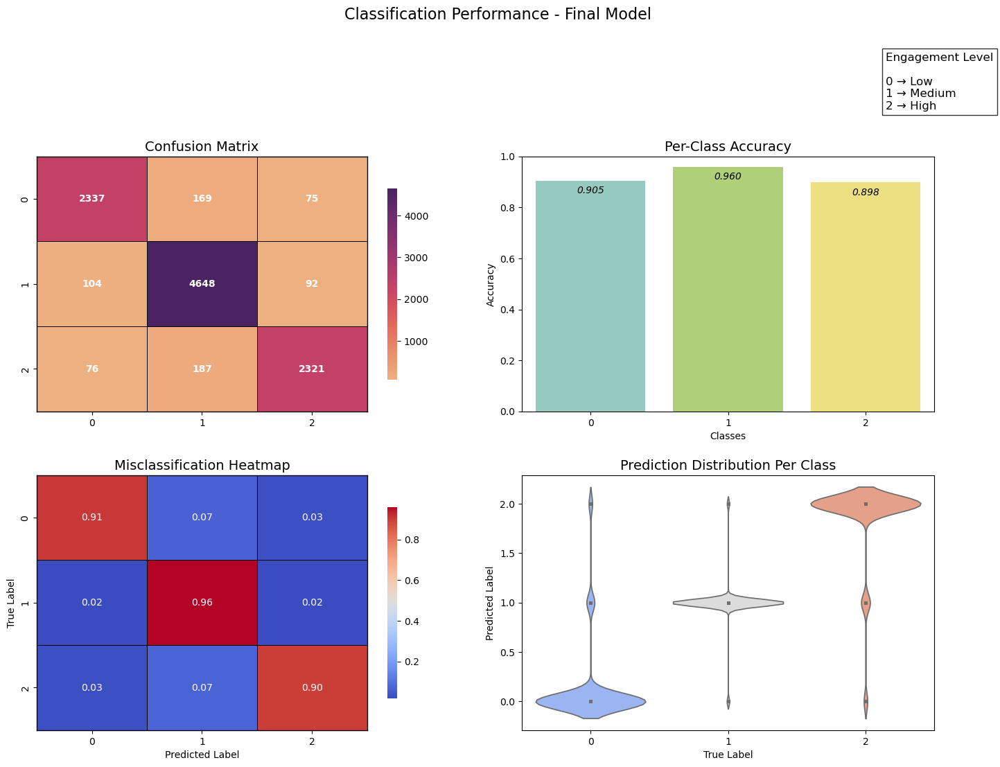

In [12]:
# Model Performance - Final
visualize_model_performance(y_test, y_pred_final, "Final Model")

In [13]:
print("Unique predicted classes", np.unique(y_pred_final))

Unique predicted classes [0. 1. 2.]


In [14]:
# Compute SHAP Values
import shap

shap_values_path = 'data/shap_values.pkl'
dtest = xgb.DMatrix(X_test)

explainer = shap.TreeExplainer(final_model)

if os.path.exists(shap_values_path):
    print("Loading previously saved SHAP values...")
    with open(shap_values_path, 'rb') as file:
        shap_values = pickle.load(file)
else:
    print("Calculating new SHAP values...")
    # Generate SHAP values for the test set
    shap_values = explainer(dtest)

    # Save SHAP values
    with open(shap_values_path, 'wb') as file:
        pickle.dump(shap_values, file)
    print(f"\nSHAP values stored at {shap_values_path}")

Loading previously saved SHAP values...


In [15]:
# Inspect SHAP values

print(f"SHAP values type: {type(shap_values)}")
print(f"SHAP values shape: {shap_values.values.shape}")

SHAP values type: <class 'shap._explanation.Explanation'>
SHAP values shape: (10009, 18, 3)


In [16]:
# We have SHAP values all classes
# Let's split for each class
indices_high = np.where(y_test == 2)[0]
indices_medium = np.where(y_test == 1)[0]
indices_low = np.where(y_test == 0)[0]

shap_values_high = shap_values.values[indices_high, :, 2]
shap_values_medium = shap_values.values[indices_medium, :, 1]
shap_values_low = shap_values.values[indices_low, :, 0]

print(shap_values_high.shape)
print(shap_values_medium.shape)
print(shap_values_low.shape)

(2584, 18)
(4844, 18)
(2581, 18)


In [17]:
short_column_names = {
    "Age": "Age",
    "Gender": "Gen",
    "PlayTimeHours": "PTH",
    "InGamePurchases": "IGP",
    "GameDifficulty": "GDif",
    "SessionsPerWeek": "SesWk",
    "AvgSessionDurationMinutes": "ASMin",
    "PlayerLevel": "PyLvl",
    "AchievementsUnlocked": "AsUnl",
    "AvgPlayTimePerWeek": "APWk",
    "isAddicted": "Adctd",
    "Location_Europe": "LoEU",
    "Location_Other": "LoOTH",
    "Location_USA": "LoUSA",
    "Genre_RPG": "RPG",
    "Genre_Simulation": "Sim",
    "Genre_Sports": "Sport",
    "Genre_Strategy": "Strat"
}

# Function to generate legend using abbreviations for SHAP plots
def show_custom_legend(short_column_names, class_label):
    fig, ax = plt.subplots(figsize=(12, 1))
    ax.axis("off")
    fig.suptitle(f'SHAP Force Plots for {"High" if class_label==2 else "Low"} Predictions', fontsize=16, x=0.525, y=4)

    legend_text = [f"{short_name} – {full_name}" for full_name, short_name in short_column_names.items()]
    
    ax.text(0.99, 0.5, "\n".join(legend_text), ha="right", fontsize=10, fontweight="bold")
    plt.subplots_adjust(right=1.0)
    plt.show()

# Function to create SHAP force plots
def create_force_plot(explainer, shap_values, x_test, idx, class_label, feature_names):
    shap_values_array = np.round(np.array(shap_values[idx]), 2)
    feature_values = np.round(x_test[idx], 2)

    shap.force_plot(
        explainer.expected_value[class_label], 
        shap_values_array,  
        feature_values,
        feature_names=[short_column_names.get(col, col) for col in feature_names],
        matplotlib=True,
        show=False
    )
    
    plt.grid(False)
    plt.gca().set_axisbelow(True)
    plt.show()

# Function to generate SHAP force plots for correctly classified samples
def generate_force_plots(explainer, shap_values, x_test, y_test, short_column_names, feature_names, num_samples=3, class_label=2):
    show_custom_legend(short_column_names, class_label)

    for idx in range(num_samples):
        create_force_plot(explainer, shap_values, x_test, idx, class_label, feature_names)

def generate_summary_plot(shap_values, x_test, class_label):
    plt.title(f'Feature Importance for {"High" if class_label==2 else "Low"} Predictions', fontsize=14)
    if isinstance(x_test, np.ndarray):
        x_test = pd.DataFrame(x_test, columns=short_column_names.keys())
    
    shap.summary_plot(shap_values, x_test, plot_type="bar", show=True, max_display=10)

def generate_dependence_plots(shap_values, x_test, y_test, y_pred, feature_names, class_label):
    x_test = scaler.inverse_transform(x_test)
    
    if isinstance(x_test, np.ndarray):
        x_test = pd.DataFrame(x_test, columns=feature_names)
    
    correct_indices = np.where(y_test == class_label)[0]
    x_test_filtered = x_test.iloc[correct_indices]
    
    # Compute the mean absolute SHAP values to determine feature importance
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    top_features = x_test_filtered.columns[np.argsort(mean_abs_shap)[::-1]]  

    most_important_feature = top_features[0]  
    other_top_features = top_features[1:9]    

    fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(16, 24))
    plt.subplots_adjust(hspace=0.8, wspace=0.7)  

    fig.suptitle(f'SHAP Dependence Plots for {"High" if class_label==2 else "Low"} Predictions - {most_important_feature} vs Other Features', fontsize=18)

    for idx, feature in enumerate(other_top_features):
        row_idx = idx // 2
        col_idx = idx % 2
    
        shap.dependence_plot(feature, shap_values, x_test_filtered, interaction_index=most_important_feature, ax=axs[row_idx, col_idx], show=False)
    
    fig.delaxes(axs[4, 0])
    fig.delaxes(axs[4, 1])
    plt.tight_layout(rect=[0, 0, 1, 1], pad=3.0)
    plt.show()

feature_names = df.drop(columns=["EngagementLevel", "PlayerID"]).columns.to_list()

## Analyze Features Driving “High” predictions for EngagementLevel

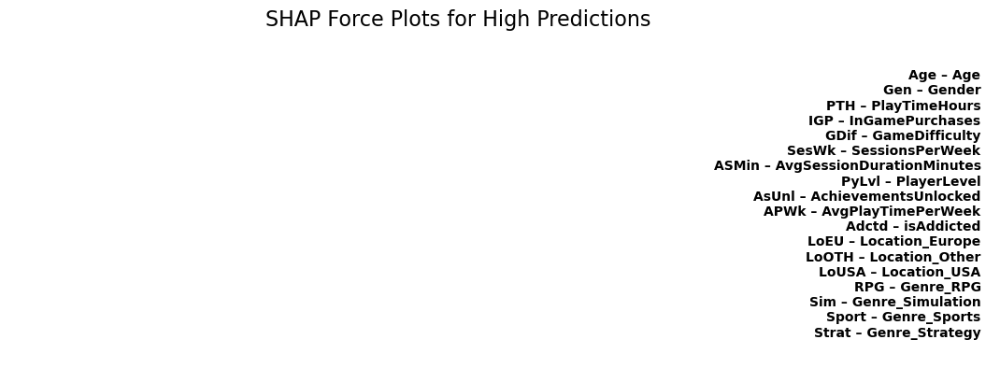

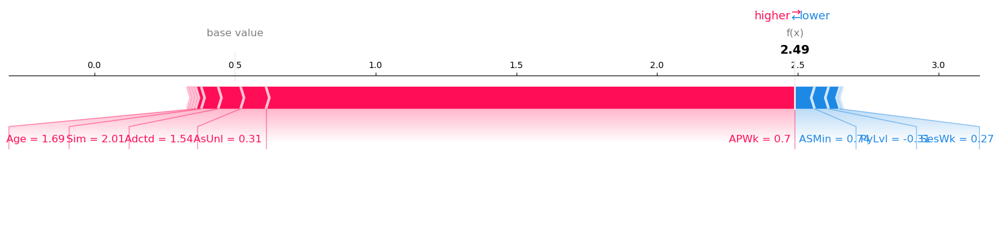

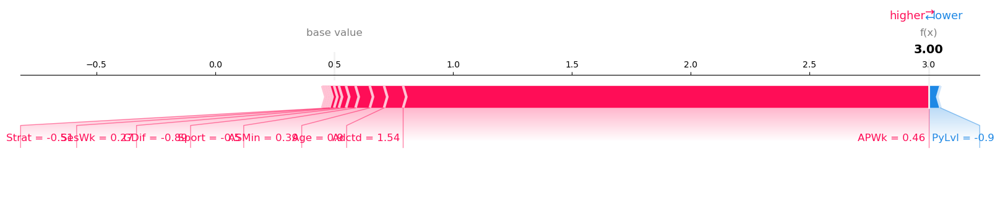

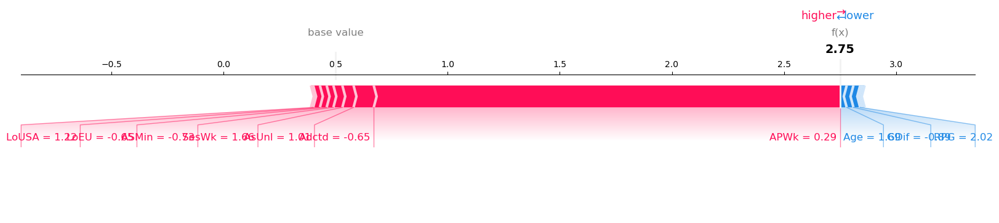

In [18]:
generate_force_plots(explainer, shap_values_high, X_test, y_test, short_column_names, feature_names, num_samples=3, class_label=2)

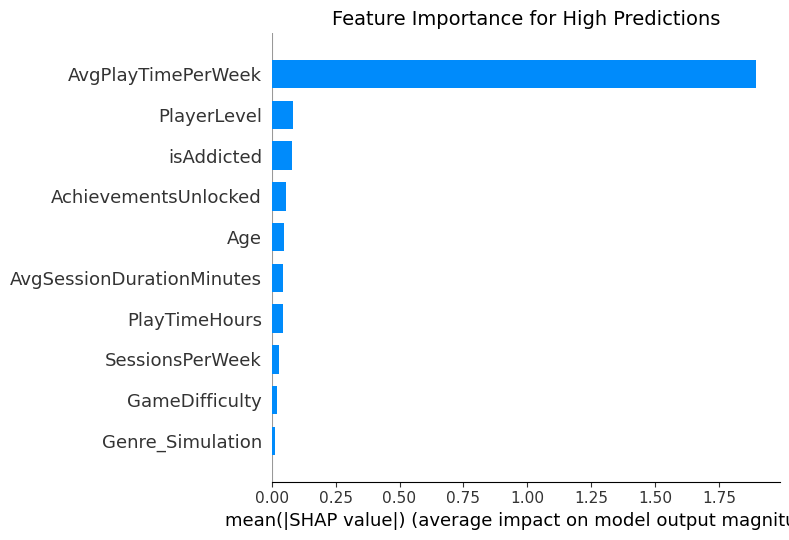

In [19]:
generate_summary_plot(shap_values_high, X_test, class_label=2)

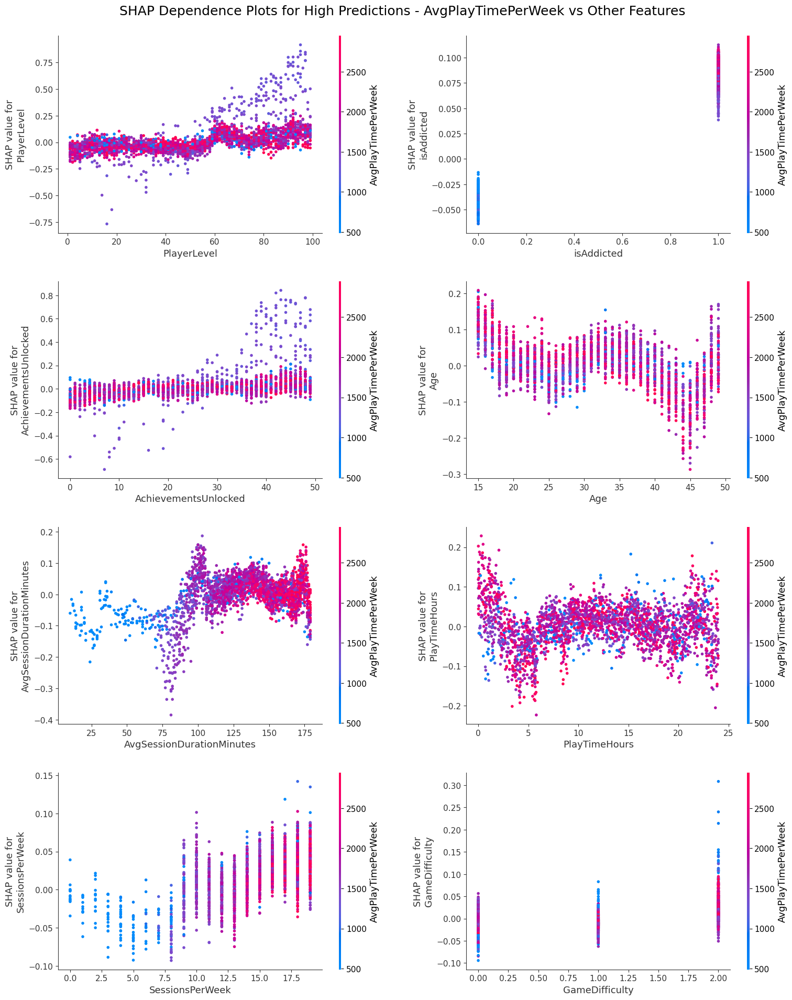

In [20]:
generate_dependence_plots(shap_values_high, X_test, y_test, y_pred_final, feature_names, class_label=2)

## Analyze Features Driving “Low” predictions for EngagementLevel

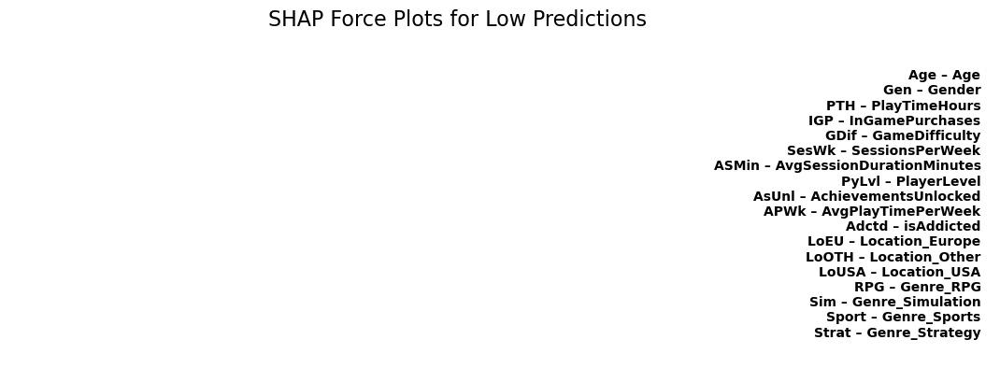

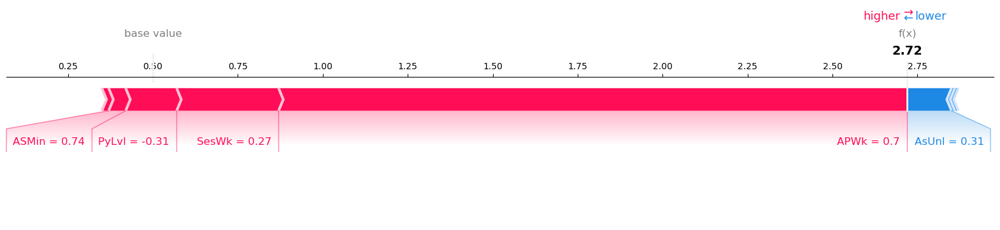

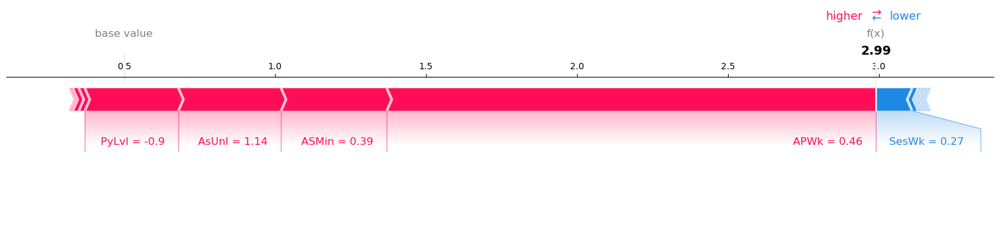

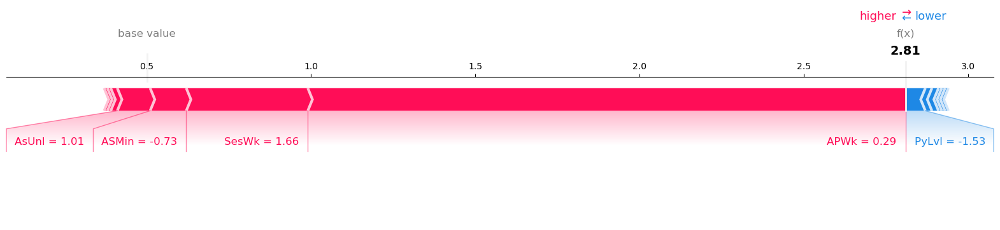

In [21]:
generate_force_plots(explainer, shap_values_low, X_test, y_test, short_column_names, feature_names, num_samples=3, class_label=0)

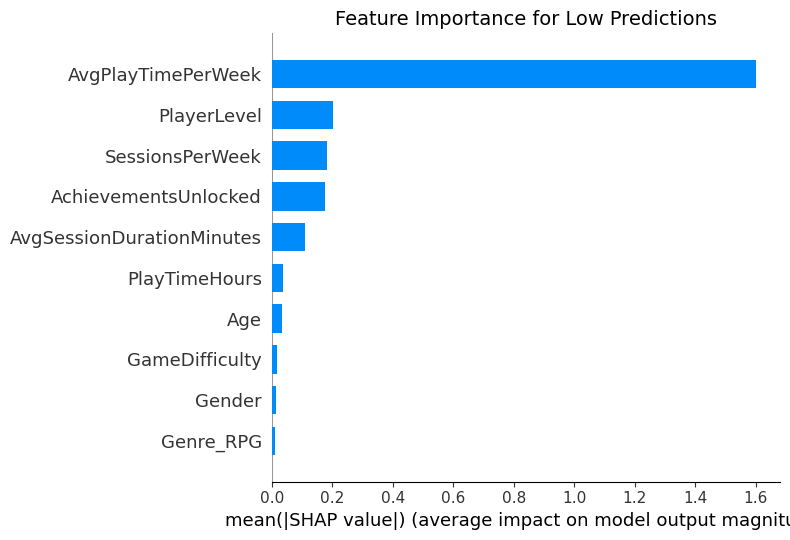

In [22]:
generate_summary_plot(shap_values_low, X_test, 0)

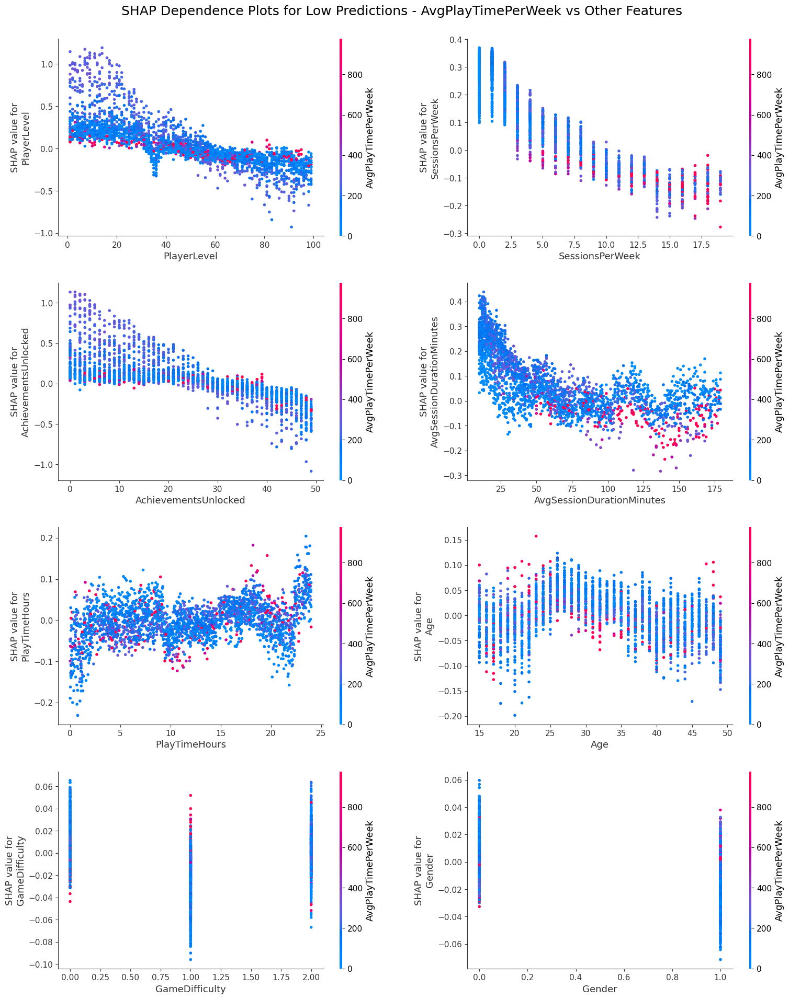

In [23]:
generate_dependence_plots(shap_values_low, X_test, y_test, y_pred_final, feature_names, class_label=0)

## Compare Features Across "High" and "Low" Predictions

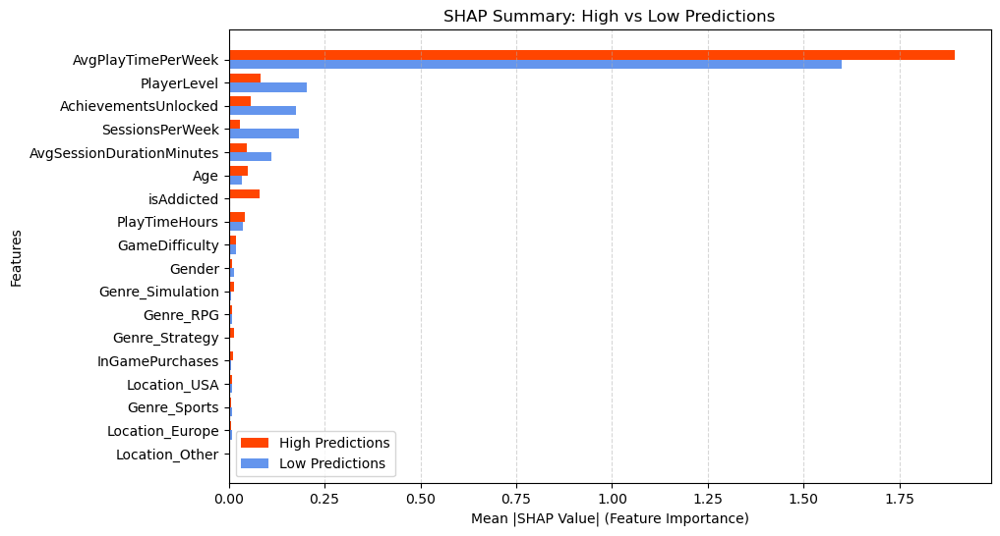

In [24]:
plt.figure(figsize=(10, 6))

mean_abs_shap_high = np.abs(shap_values_high).mean(axis=0)
mean_abs_shap_low = np.abs(shap_values_low).mean(axis=0)

combined_shap = mean_abs_shap_high + mean_abs_shap_low
sorted_indices = np.argsort(combined_shap)[::-1]

sorted_features = [feature_names[i] for i in sorted_indices]
sorted_shap_high = mean_abs_shap_high[sorted_indices]
sorted_shap_low = mean_abs_shap_low[sorted_indices]

bar_width = 0.4
x_pos = np.arange(len(sorted_features))

plt.barh(x_pos - bar_width/2, sorted_shap_high, height=bar_width, color="orangered", label="High Predictions")
plt.barh(x_pos + bar_width/2, sorted_shap_low, height=bar_width, color="cornflowerblue", label="Low Predictions")

plt.xlabel("Mean |SHAP Value| (Feature Importance)")
plt.ylabel("Features")
plt.title("SHAP Summary: High vs Low Predictions")
plt.yticks(x_pos, sorted_features)
plt.legend()
plt.gca().invert_yaxis()
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

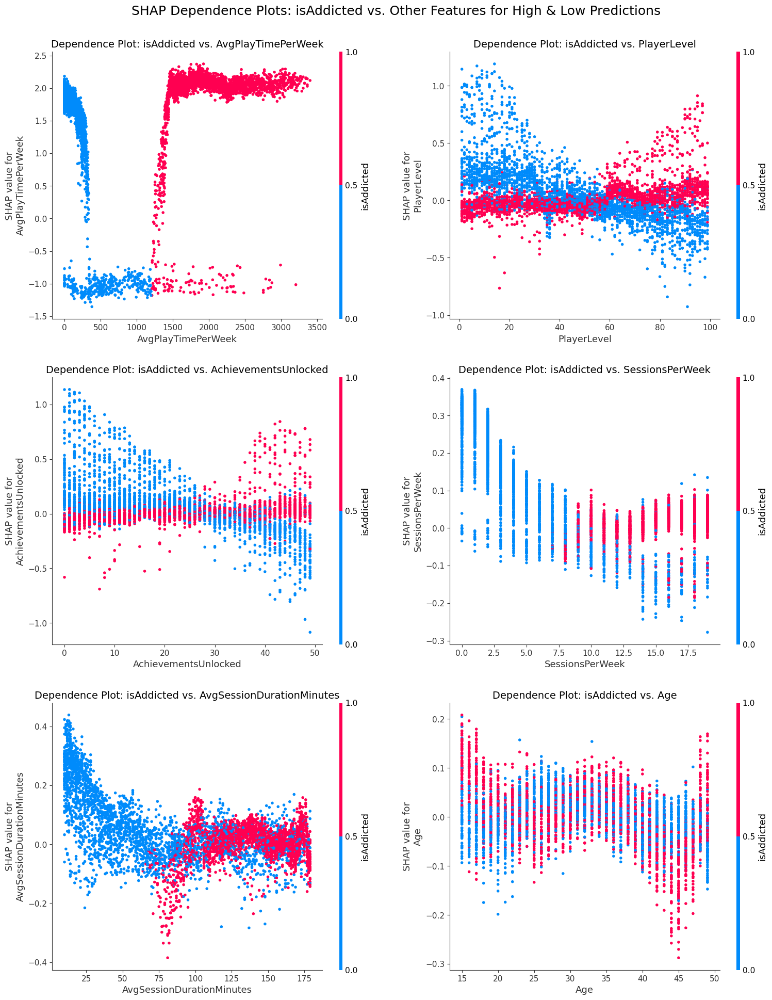

In [25]:
def visualize_isAddicted_interactions(shap_values_high, shap_values_low, x_test, y_test, feature_names):
    x_test = scaler.inverse_transform(x_test)
    
    important_features = [
        "AvgPlayTimePerWeek",
        "PlayerLevel",
        "AchievementsUnlocked",
        "SessionsPerWeek",
        "AvgSessionDurationMinutes",
        "Age"  
    ]

    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(16, 20))
    plt.subplots_adjust(hspace=0.6, wspace=0.5)

    fig.suptitle("SHAP Dependence Plots: isAddicted vs. Other Features for High & Low Predictions", fontsize=18)

    indices_high = np.where((y_test == 2))[0]
    indices_low = np.where((y_test == 0))[0]

    x_test = pd.DataFrame(x_test, columns=feature_names)
    x_test_high = x_test.iloc[indices_high]
    x_test_low = x_test.iloc[indices_low]

    combined_shap_values = np.vstack((shap_values_high, shap_values_low))
    combined_x_test = pd.concat([x_test_high, x_test_low])

    for idx, feature in enumerate(important_features):
        row_idx = idx // 2
        col_idx = idx % 2

        shap.dependence_plot(
            feature, combined_shap_values, combined_x_test,
            interaction_index="isAddicted",
            ax=axs[row_idx, col_idx],
            show=False
        )

        axs[row_idx, col_idx].set_title(f"Dependence Plot: isAddicted vs. {feature}", fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 1], pad=3.0)
    plt.show()

visualize_isAddicted_interactions(shap_values_high, shap_values_low, X_test, y_test, feature_names)